# <div style="color:orange;">[Olist] Segmentation clients - Essais</div>

<img src="img/olist_logo.jpg" style="height: 150px;">

# <div style="color:blue" id="ch0">0. Plan du Notebook</div>

1. [Imports et fonctions générales](#ch1)<br><br>

2. [Jeu RMF](#ch2)<br>
>2.1 [RFM : Nombre de clusters](#ch2_1)<br>
>2.2 [RFM : K-means et visualisation](#ch2_2)<br>
>2.3 [RFM : Conclusion](#ch2_3)<br>

3. [Ajout de variables](#ch3)<br>
>3.1 [Etudes des autres variables calculées](#ch3_1)<br>
>3.2 [Essais avec différentes variables](#ch3_2)<br>
>3.3 [Etude approfondie des configurations d'intérêt](#ch3_3)<br>
>3.4 [Conclusion sur K-Means](#ch3_4)<br>

4. [Clustering alternatif](#ch4)<br>
>4.1 [DBSCAN](#ch4_1)<br>
>4.2 [Clustering hiérarchique](#ch4_2)<br>

5. [Conclusion](#ch4)

<img src="img/olist_db.png" style="height: 400px;">

Construisant sur l'analyse exploratoire et le feature engineering réalisé dans le précédent notebook, nous allons ici passer les deux jeux de données créés à des algorithmes de clustering non supervisés afin de segmenter notre population client.

[*(Retour sommaire)*](#ch0)

# <div id="ch1" style="color: blue">1. Imports et fonctions générales</div>

In [1]:
import re
import random as rd
import numpy as np
import pandas as pd
import matplotlib.patches as mpatches
import matplotlib.ticker as ticker
import matplotlib.pyplot as plt
import matplotlib.cm as cm
import seaborn as sns
from ds_utils.unsupervised import plot_cluster_cardinality
from ds_utils.unsupervised import plot_cluster_magnitude
from ds_utils.unsupervised import plot_magnitude_vs_cardinality
from scipy.spatial.distance import euclidean
from yellowbrick.cluster import KElbowVisualizer
from sklearn.preprocessing import StandardScaler
from sklearn.decomposition import PCA
from sklearn.manifold import TSNE
from sklearn.cluster import KMeans
from sklearn.cluster import DBSCAN
from sklearn.cluster import AgglomerativeClustering
from sklearn.metrics import silhouette_score
from sklearn.metrics import silhouette_samples
from sklearn.metrics import adjusted_rand_score
from scipy.cluster.hierarchy import dendrogram

In [2]:
# Source : https://openclassrooms.com/fr/courses/4525281-realisez-une-analyse-exploratoire-de-donnees/5345201-tp-realisez-une-acp
from matplotlib.collections import LineCollection

def display_circles(pcs, n_comp, pca, axis_ranks, labels=None, label_rotation=0, lims=None):
    for d1, d2 in axis_ranks:
        if d2 < n_comp:
            fig, ax = plt.subplots(figsize=(7,6))
            if lims is not None :
                xmin, xmax, ymin, ymax = lims
            elif pcs.shape[1] < 30 :
                xmin, xmax, ymin, ymax = -1, 1, -1, 1
            else :
                xmin, xmax, ymin, ymax = min(pcs[d1,:]), max(pcs[d1,:]), min(pcs[d2,:]), max(pcs[d2,:])
            if pcs.shape[1] < 30 :
                plt.quiver(np.zeros(pcs.shape[1]), np.zeros(pcs.shape[1]),
                   pcs[d1,:], pcs[d2,:], 
                   angles='xy', scale_units='xy', scale=1, color="grey")
            else:
                lines = [[[0,0],[x,y]] for x,y in pcs[[d1,d2]].T]
                ax.add_collection(LineCollection(lines, axes=ax, alpha=.1, color='black'))
            if labels is not None:  
                for i,(x, y) in enumerate(pcs[[d1,d2]].T):
                    if x >= xmin and x <= xmax and y >= ymin and y <= ymax :
                        plt.text(x, y, labels[i], fontsize='14', ha='center', va='center',
                                 rotation=label_rotation, color="blue", alpha=0.5)
            circle = plt.Circle((0,0), 1, facecolor='none', edgecolor='b')
            plt.gca().add_artist(circle)
            plt.xlim(xmin, xmax)
            plt.ylim(ymin, ymax)
            plt.plot([-1, 1], [0, 0], color='grey', ls='--')
            plt.plot([0, 0], [-1, 1], color='grey', ls='--')
            plt.xlabel('F{} ({}%)'.format(d1+1, round(100*pca.explained_variance_ratio_[d1],1)))
            plt.ylabel('F{} ({}%)'.format(d2+1, round(100*pca.explained_variance_ratio_[d2],1)))
            plt.title("Cercle des corrélations (F{} et F{})".format(d1+1, d2+1))
            plt.show(block=False)
        
def display_factorial_planes(X_projected, n_comp, pca, axis_ranks, labels=None, alpha=1, 
                             illustrative_var=None):
    for d1,d2 in axis_ranks:
        if d2 < n_comp:  
            fig = plt.figure(figsize=(7,6))
            if illustrative_var is None:
                plt.scatter(X_projected[:, d1], X_projected[:, d2], alpha=alpha)
            else:
                illustrative_var = np.array(illustrative_var)
                for value in np.unique(illustrative_var):
                    selected = np.where(illustrative_var == value)
                    plt.scatter(X_projected[selected, d1], X_projected[selected, d2],
                                alpha=alpha, label=value)
                plt.legend()
            if labels is not None:
                for i,(x,y) in enumerate(X_projected[:,[d1,d2]]):
                    plt.text(x, y, labels[i],
                              fontsize='14', ha='center',va='center') 
            boundary = np.max(np.abs(X_projected[:, [d1,d2]])) * 1.1
            plt.xlim([-boundary,boundary])
            plt.ylim([-boundary,boundary])
            plt.plot([-100, 100], [0, 0], color='grey', ls='--')
            plt.plot([0, 0], [-100, 100], color='grey', ls='--')
            plt.xlabel('F{} ({}%)'.format(d1+1, round(100*pca.explained_variance_ratio_[d1],1)))
            plt.ylabel('F{} ({}%)'.format(d2+1, round(100*pca.explained_variance_ratio_[d2],1)))
            plt.title("Projection des individus (sur F{} et F{})".format(d1+1, d2+1))
            plt.show(block=False)

def display_scree_plot(pca):
    scree = pca.explained_variance_ratio_*100
    plt.bar(np.arange(len(scree))+1, scree)
    plt.plot(np.arange(len(scree))+1, scree.cumsum(),c="red",marker='o')
    plt.xlabel("rang de l'axe d'inertie")
    plt.ylabel("pourcentage d'inertie")
    plt.title("Eboulis des valeurs propres")
    plt.show(block=False)
    
def display_pca(df, split=None, n_comp=6):
    X = df.values
    features = df.columns
    X_scaled = StandardScaler().fit_transform(X)
    pca = PCA(n_components=n_comp)
    pca.fit(X_scaled)
    display_scree_plot(pca)
    pcs = pca.components_
    if n_comp == 2:
        display_circles(pcs, n_comp, pca, [(0,1)], labels=np.array(features))
        X_projected = pca.transform(X_scaled)
        display_factorial_planes(X_projected, n_comp, pca, [(0,1)], alpha=0.5, illustrative_var=split)
    elif n_comp == 4:
        display_circles(pcs, n_comp, pca, [(0,1), (2, 3)], labels=np.array(features))
        X_projected = pca.transform(X_scaled)
        display_factorial_planes(X_projected, n_comp, pca, [(0,1), (2, 3)], alpha=0.5, illustrative_var=split)
    else:
        display_circles(pcs, n_comp, pca, [(0,1), (2, 3), (4, 5)], labels=np.array(features))
        X_projected = pca.transform(X_scaled)
        display_factorial_planes(X_projected, n_comp, pca, [(0,1), (2, 3), (4, 5)], alpha=0.5, illustrative_var=split)
    plt.show()

In [3]:
#Source : https://towardsdatascience.com/best-practices-for-visualizing-your-cluster-results-20a3baac7426
def cluster_comparison_bar(X, X_comparison, colors, deviation=True, title="Cluster results"):
    features = X_comparison.index
    ncols = 3
    nrows = len(features) // ncols + (len(features) % ncols > 0)
    fig = plt.figure(figsize=(15, 10), dpi=200)
    for n, feature in enumerate(features):
        ax = plt.subplot(nrows, ncols, n + 1)
        X_comparison[X_comparison.index == feature].plot(
            kind='bar', ax=ax, title=feature, color=colors[0:X.cluster.nunique()], legend=False)
        plt.axhline(y=0)
        x_axis = ax.axes.get_xaxis()
        x_axis.set_visible(False)
    c_labels = X_comparison.columns.to_list()
    c_colors = colors[0:3]
    mpats = [mpatches.Patch(color=c, label=l) for c, l in list(zip(colors[0:X.cluster.nunique()],
                                                                  X_comparison.columns.to_list()))]
    fig.legend(handles=mpats, ncol=ncols, loc="upper center", fancybox=True, bbox_to_anchor=(0.5, 0.98))
    axes = fig.get_axes()
    fig.suptitle(title, fontsize=18, y=1)
    fig.supylabel('Deviation from overall mean in %')
    plt.tight_layout()
    plt.subplots_adjust(top=0.93)
    plt.show()

In [4]:
#Source : https://towardsdatascience.com/best-practices-for-visualizing-your-cluster-results-20a3baac7426
class Radar(object):
    
    def __init__(self, figure, title, labels, rect=None):
        if rect is None:
            rect = [0.05, 0.05, 0.9, 0.9]
        self.n = len(title)
        self.angles = np.arange(0, 360, 360.0/self.n)
        self.axes = [figure.add_axes(rect, projection='polar', label='axes%d' % i) for i in range(self.n)]
        self.ax = self.axes[0]
        self.ax.set_thetagrids(self.angles, labels=title, fontsize=14, backgroundcolor="white", zorder=999)
        self.ax.set_yticklabels([])
        for ax in self.axes[1:]:
            ax.xaxis.set_visible(False)
            ax.set_yticklabels([])
            ax.set_zorder(-99)
        for ax, angle, label in zip(self.axes, self.angles, labels):
            ax.spines['polar'].set_color('black')
            ax.spines['polar'].set_zorder(-99)
            
    def plot(self, values, *args, **kw):
        angle = np.deg2rad(np.r_[self.angles, self.angles[0]])
        values = np.r_[values, values[0]]
        self.ax.plot(angle, values, *args, **kw)
        kw['label'] = '_noLabel'
        self.ax.fill(angle, values,*args,**kw)

In [5]:
def elbow_visu(data, cluster_min, cluster_max):
    fig, ax = plt.subplots()
    visualizer = KElbowVisualizer(KMeans(random_state=0), k=(cluster_min, cluster_max + 1), ax=ax)
    visualizer.fit(data)
    ax.set_xticks(range(cluster_min, cluster_max + 1))
    visualizer.show()
    plt.show()

In [6]:
#Source : https://towardsdatascience.com/best-practices-for-visualizing-your-cluster-results-20a3baac7426
def silhouette_visu(data, min_cluster, max_cluster):
    silhouette_scores = []
    for k in range(min_cluster, max_cluster + 1):
        km = KMeans(n_clusters=k, 
                    max_iter=300, 
                    tol=1e-04, 
                    init='k-means++', 
                    n_init=10, 
                    random_state=0, 
                    algorithm='auto')
        km.fit(data)
        silhouette_scores.append(silhouette_score(data, km.labels_))
    fig, ax = plt.subplots()
    ax.plot(range(min_cluster, max_cluster + 1), silhouette_scores, 'bx-')
    ax.set_title('Silhouette Score Method')
    ax.set_xlabel('Number of clusters')
    ax.set_ylabel('Silhouette Scores')
    plt.xticks(range(min_cluster, max_cluster + 1))
    plt.tight_layout()
    plt.show()
    for n_clusters in range(min_cluster, max_cluster + 1):
        fig, (ax1, ax2) = plt.subplots(1, 2)
        fig.set_size_inches(18, 7)
        ax1.set_xlim([-0.1, 1])
        ax1.set_ylim([0, len(data) + (n_clusters + 1) * 10])
        clusterer = KMeans(n_clusters=n_clusters, random_state=0)
        cluster_labels = clusterer.fit_predict(data)
        silhouette_avg = silhouette_score(data, cluster_labels)
        print(f"For n_clusters = {n_clusters}, the average silhouette score is : {silhouette_avg}")
        sample_silhouette_values = silhouette_samples(data, cluster_labels)
        y_lower = 10
        for i in range(n_clusters):
            ith_cluster_silhouette_values = sample_silhouette_values[cluster_labels == i]
            ith_cluster_silhouette_values.sort()
            size_cluster_i = ith_cluster_silhouette_values.shape[0]
            y_upper = y_lower + size_cluster_i
            color = cm.nipy_spectral(float(i) / n_clusters)
            ax1.fill_betweenx(
                np.arange(y_lower, y_upper),
                0,
                ith_cluster_silhouette_values,
                facecolor=color,
                edgecolor=color,
                alpha=0.7,
            )
            ax1.text(-0.05, y_lower + 0.5 * size_cluster_i, str(i))
            y_lower = y_upper + 10
        ax1.set_title("The silhouette plot for the various clusters.")
        ax1.set_xlabel("The silhouette coefficient values")
        ax1.set_ylabel("Cluster label")
        ax1.axvline(x=silhouette_avg, color="red", linestyle="--")
        ax1.set_yticks([])
        ax1.set_xticks([-0.1, 0, 0.2, 0.4, 0.6, 0.8, 1])
        colors = cm.nipy_spectral(cluster_labels.astype(float) / n_clusters)
        ax2.scatter(
            data.iloc[:, 0], data.iloc[:, 1], marker=".", s=30, lw=0, alpha=0.7, c=colors, edgecolor="k"
        )
        centers = clusterer.cluster_centers_
        ax2.scatter(
            centers[:, 0],
            centers[:, 1],
            marker="o",
            c="white",
            alpha=1,
            s=200,
            edgecolor="k",
        )
        for i, c in enumerate(centers):
            ax2.scatter(c[0], c[1], marker="$%d$" % i, alpha=1, s=50, edgecolor="k")
        ax2.set_title("The visualization of the clustered data.")
        ax2.set_xlabel("Feature space for the 1st feature")
        ax2.set_ylabel("Feature space for the 2nd feature")
        plt.suptitle(
            "Silhouette analysis for KMeans clustering on sample data with n_clusters = %d"
            % n_clusters,
            fontsize=14,
            fontweight="bold",
        )
    plt.show()

In [7]:
def silhouette_graph(data, min_cluster, max_cluster):
    silhouette_scores = []
    for k in range(min_cluster, max_cluster + 1):
        km = KMeans(n_clusters=k, 
                    max_iter=300, 
                    tol=1e-04, 
                    init='k-means++', 
                    n_init=10, 
                    random_state=0, 
                    algorithm='auto')
        km.fit(data)
        silhouette_scores.append(silhouette_score(data, km.labels_))
    fig, ax = plt.subplots()
    ax.plot(range(min_cluster, max_cluster + 1), silhouette_scores, 'bx-')
    ax.set_title('Silhouette Score Method')
    ax.set_xlabel('Number of clusters')
    ax.set_ylabel('Silhouette Scores')
    plt.xticks(range(min_cluster, max_cluster + 1))
    plt.tight_layout()
    plt.show()

In [8]:
def cardinality_magnitude(scaled_data, algo_fitted, nb_clusters):
    colors = cluster_colors(nb_clusters)
    fig, (ax1, ax2, ax3) = plt.subplots(1,3,figsize=(12,4))
    plot_cluster_cardinality(algo_fitted.labels_, ax=ax1, title="Cardinality", color=colors)
    plot_cluster_magnitude(scaled_data, algo_fitted.labels_, algo_fitted.cluster_centers_, euclidean, ax=ax2,
                           title="Magnitude", color=colors)
    plot_magnitude_vs_cardinality(scaled_data, algo_fitted.labels_, algo_fitted.cluster_centers_, euclidean,
                                  color=colors, ax=ax3, title="Magnitude vs. Cardinality")
    fig.autofmt_xdate(rotation=0)
    plt.tight_layout()
    plt.show()

In [9]:
def tsne_visu(scaled_data, algo_fitted, nb_clusters):
    tsne = TSNE(n_components=2, init='pca')
    X_trans = tsne.fit_transform(scaled_data)
    plt.figure()
    for i in range(scaled_data.shape[0]):
        plt.text(X_trans[i, 0], X_trans[i, 1], str('%d' % algo_fitted.labels_[i]),
                color=plt.cm.Set2(algo_fitted.labels_[i] / nb_clusters))
    plt.xlim([np.min(X_trans[:, 0]), np.max(X_trans[:, 0])])
    plt.ylim([np.min(X_trans[:, 1]), np.max(X_trans[:, 1])])
    plt.show()

In [10]:
def boxplot_visu(raw_data, algo):
    features = algo.feature_names_in_
    colors = cluster_colors(len(features))
    ncols = 4
    nrows = len(features) // ncols + (len(features) % ncols > 0)
    fig = plt.figure(figsize=(15, 10))
    for n, feature in enumerate(features):
        if feature != 'cluster':
            ax = plt.subplot(nrows, ncols, n + 1)
            box = raw_data[[feature, 'cluster']].boxplot(
                by='cluster', ax=ax, return_type='both', patch_artist=True)
            for row_key, (ax, row) in box.iteritems():
                ax.set_xlabel('cluster')
                ax.set_title(feature, fontweight="bold")
                for i, box in enumerate(row['boxes']):
                    box.set_facecolor(colors[i])
    fig.suptitle('Feature distributions per cluster', fontsize=18, y=1)   
    plt.tight_layout()
    plt.show()

In [11]:
def boxplot_agg_visu(raw_data, algo):
    features = algo.n_features_in_
    colors = cluster_colors(len(features))
    ncols = 4
    nrows = len(features) // ncols + (len(features) % ncols > 0)
    fig = plt.figure(figsize=(15, 10))
    for n, feature in enumerate(features):
        if feature != 'cluster':
            ax = plt.subplot(nrows, ncols, n + 1)
            box = raw_data[[feature, 'cluster']].boxplot(
                by='cluster', ax=ax, return_type='both', patch_artist=True)
            for row_key, (ax, row) in box.iteritems():
                ax.set_xlabel('cluster')
                ax.set_title(feature, fontweight="bold")
                for i, box in enumerate(row['boxes']):
                    box.set_facecolor(colors[i])
    fig.suptitle('Feature distributions per cluster', fontsize=18, y=1)   
    plt.tight_layout()
    plt.show()

In [12]:
def barplot_visu(X_dev_rel, nb_features):
    colors = cluster_colors(nb_features)
    fig = plt.figure(figsize=(10, 5), dpi=200)
    X_dev_rel.T.plot(
        kind='bar', ax=fig.add_subplot(), title="Cluster characteristics", color=colors, xlabel="Cluster",
        ylabel="Deviation from overall mean in %")
    plt.axhline(y=0, linewidth=1, ls='--', color='black')
    plt.legend(bbox_to_anchor=(1.04,1))
    fig.autofmt_xdate(rotation=0)
    plt.tight_layout()
    plt.show()

In [13]:
def radarplot_visu(X_std_mean, algo):
    fig = plt.figure(figsize=(8, 8))
    feats = algo.feature_names_in_
    if 'cluster' in feats:
        feats = feats[feats != 'cluster']
    no_features = len(feats)
    radar = Radar(fig, feats, np.unique(algo.labels_))
    colors = cluster_colors(algo.n_clusters)
    for k in range(0, algo.n_clusters):
        cluster_data = X_std_mean[k].values.tolist()
        radar.plot(cluster_data,  '-', lw=2, color=colors[k], alpha=0.7, label='cluster {}'.format(k))
    radar.ax.legend()
    radar.ax.set_title("Cluster characteristics: Feature means per cluster", size=22, pad=60)
    plt.show()

In [14]:
def data_mean_std(raw_data, scaled_data):
    X_mean = pd.concat([pd.DataFrame(raw_data.mean().drop('cluster'), columns=['mean']),
                        raw_data.groupby('cluster').mean().T], axis=1)
    X_dev_rel = X_mean.apply(lambda x: round((x - x['mean']) / x['mean'], 2) * 100, axis = 1)
    X_dev_rel.drop(columns=['mean'], inplace=True)
    X_mean.drop(columns=['mean'], inplace=True)
    X_std_mean = pd.concat([pd.DataFrame(scaled_data.mean().drop('cluster'), columns=['mean']),
                            scaled_data.groupby('cluster').mean().T], axis=1)
    X_std_dev_rel = X_std_mean.apply(lambda x: round((x - x['mean']) / x['mean'], 2) * 100, axis = 1)
    X_std_dev_rel.drop(columns=['mean'], inplace=True)
    X_std_mean.drop(columns=['mean'], inplace=True)
    return X_dev_rel, X_std_mean

In [15]:
def cluster_colors(nb_clusters):
    colors = []
    rd.seed()
    for i in range(nb_clusters):
        r = rd.randint(0, 255)
        g = rd.randint(0, 255)
        b = rd.randint(0, 255)
        rgb = (r, g, b)
        colors.append('#' + '%02x%02x%02x' % rgb)
    return colors

In [16]:
rfm = pd.read_csv('data/rfm.csv')
fea = pd.read_csv('data/featured.csv')

[*(Retour sommaire)*](#ch0)

# <div id="ch2" style="color: blue">2. Jeu RFM</div>

## <div id="ch2_1" style="color: orange;">2.1 Nombre de clusters</div>

In [151]:
rfm.head()

,customer_unique_id,purchase_frequency,payment_last,purchase_recence,nb_orders,payment_total,payment_mean
0,87ab9fec999db8bd5774917de3cdf01c,0.038462,89.71,0,1,89.71,89.71
1,262e1f1e26e92e86375f86840b4ffd63,0.076923,222.03,-1,2,444.06,222.03
2,af5454198a97379394cacf676e1e96cb,0.115385,197.55,-14,3,592.65,197.55
3,634420a0ea42302205032ed44ac7fccc,0.076923,80.38,-17,2,160.76,80.38
4,9bb92bebd4cb7511e1a02d5e50bc4655,0.038462,137.03,-19,1,137.03,137.03


### Centrage-Réduction des données par StandardScaler

In [17]:
rfm_raw = rfm.drop('customer_unique_id', axis=1)
scaler = StandardScaler()
X_std = scaler.fit_transform(rfm_raw)
rfm_scaled = pd.DataFrame(X_std, columns=rfm_raw.columns)

### Détermination du nombre de clusters par la méthode du coude

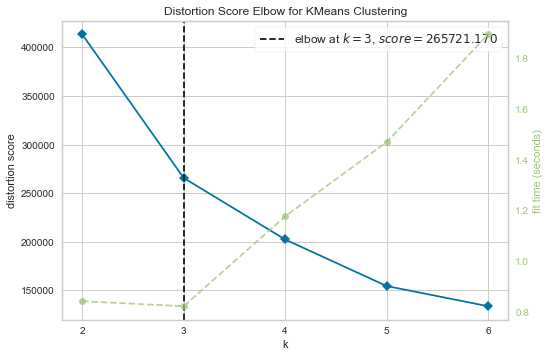

In [156]:
elbow_visu(rfm_scaled, 2, 6)

### Détermination du nombre de clusters par le score de silhouette

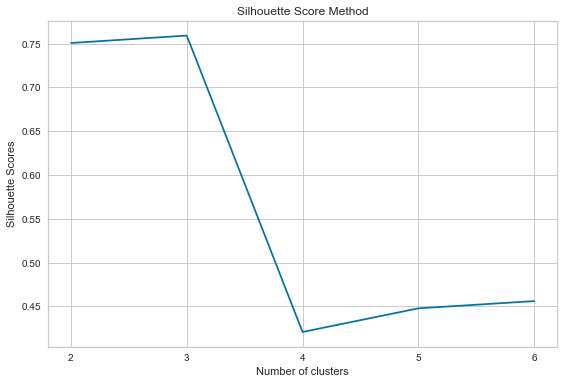

For n_clusters = 2, the average silhouette score is : 0.7506743769825065
For n_clusters = 3, the average silhouette score is : 0.7591862342548195
For n_clusters = 4, the average silhouette score is : 0.4207792804151877
For n_clusters = 5, the average silhouette score is : 0.44776450214083646
For n_clusters = 6, the average silhouette score is : 0.45603362307409395


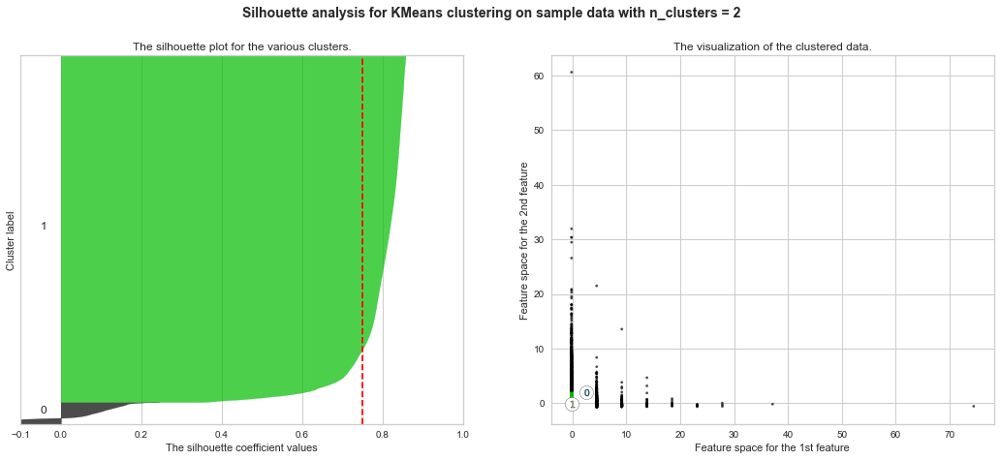

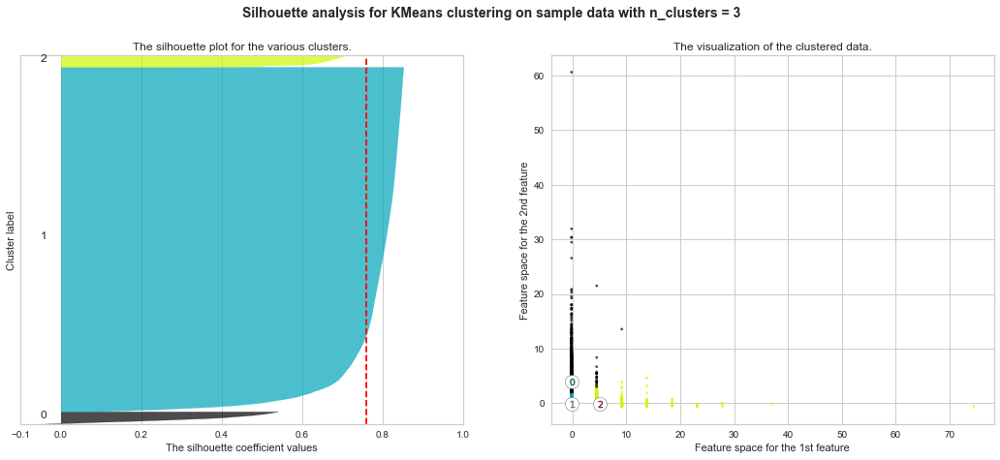

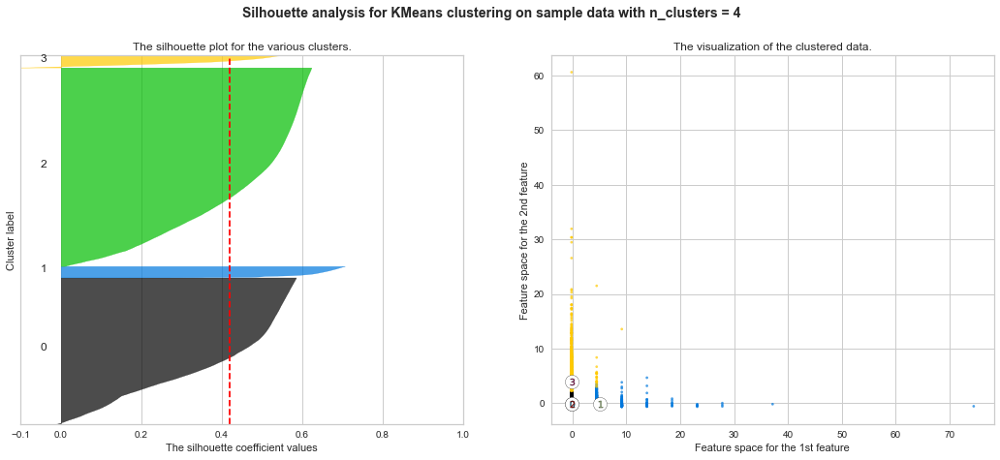

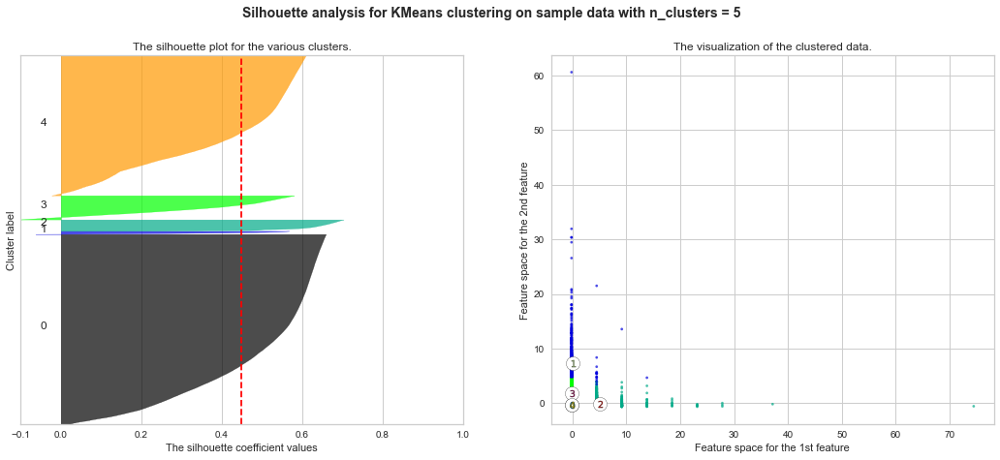

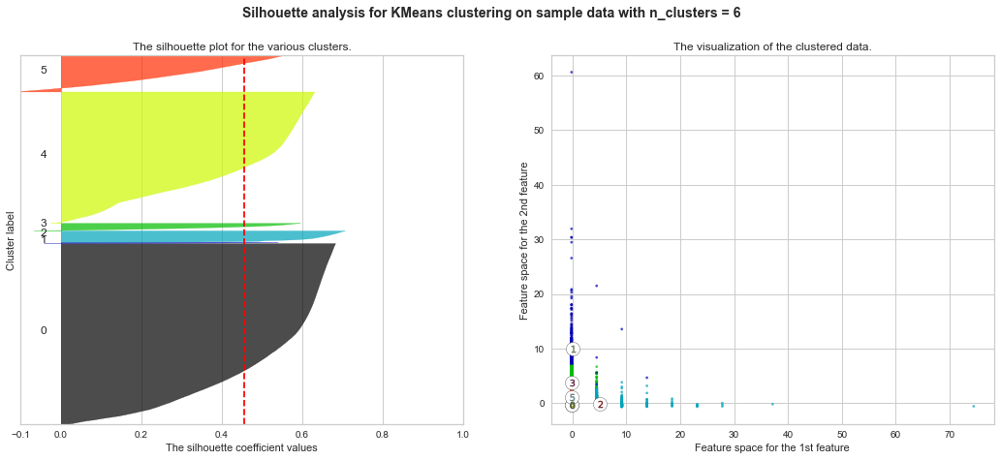

In [160]:
silhouette_visu(rfm_scaled, 2, 6)

[*(Retour sommaire)*](#ch0)

<div class="alert alert-block alert-info">
Dans la suite de ce chapitre, nous partirons sur une semgentation en 3 clusters, car cette configuration a été désignée par la méthdode du coude et a reçu le meilleur score de silhouette
</div>

## <div id="ch2_2" style="color: orange;">2.2 K-Means</div>

In [23]:
km = KMeans(n_clusters=3, max_iter=300, tol=1e-04, init='k-means++', n_init=10, random_state=0, algorithm='auto')
km_fit = km.fit(rfm_scaled)

### Cardinalité et magnitude

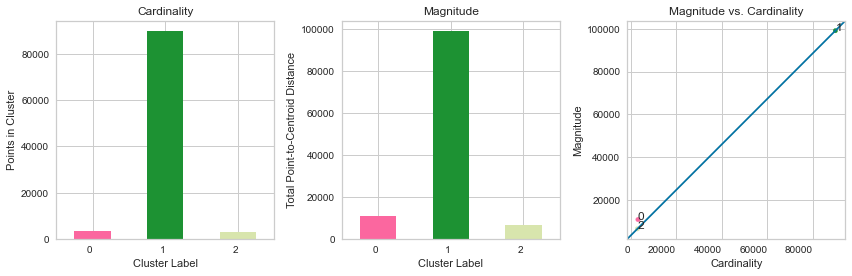

In [166]:
cardinality_magnitude(rfm_scaled, km_fit, 3)

### Visualisation des clusters

Avec t-SNE

C:\Users\aledo\anaconda3\envs\p5\lib\site-packages\sklearn\manifold\_t_sne.py:790: FutureWarning: The default learning rate in TSNE will change from 200.0 to 'auto' in 1.2.
  warnings.warn(
C:\Users\aledo\anaconda3\envs\p5\lib\site-packages\sklearn\manifold\_t_sne.py:982: FutureWarning: The PCA initialization in TSNE will change to have the standard deviation of PC1 equal to 1e-4 in 1.2. This will ensure better convergence.
  warnings.warn(


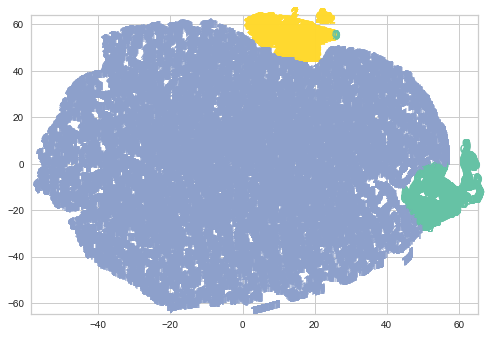

In [171]:
tsne_visu(rfm_scaled, km_fit, 3)

Avec ACP

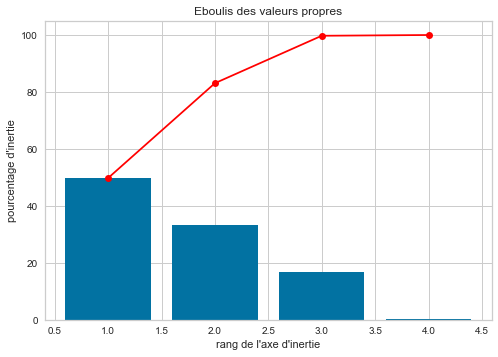

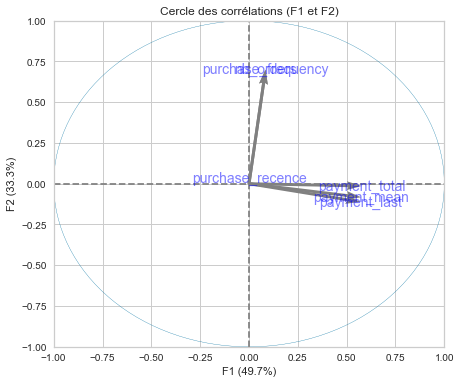

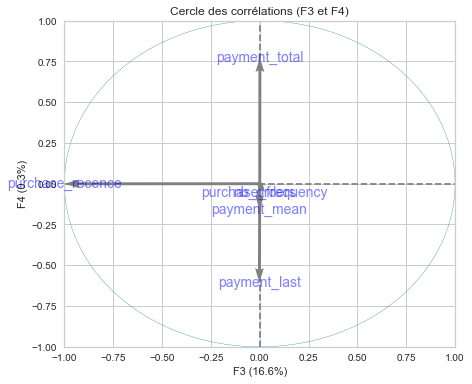

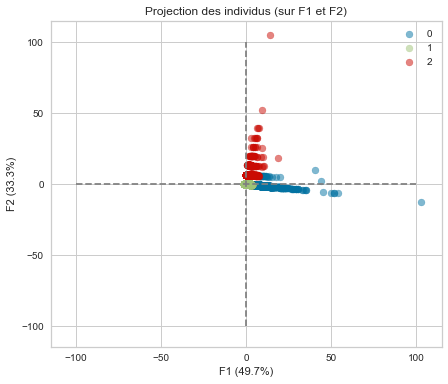

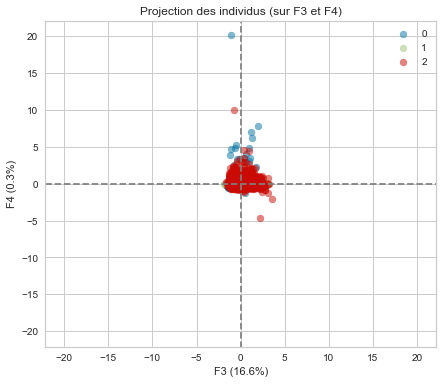

In [172]:
display_pca(rfm_scaled, split=km_fit.labels_, n_comp=4)

### Détail par variable

In [24]:
rfm['cluster'] = km.labels_
rfm_scaled['cluster'] = km.labels_

Via boxplot

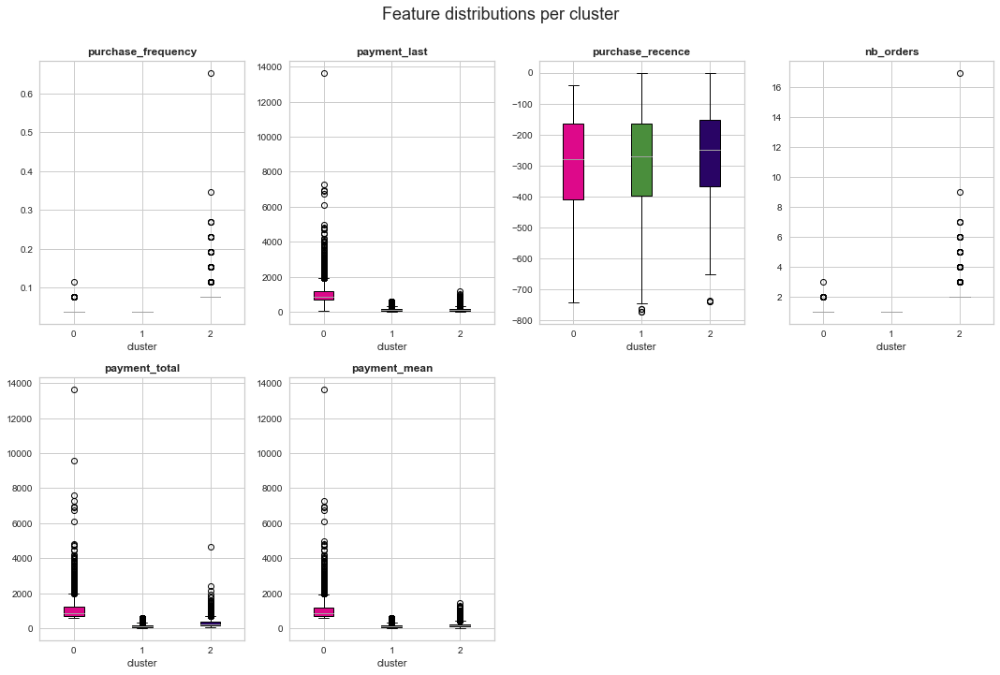

In [191]:
boxplot_visu(rfm, km)

Via barplot

In [184]:
X_dev_rel, X_std_mean = data_mean_std(rfm, rfm_scaled)

C:\Users\aledo\AppData\Local\Temp\ipykernel_16196\1910547268.py:2: FutureWarning: Dropping of nuisance columns in DataFrame reductions (with 'numeric_only=None') is deprecated; in a future version this will raise TypeError.  Select only valid columns before calling the reduction.
  X_mean = pd.concat([pd.DataFrame(raw_data.mean().drop('cluster'), columns=['mean']),


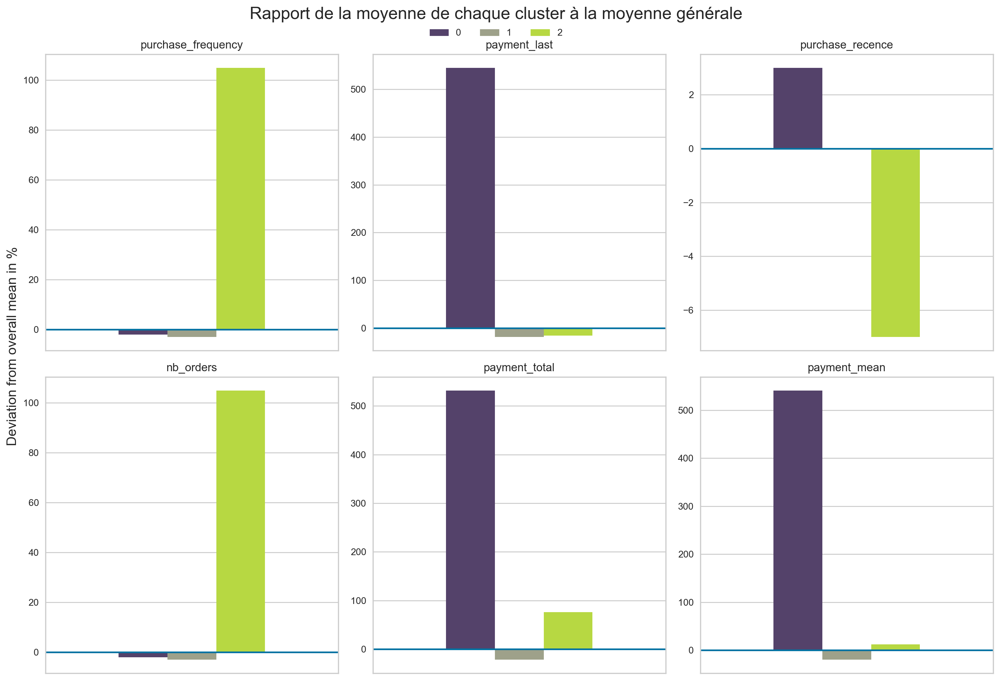

In [189]:
colors = cluster_colors(len(np.unique(km.labels_)))
cluster_comparison_bar(rfm, X_dev_rel, colors,
                       title="Rapport de la moyenne de chaque cluster à la moyenne générale")

### Résumé par cluster

Barplot

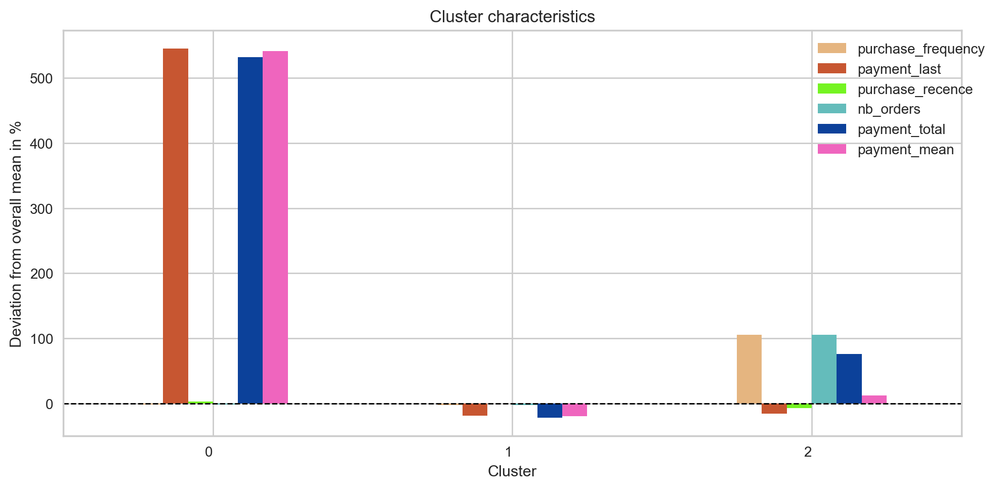

In [199]:
barplot_visu(X_dev_rel, rfm.shape[1])

Radarplot

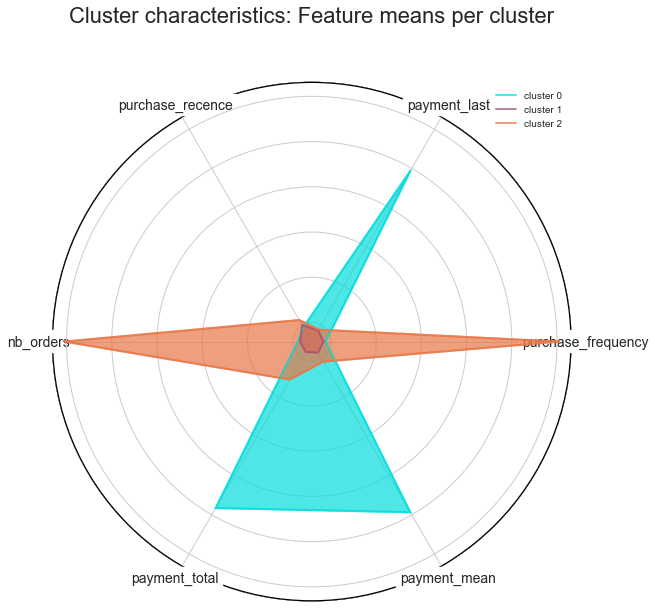

In [201]:
radarplot_visu(X_std_mean, km)

[*(Retour sommaire)*](#ch0)

## <div id="ch2_3" style="color: orange;">2.3 Conclusion sur RFM</div>

Visible dès la phase de recherche du nombre de clusters, le jeu de données RFM ne suffit pas pour segmenter nos clients, car :
- **Les clusters sont déséquilibrés** : l'un des clusters écrase les autres tant en magnitude qu'en cardinalité, bien que chaque cluster soit identifiable par ses particularités vis-à-vis de chaque variables
- **Certaines variables sont redondantes** : l'ACP et les diagrammes au détail par variable nous enseignent notament que les variables liées au paiement étant fortement corrélées, ces dimensions peuvent être réduites
- **La pertinence métier des clusters est légère** : Le cluster 1, comportant de loin la plus grande part de la population, n'est représentatif de rien : les valeurs sont centrées pour l'ensemble de ses variables, suggérant des clients accrochables par aucun levier marketing, ce qui n'est pas exploitable pour Olist. Les clusters 0 et 2 ne semblent pas plus prometteurs, car l'un représente des clients ayant acheté beaucoup et souvent et l'autre des clients ayant acheté peut mais pour un tarif élevé, or nous savons depuis notre phase d'analyse que le nombre de transactions et le montant payé par le client sont corrélés.

Dans la suite de cette étude, nous allons donc rationnaliser les variables de ce jeu de données et lui ajouter progressivement des variables d'intérêt afin d'améliorer le clustering.
Il est également probable que le nombre de clusters ait besoin d'être revu à la hausse afin de diversifier les profil trouvés.

[*(Retour sommaire)*](#ch0)

# <div id="ch3" style="color: blue">3. Ajout de variables</div>

## <div id="ch3_1" style="color: orange;">3.1 Etudes des autres variables calculées</div>

In [16]:
pd.set_option('display.max_columns', 122)
fea.head()

,customer_unique_id,mean_delivery_delay,mean_installments,mean_payment_value,mean_review_score,mean_nb_products,mean_distance_km,nb_orders,purchase_frequency,purchase_recence,last_order_delivery_delay,last_order_installments,last_order_payment_value,last_order_review_score,last_order_nb_products,last_order_distance_km,last_order_purchase_month,last_order_purchase_year,total_payment_value,total_delivery_delay,total_nb_products,total_distance_km,total_installments,cat_agro_industria_e_comercio,cat_alimentos,cat_alimentos_bebidas,cat_artes,cat_artes_e_artesanato,cat_artigos_de_festas,cat_artigos_de_natal,cat_audio,cat_automotivo,cat_bebes,cat_bebidas,cat_beleza_saude,cat_brinquedos,cat_cama_mesa_banho,cat_casa_conforto,cat_casa_conforto_2,cat_casa_construcao,cat_cds_dvds_musicais,cat_cine_foto,cat_climatizacao,cat_consoles_games,cat_construcao_ferramentas_construcao,cat_construcao_ferramentas_ferramentas,cat_construcao_ferramentas_iluminacao,cat_construcao_ferramentas_jardim,cat_construcao_ferramentas_seguranca,cat_cool_stuff,cat_dvds_blu_ray,cat_eletrodomesticos,cat_eletrodomesticos_2,cat_eletronicos,cat_eletroportateis,cat_esporte_lazer,cat_fashion_bolsas_e_acessorios,cat_fashion_calcados,cat_fashion_esporte,cat_fashion_roupa_feminina,cat_fashion_roupa_infanto_juvenil,cat_fashion_roupa_masculina,cat_fashion_underwear_e_moda_praia,cat_ferramentas_jardim,cat_flores,cat_fraldas_higiene,cat_industria_comercio_e_negocios,cat_informatica_acessorios,cat_instrumentos_musicais,cat_la_cuisine,cat_livros_importados,cat_livros_interesse_geral,cat_livros_tecnicos,cat_malas_acessorios,cat_market_place,cat_moveis_colchao_e_estofado,cat_moveis_cozinha_area_de_servico_jantar_e_jardim,cat_moveis_decoracao,cat_moveis_escritorio,cat_moveis_quarto,cat_moveis_sala,cat_musica,cat_papelaria,cat_pc_gamer,cat_pcs,cat_perfumaria,cat_pet_shop,cat_portateis_casa_forno_e_cafe,cat_portateis_cozinha_e_preparadores_de_alimentos,cat_relogios_presentes,cat_seguros_e_servicos,cat_sinalizacao_e_seguranca,cat_tablets_impressao_imagem,cat_telefonia,cat_telefonia_fixa,cat_unknown,cat_utilidades_domesticas,cat_nan,order_status_approved,order_status_canceled,order_status_created,order_status_delivered,order_status_invoiced,order_status_processing,order_status_shipped,order_status_unavailable,order_status_nan
0,0000366f3b9a7992bf8c76cfdf3221e2,-5.0,1.0,141.90,5.0,1.0,108.981774,1,0.038462,-161,-5.0,1.0,141.90,5.0,1.0,108.981774,5,2018,141.90,-5.0,1.0,108.981774,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0,0,0,1,0,0,0,0,0
1,0000b849f77a49e4a4ce2b2a4ca5be3f,-5.0,1.0,27.19,4.0,1.0,16.279123,1,0.038462,-164,-5.0,1.0,27.19,4.0,1.0,16.279123,5,2018,27.19,-5.0,1.0,16.279123,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0,0,0,1,0,0,0,0,0
2,0000f46a3911fa3c0805444483337064,-2.0,1.0,86.22,3.0,1.0,518.656568,1,0.038462,-586,-2.0,1.0,86.22,3.0,1.0,518.656568,3,2017,86.22,-2.0,1.0,518.656568,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0,0,0,1,0,0,0,0,0
3,0000f6ccb0745a6a4b88665a16c9f078,-12.0,1.0,43.62,4.0,1.0,2454.492880,1,0.038462,-370,-12.0,1.0,43.62,4.0,1.0,2454.492880,10,2017,43.62,-12.0,1.0,2454.492880,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,

In [17]:
fea_quanti = fea.loc[:, (~fea.columns.str.contains('cat_')) & (~fea.columns.str.contains('order_status_'))].drop(
    'customer_unique_id', axis=1)
fea_mean = fea.loc[:, fea.columns.str.contains('mean_')]
fea_total = fea.loc[:, fea.columns.str.contains('total_')]
fea_last = fea.loc[:, fea.columns.str.contains('last_order_')]
fea_selected = fea[['mean_installments', 'total_payment_value', 'nb_orders', 'mean_distance_km', 'purchase_recence',
                    'mean_review_score', 'order_status_canceled', 'cat_beleza_saude', 'cat_relogios_presentes']]

### Centrage-Réduction des données par StandardScaler

In [18]:
scaler = StandardScaler()
quanti_std = scaler.fit_transform(fea_quanti)
mean_std = scaler.fit_transform(fea_mean)
total_std = scaler.fit_transform(fea_total)
last_std = scaler.fit_transform(fea_last)
selected_std = scaler.fit_transform(fea_selected)
fea_quanti_scaled = pd.DataFrame(quanti_std, columns=fea_quanti.columns)
fea_mean_scaled = pd.DataFrame(mean_std, columns=fea_mean.columns)
fea_total_scaled = pd.DataFrame(total_std, columns=fea_total.columns)
fea_last_scaled = pd.DataFrame(last_std, columns=fea_last.columns)
fea_selected_scaled = pd.DataFrame(selected_std, columns=fea_selected.columns)

### ACP

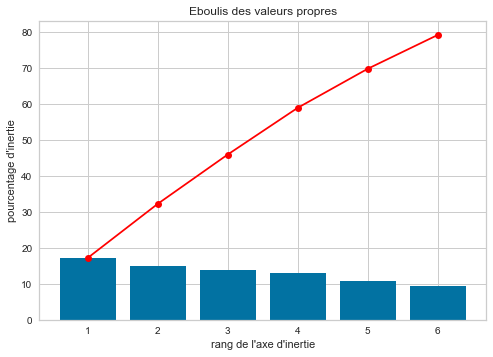

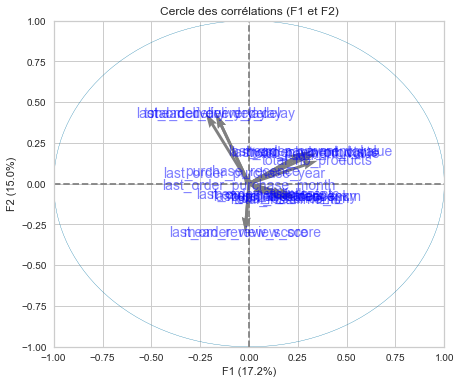

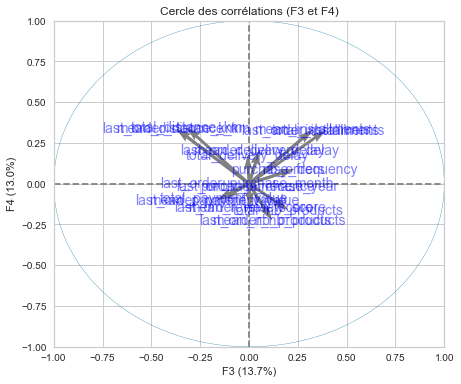

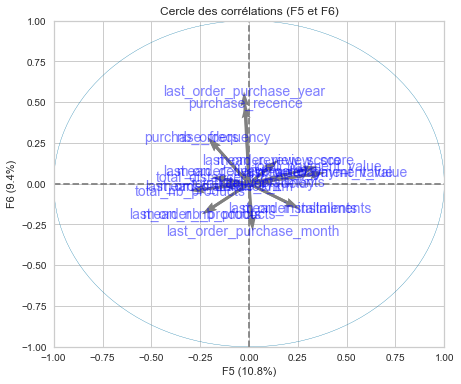

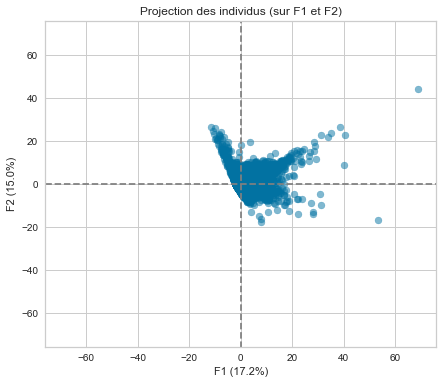

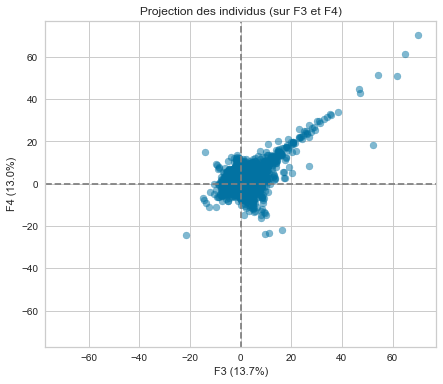

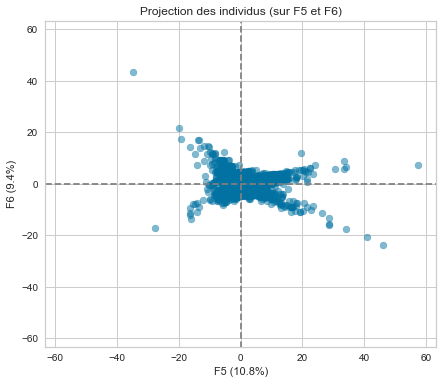

In [202]:
display_pca(fea_quanti_scaled, n_comp=6)

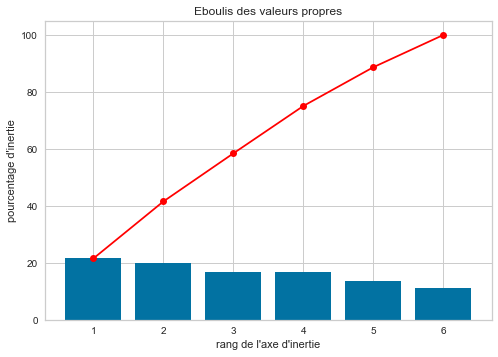

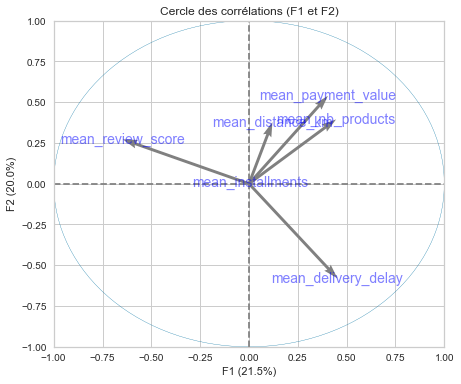

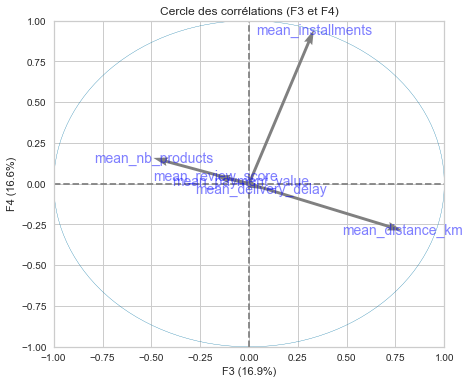

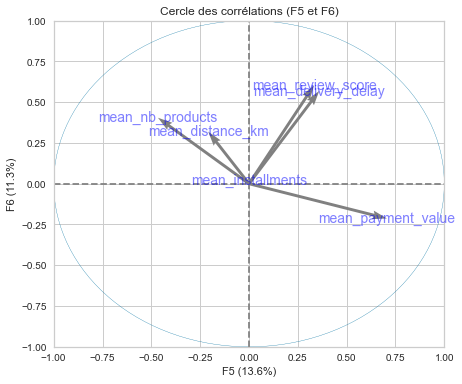

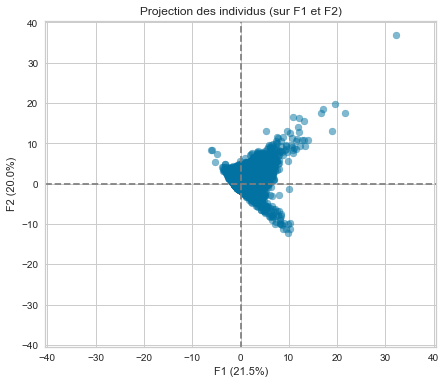

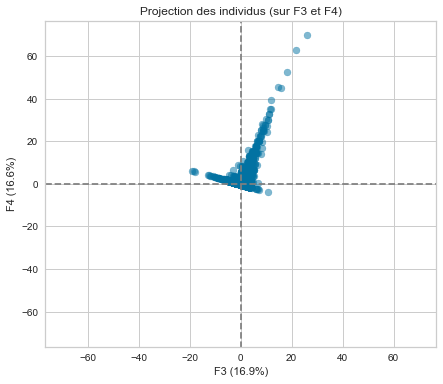

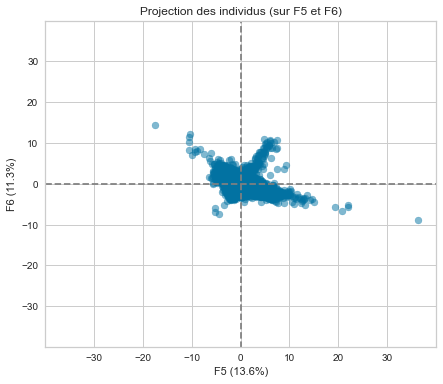

In [204]:
display_pca(fea_mean_scaled, n_comp=6)

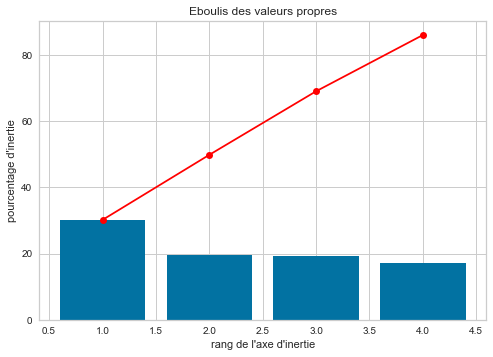

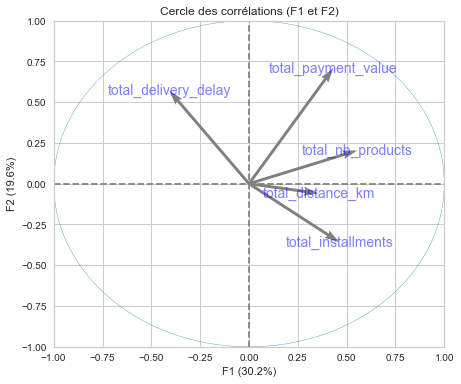

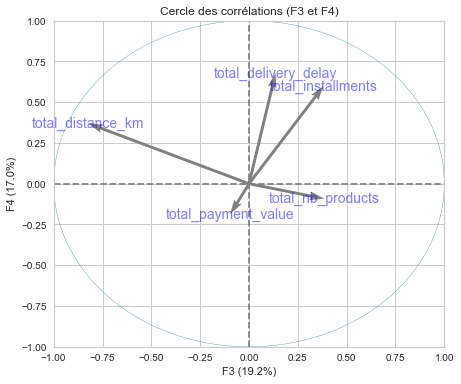

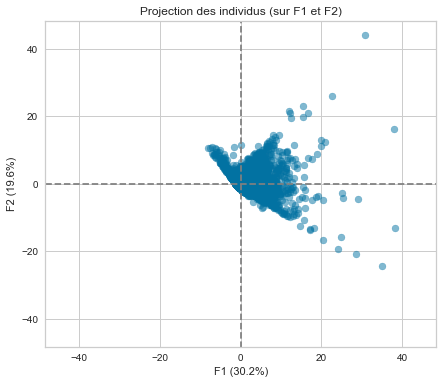

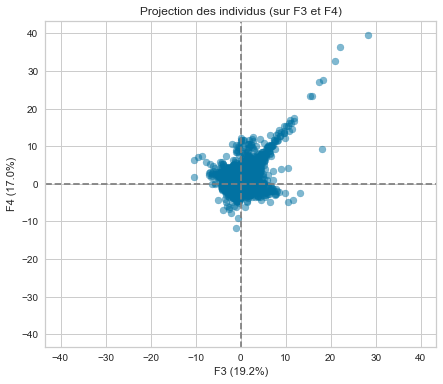

In [206]:
display_pca(fea_total_scaled, n_comp=4)

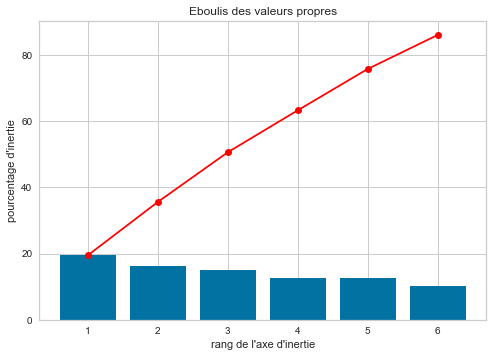

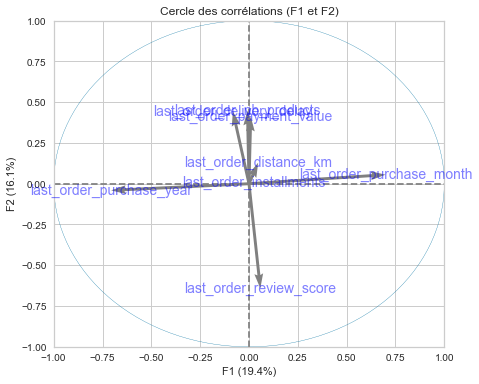

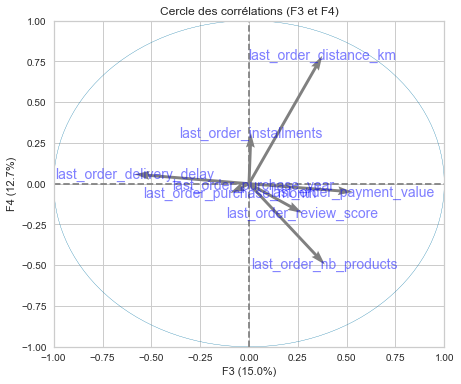

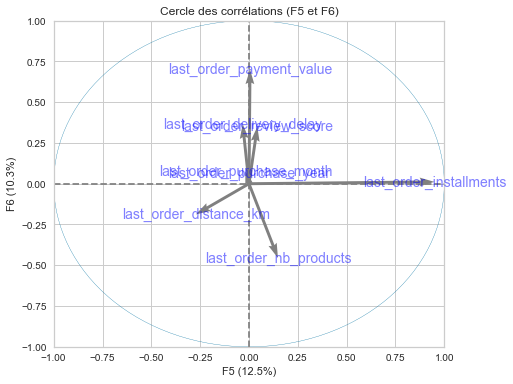

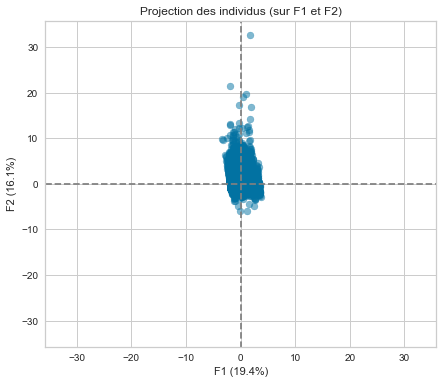

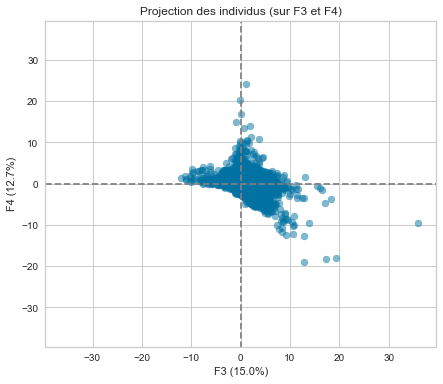

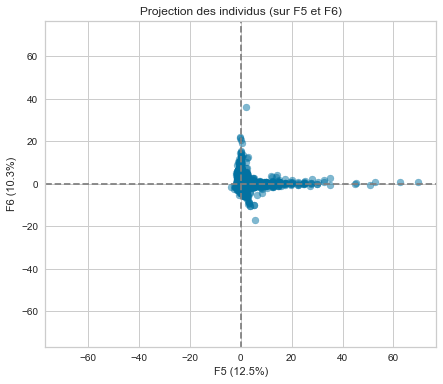

In [207]:
display_pca(fea_last_scaled, n_comp=6)

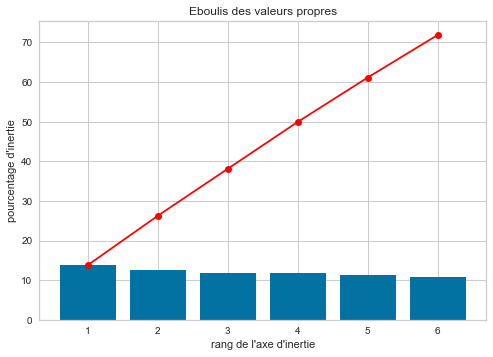

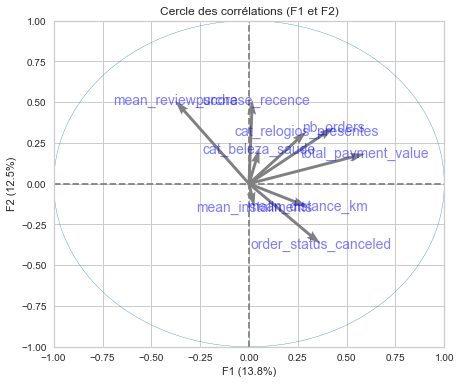

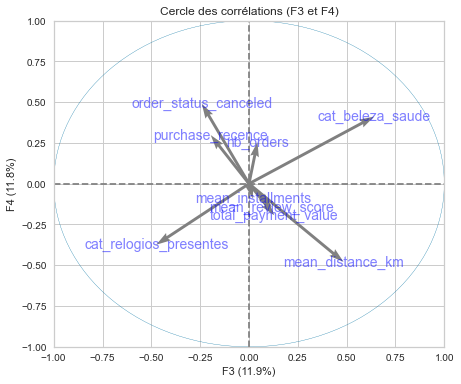

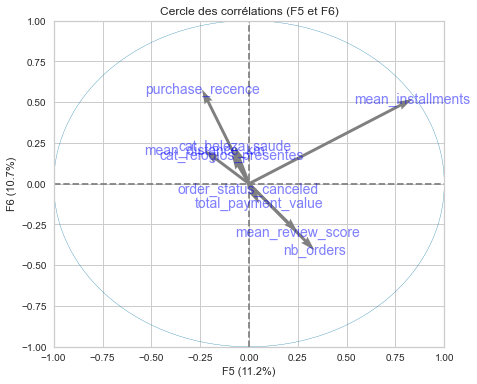

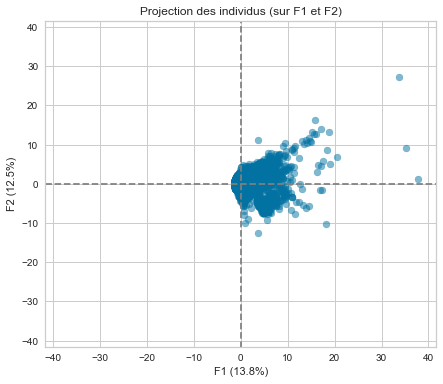

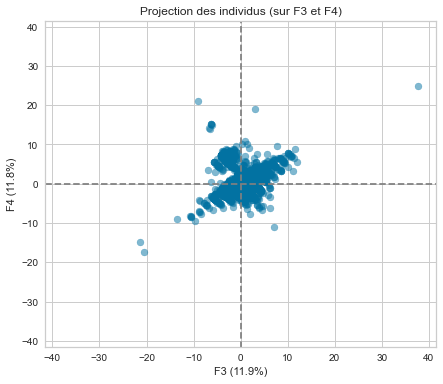

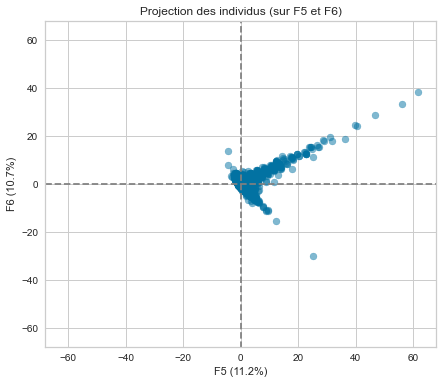

In [208]:
display_pca(fea_selected_scaled, n_comp=6)

<AxesSubplot:>

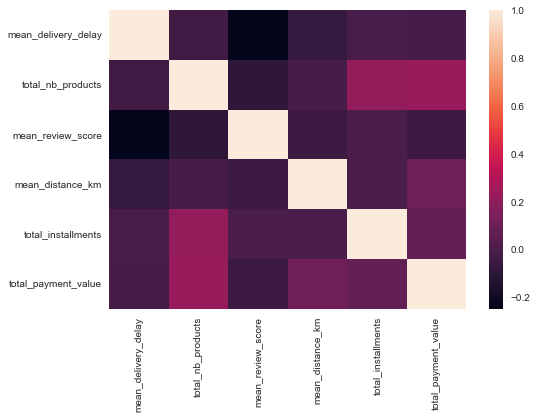

In [70]:
sns.heatmap(fea[['mean_delivery_delay', 'total_nb_products', 'mean_review_score', 'mean_distance_km', 
                 'total_installments', 'total_payment_value']].corr())

Les ACP succéssivement réalisées nous permettent d'isoler plusieurs variables d'intérêt suceptibles d'ajouter de la variance à nos données, et donc de donner plus de prise au K-mean pour réaliser des clusters plus performants.

La matrice de corrélation sur ces variables (`delivery_delay`, `nb_products`, `review_score`, `distance_km`, `installments`) nous indique une relative indépendance linéraire entre elles (entre -0,2 et +0,2 au coefficient de Pearson).

### Rationalisation du jeu RFM

In [18]:
rfm_rat = rfm.drop(['payment_last', 'payment_mean'], axis=1)

In [162]:
rfm_rat.head()

,customer_unique_id,purchase_frequency,purchase_recence,nb_orders,payment_total
0,87ab9fec999db8bd5774917de3cdf01c,0.038462,0,1,89.71
1,262e1f1e26e92e86375f86840b4ffd63,0.076923,-1,2,444.06
2,af5454198a97379394cacf676e1e96cb,0.115385,-14,3,592.65
3,634420a0ea42302205032ed44ac7fccc,0.076923,-17,2,160.76
4,9bb92bebd4cb7511e1a02d5e50bc4655,0.038462,-19,1,137.03


In [19]:
scaler = StandardScaler()
rfm_rat_std = scaler.fit_transform(rfm_rat.drop('customer_unique_id', axis=1))
rfm_rat_scaled = pd.DataFrame(rfm_rat_std, columns=rfm_rat.columns.drop('customer_unique_id'))

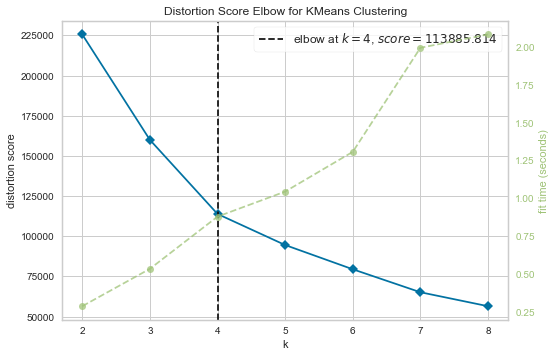

In [164]:
elbow_visu(rfm_rat_scaled, 2, 8)

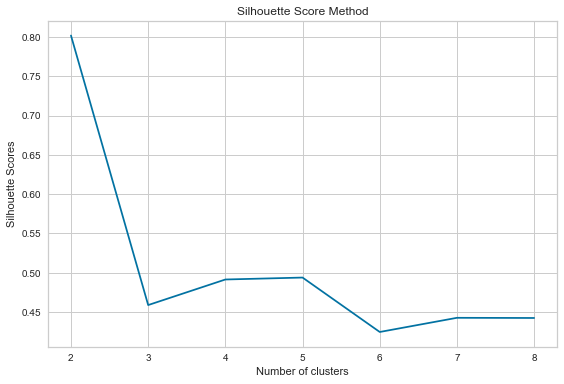

In [165]:
silhouette_graph(rfm_rat_scaled, 2, 8)

[*(Retour sommaire)*](#ch0)

## <div id="ch3_2" style="color: orange;">3.2 Essais avec différentes variables</div>

Dans cette partie, nous allons observer les scores de silhouettes pour chaqeu ajout d'une nouvelle variable au jeu de données RFM.

### Review_score

In [166]:
rev = pd.merge(rfm_rat, fea[['customer_unique_id', 'mean_review_score']]).drop('customer_unique_id', axis=1)

In [167]:
scaler = StandardScaler()
rev_std = scaler.fit_transform(rev)
rev_scaled = pd.DataFrame(rev_std, columns=rev.columns)

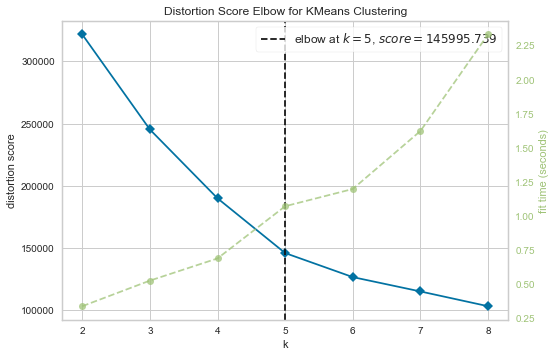

In [168]:
elbow_visu(rev_scaled, 2, 8)

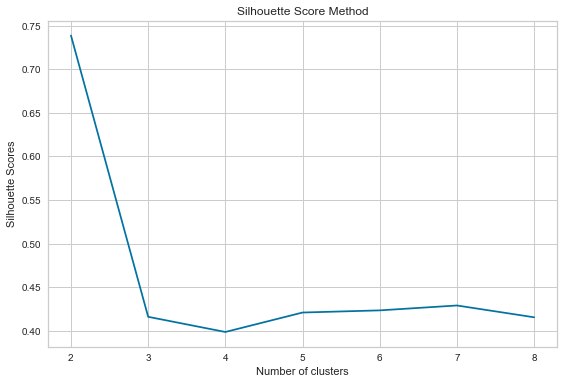

In [169]:
silhouette_graph(rev_scaled, 2, 8)

### Nb_products

In [170]:
prod = pd.merge(rfm_rat, fea[['customer_unique_id', 'total_nb_products']]).drop('customer_unique_id', axis=1)

In [171]:
scaler = StandardScaler()
prod_std = scaler.fit_transform(prod)
prod_scaled = pd.DataFrame(prod_std, columns=prod.columns)

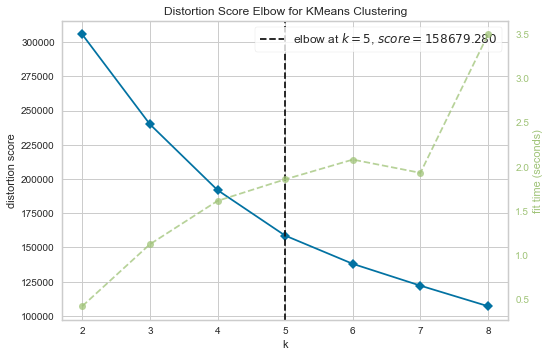

In [172]:
elbow_visu(prod_scaled, 2, 8)

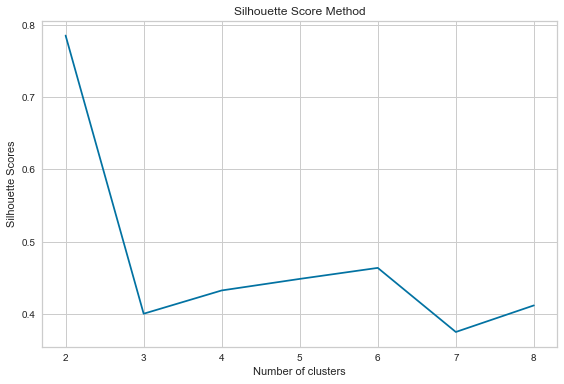

In [173]:
silhouette_graph(prod_scaled, 2, 8)

### Installments

In [174]:
ins = pd.merge(rfm_rat, fea[['customer_unique_id', 'total_installments']]).drop('customer_unique_id', axis=1)

In [175]:
scaler = StandardScaler()
ins_std = scaler.fit_transform(ins)
ins_scaled = pd.DataFrame(ins_std, columns=ins.columns)

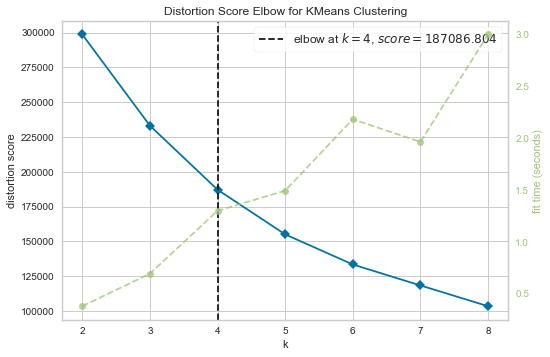

In [176]:
elbow_visu(ins_scaled, 2, 8)

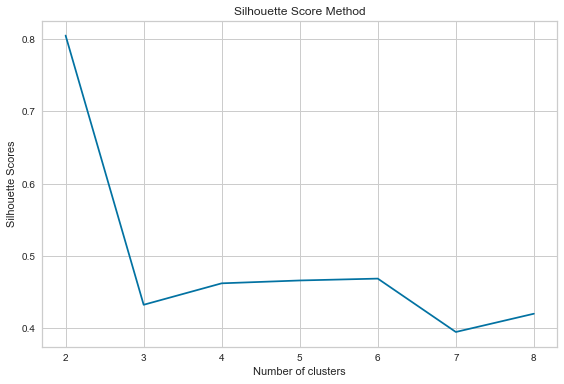

In [177]:
silhouette_graph(ins_scaled, 2, 8)

### Distance_km

In [178]:
dist = pd.merge(rfm_rat, fea[['customer_unique_id', 'mean_distance_km']]).drop('customer_unique_id', axis=1)

In [179]:
scaler = StandardScaler()
dist_std = scaler.fit_transform(dist)
dist_scaled = pd.DataFrame(dist_std, columns=dist.columns)

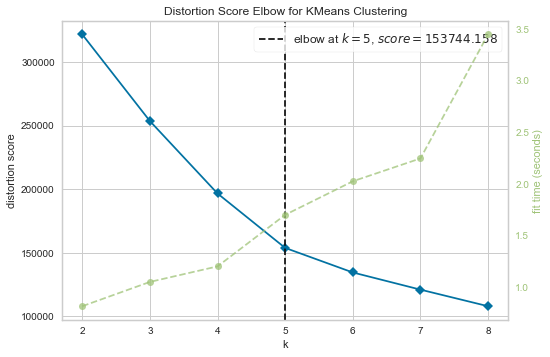

In [180]:
elbow_visu(dist_scaled, 2, 8)

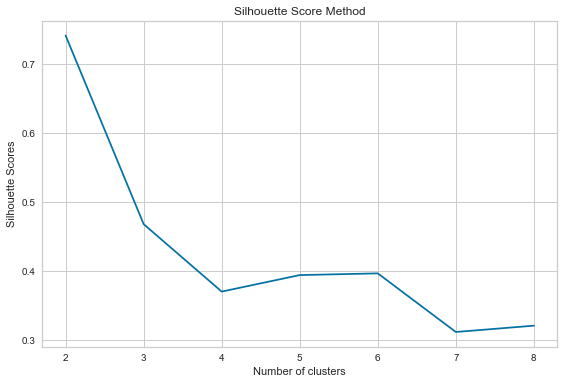

In [181]:
silhouette_graph(dist_scaled, 2, 8)

### Delivery_delay

In [182]:
delay = pd.merge(rfm_rat, fea[['customer_unique_id', 'mean_delivery_delay']]).drop('customer_unique_id', axis=1)

In [183]:
scaler = StandardScaler()
delay_std = scaler.fit_transform(delay)
delay_scaled = pd.DataFrame(delay_std, columns=delay.columns)

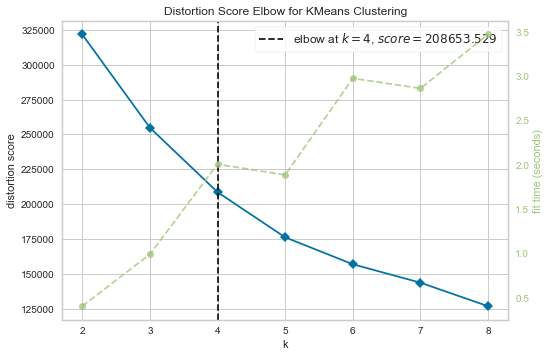

In [184]:
elbow_visu(delay_scaled, 2, 8)

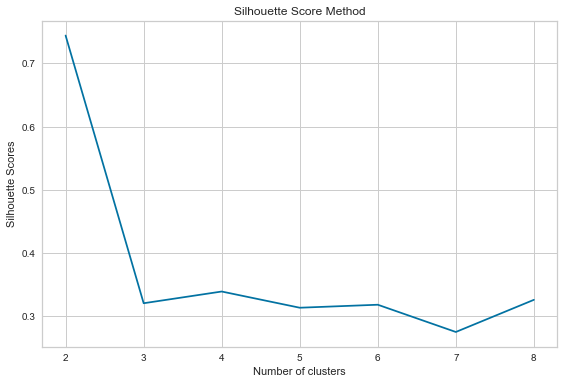

In [185]:
silhouette_graph(delay_scaled, 2, 8)

### Nb_products & Installements

In [186]:
nb_ins = pd.merge(rfm_rat, fea[['customer_unique_id', 'total_nb_products', 'total_installments']]).drop(
    'customer_unique_id', axis=1)

In [187]:
scaler = StandardScaler()
nb_ins_std = scaler.fit_transform(nb_ins)
nb_ins_scaled = pd.DataFrame(nb_ins_std, columns=nb_ins.columns)

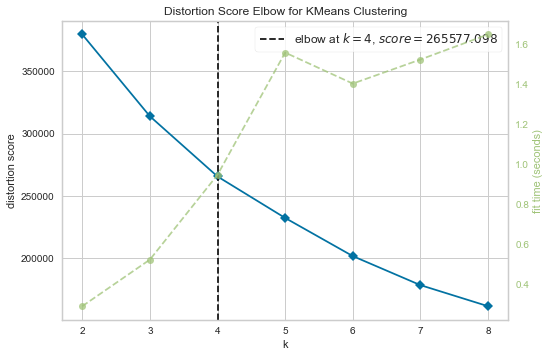

In [188]:
elbow_visu(nb_ins_scaled, 2, 8)

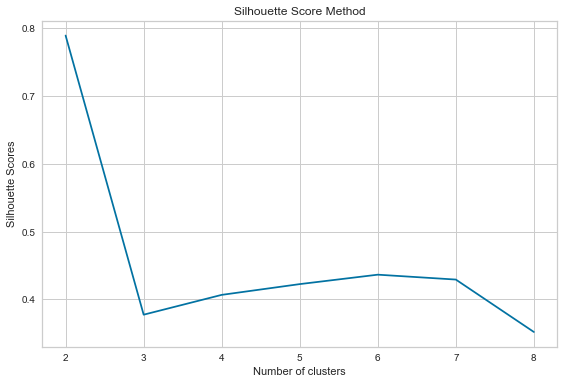

In [189]:
silhouette_graph(nb_ins_scaled, 2, 8)

### Review_score & Installements

In [190]:
rev_ins = pd.merge(rfm_rat, fea[['customer_unique_id', 'mean_review_score', 'total_installments']]).drop(
    'customer_unique_id', axis=1)

In [191]:
scaler = StandardScaler()
rev_ins_std = scaler.fit_transform(rev_ins)
rev_ins_scaled = pd.DataFrame(rev_ins_std, columns=rev_ins.columns)

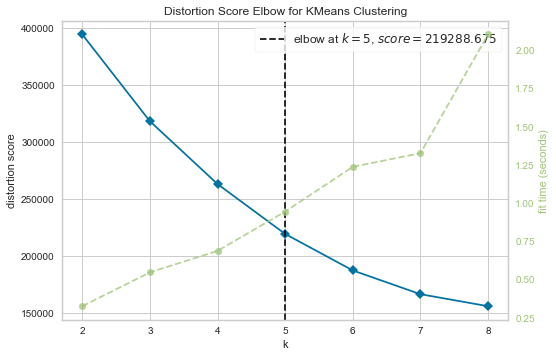

In [192]:
elbow_visu(rev_ins_scaled, 2, 8)

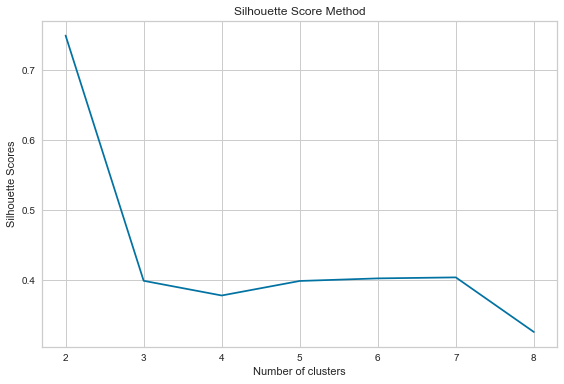

In [193]:
silhouette_graph(rev_ins_scaled, 2, 8)

### Distance_km & Installements

In [194]:
dist_ins = pd.merge(rfm_rat, fea[['customer_unique_id', 'mean_distance_km', 'total_installments']]).drop(
    'customer_unique_id', axis=1)

In [195]:
scaler = StandardScaler()
dist_ins_std = scaler.fit_transform(dist_ins)
dist_ins_scaled = pd.DataFrame(dist_ins_std, columns=dist_ins.columns)

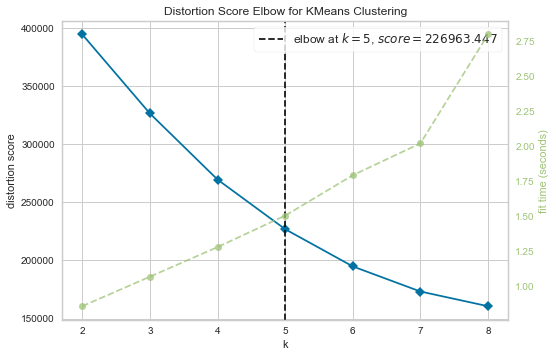

In [196]:
elbow_visu(dist_ins_scaled, 2, 8)

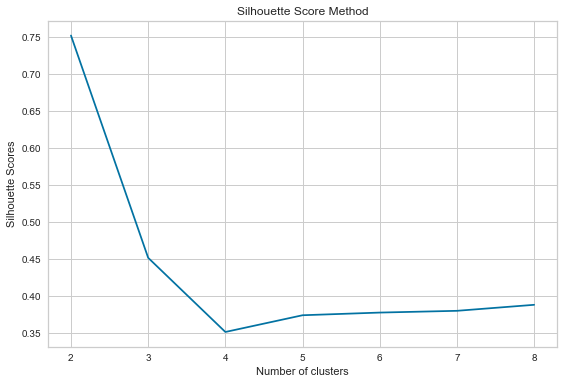

In [197]:
silhouette_graph(dist_ins_scaled, 2, 8)

### Delivery_delay & Installements

In [199]:
del_ins = pd.merge(rfm_rat, fea[['customer_unique_id', 'mean_delivery_delay', 'total_installments']]).drop(
    'customer_unique_id', axis=1)

In [200]:
scaler = StandardScaler()
del_ins_std = scaler.fit_transform(del_ins)
del_ins_scaled = pd.DataFrame(del_ins_std, columns=del_ins.columns)

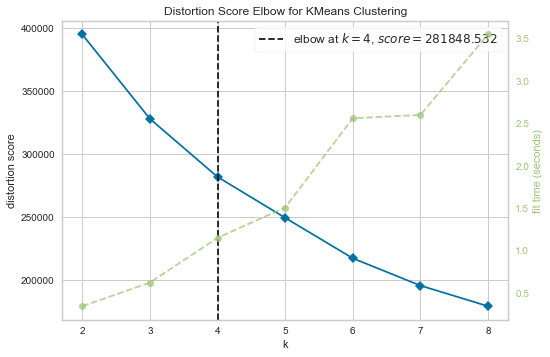

In [201]:
elbow_visu(del_ins_scaled, 2, 8)

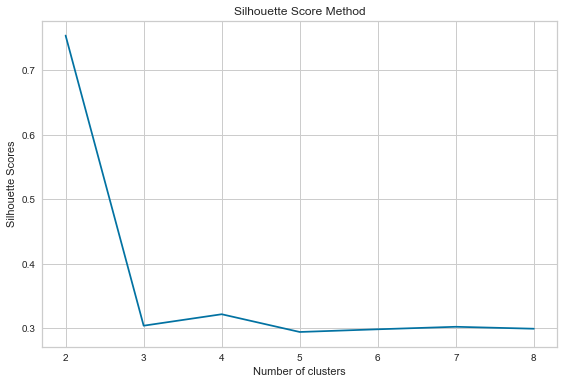

In [202]:
silhouette_graph(del_ins_scaled, 2, 8)

### Review_score & Nb_products & Installements

In [250]:
rpi = pd.merge(rfm_rat, fea[['customer_unique_id', 'total_nb_products', 'total_installments',
                             'mean_review_score']]).drop('customer_unique_id', axis=1)

In [251]:
scaler = StandardScaler()
rpi_std = scaler.fit_transform(rpi)
rpi_scaled = pd.DataFrame(rpi_std, columns=rpi.columns)

C:\Users\aledo\anaconda3\envs\p5\lib\site-packages\yellowbrick\utils\kneed.py:155: YellowbrickWarning: No 'knee' or 'elbow point' detected This could be due to bad clustering, no actual clusters being formed etc.
  warnings.warn(warning_message, YellowbrickWarning)
C:\Users\aledo\anaconda3\envs\p5\lib\site-packages\yellowbrick\cluster\elbow.py:361: YellowbrickWarning: No 'knee' or 'elbow' point detected, pass `locate_elbow=False` to remove the warning
  warnings.warn(warning_message, YellowbrickWarning)


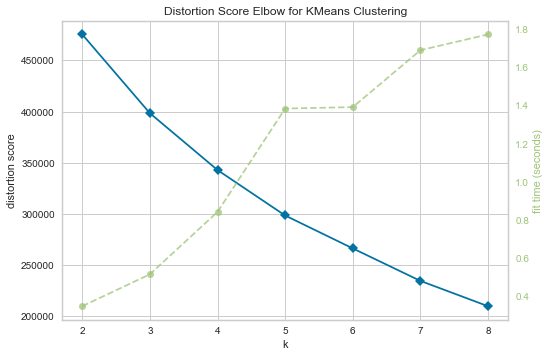

In [252]:
elbow_visu(rpi_scaled, 2, 8)

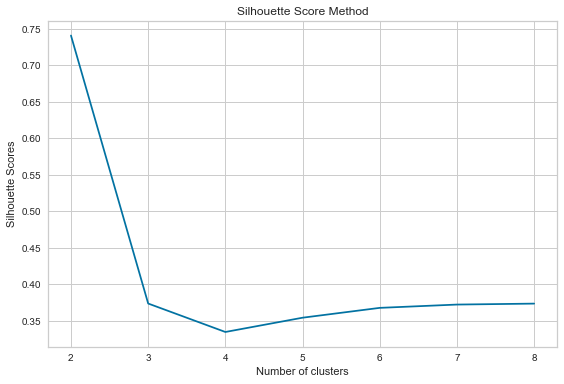

In [253]:
silhouette_graph(rpi_scaled, 2, 8)

### Distance_km & Nb_products & Installements

In [254]:
dpi = pd.merge(rfm_rat, fea[['customer_unique_id', 'total_nb_products', 'total_installments',
                             'mean_distance_km']]).drop('customer_unique_id', axis=1)

In [255]:
scaler = StandardScaler()
dpi_std = scaler.fit_transform(dpi)
dpi_scaled = pd.DataFrame(dpi_std, columns=dpi.columns)

C:\Users\aledo\anaconda3\envs\p5\lib\site-packages\yellowbrick\utils\kneed.py:155: YellowbrickWarning: No 'knee' or 'elbow point' detected This could be due to bad clustering, no actual clusters being formed etc.
  warnings.warn(warning_message, YellowbrickWarning)
C:\Users\aledo\anaconda3\envs\p5\lib\site-packages\yellowbrick\cluster\elbow.py:361: YellowbrickWarning: No 'knee' or 'elbow' point detected, pass `locate_elbow=False` to remove the warning
  warnings.warn(warning_message, YellowbrickWarning)


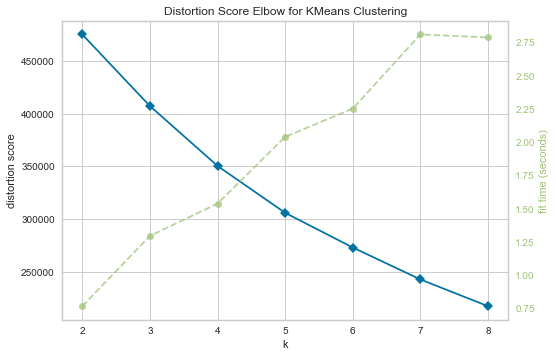

In [256]:
elbow_visu(dpi_scaled, 2, 8)

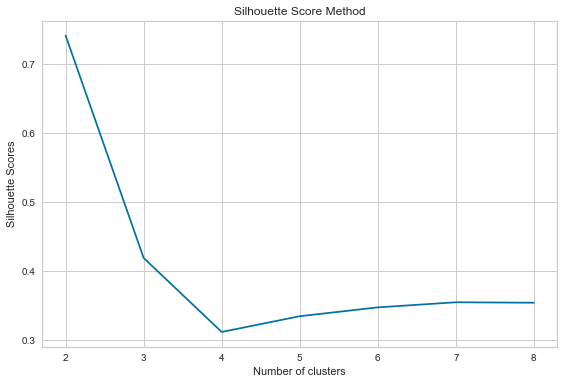

In [257]:
silhouette_graph(dpi_scaled, 2, 8)

### Delivery_delay & Nb_products & Installements

In [258]:
ypi = pd.merge(rfm_rat, fea[['customer_unique_id', 'total_nb_products', 'total_installments',
                             'mean_delivery_delay']]).drop('customer_unique_id', axis=1)

In [259]:
scaler = StandardScaler()
ypi_std = scaler.fit_transform(ypi)
ypi_scaled = pd.DataFrame(ypi_std, columns=ypi.columns)

C:\Users\aledo\anaconda3\envs\p5\lib\site-packages\yellowbrick\utils\kneed.py:155: YellowbrickWarning: No 'knee' or 'elbow point' detected This could be due to bad clustering, no actual clusters being formed etc.
  warnings.warn(warning_message, YellowbrickWarning)
C:\Users\aledo\anaconda3\envs\p5\lib\site-packages\yellowbrick\cluster\elbow.py:361: YellowbrickWarning: No 'knee' or 'elbow' point detected, pass `locate_elbow=False` to remove the warning
  warnings.warn(warning_message, YellowbrickWarning)


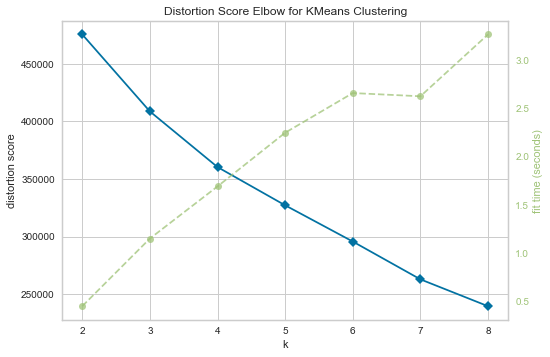

In [260]:
elbow_visu(ypi_scaled, 2, 8)

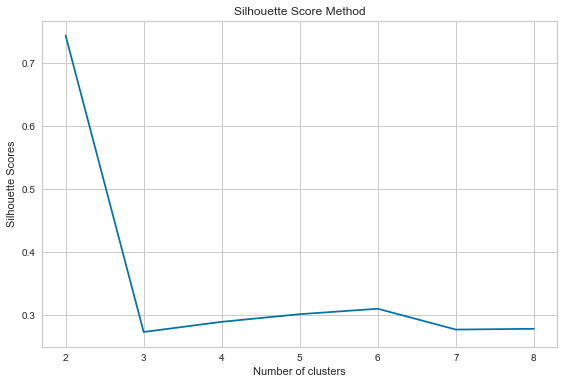

In [261]:
silhouette_graph(ypi_scaled, 2, 8)

### Distance_km & Review_score & Nb_products & Installements

In [262]:
drpi = pd.merge(rfm_rat, fea[['customer_unique_id', 'total_nb_products', 'total_installments', 'mean_review_score',
                              'mean_distance_km']]).drop('customer_unique_id', axis=1)

In [263]:
scaler = StandardScaler()
drpi_std = scaler.fit_transform(drpi)
drpi_scaled = pd.DataFrame(drpi_std, columns=drpi.columns)

C:\Users\aledo\anaconda3\envs\p5\lib\site-packages\yellowbrick\utils\kneed.py:155: YellowbrickWarning: No 'knee' or 'elbow point' detected This could be due to bad clustering, no actual clusters being formed etc.
  warnings.warn(warning_message, YellowbrickWarning)
C:\Users\aledo\anaconda3\envs\p5\lib\site-packages\yellowbrick\cluster\elbow.py:361: YellowbrickWarning: No 'knee' or 'elbow' point detected, pass `locate_elbow=False` to remove the warning
  warnings.warn(warning_message, YellowbrickWarning)


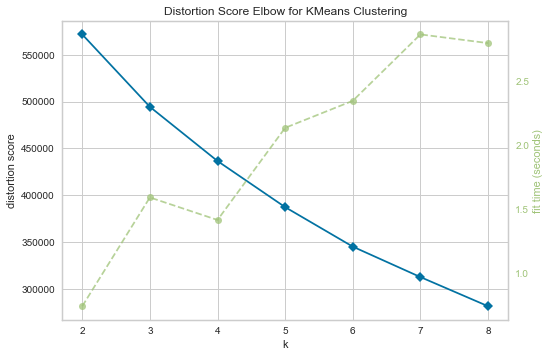

In [264]:
elbow_visu(drpi_scaled, 2, 8)

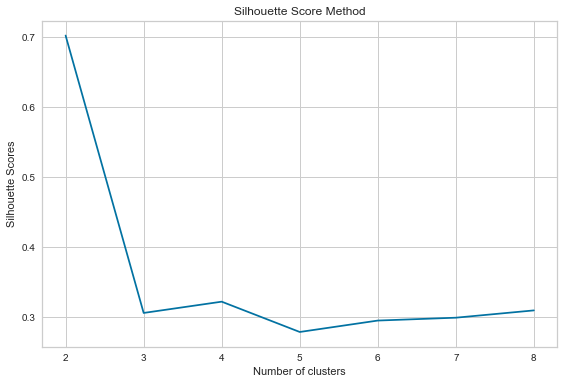

In [265]:
silhouette_graph(drpi_scaled, 2, 8)

### Delivery_delay & Review_score & Nb_products & Installements

In [20]:
yrpi = pd.merge(rfm_rat, fea[['customer_unique_id', 'mean_delivery_delay', 'total_installments', 'total_nb_products',
                             'mean_review_score']]).drop('customer_unique_id', axis=1)

In [21]:
scaler = StandardScaler()
yrpi_std = scaler.fit_transform(yrpi)
yrpi_scaled = pd.DataFrame(yrpi_std, columns=yrpi.columns)

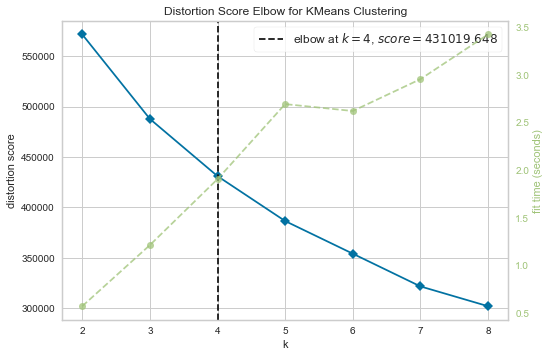

In [268]:
elbow_visu(yrpi_scaled, 2, 8)

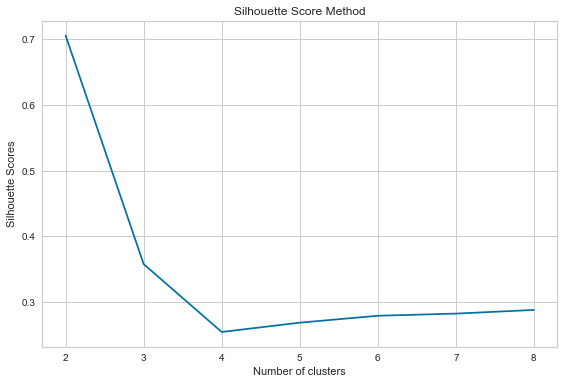

In [269]:
silhouette_graph(yrpi_scaled, 2, 8)

### All together

In [270]:
tog = pd.merge(rfm_rat, fea[['customer_unique_id', 'mean_delivery_delay', 'total_installments', 'total_nb_products',
                             'mean_review_score', 'mean_distance_km']]).drop('customer_unique_id', axis=1)

In [271]:
scaler = StandardScaler()
tog_std = scaler.fit_transform(tog)
tog_scaled = pd.DataFrame(tog_std, columns=tog.columns)

C:\Users\aledo\anaconda3\envs\p5\lib\site-packages\yellowbrick\utils\kneed.py:155: YellowbrickWarning: No 'knee' or 'elbow point' detected This could be due to bad clustering, no actual clusters being formed etc.
  warnings.warn(warning_message, YellowbrickWarning)
C:\Users\aledo\anaconda3\envs\p5\lib\site-packages\yellowbrick\cluster\elbow.py:361: YellowbrickWarning: No 'knee' or 'elbow' point detected, pass `locate_elbow=False` to remove the warning
  warnings.warn(warning_message, YellowbrickWarning)


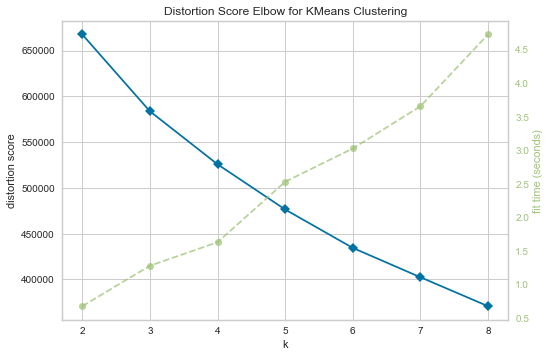

In [272]:
elbow_visu(tog_scaled, 2, 8)

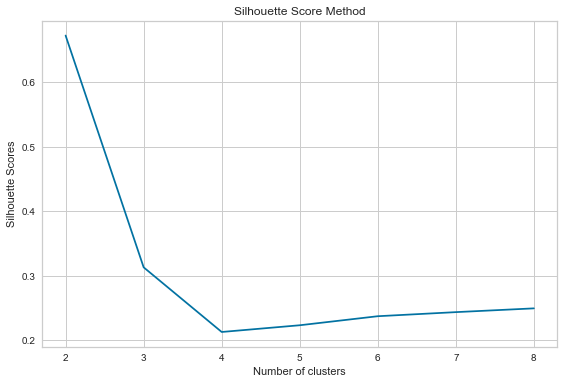

In [273]:
silhouette_graph(tog_scaled, 2, 8)

### Résulats silhouettes par adjonction de variables

In [361]:
sil = pd.DataFrame({'nb_clusters': [2, 3, 4, 5, 6], 
                    'rfm': [0.80, 0.46, 0.49, 0.49, 0.42], 
                    'rfm_installments': [0.81, 0.43, 0.46, 0.47, 0.47],
                    'rfmi_nb_products': [0.78, 0.37, 0.41, 0.42, 0.44], 
                    'rfmip_review_score': [0.74, 0.37, 0.34, 0.36, 0.37], 
                    'rfmipr_distance_km': [0.70, 0.31, 0.32, 0.28, 0.30], 
                    'rfmipr_delivery_delay': [0.70, 0.36, 0.26, 0.27, 0.28], 
                    'all_together': [0.68, 0.31, 0.22, 0.23, 0.24]})

In [362]:
sil

,nb_clusters,rfm,rfm_installments,rfmi_nb_products,rfmip_review_score,rfmipr_distance_km,rfmipr_delivery_delay,all_together
0,2,0.80,0.81,0.78,0.74,0.70,0.70,0.68
1,3,0.46,0.43,0.37,0.37,0.31,0.36,0.31
2,4,0.49,0.46,0.41,0.34,0.32,0.26,0.22
3,5,0.49,0.47,0.42,0.36,0.28,0.27,0.23
4,6,0.42,0.47,0.44,0.37,0.30,0.28,0.24


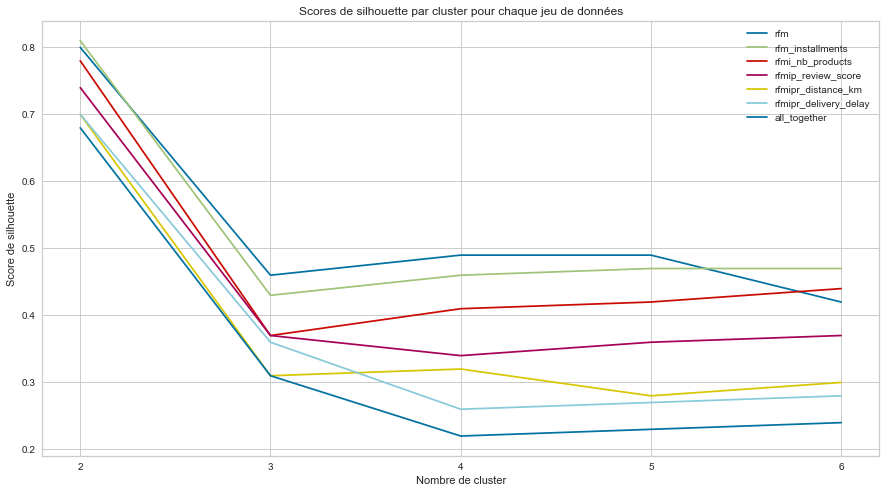

In [363]:
plt.figure(figsize=(15, 8))
for c in sil.columns.drop('nb_clusters'):
    plt.plot(sil[c], label=c)
plt.legend()
plt.title('Scores de silhouette par cluster pour chaque jeu de données')
plt.ylabel('Score de silhouette')
plt.xlabel('Nombre de cluster')
plt.xticks(ticks=range(5), labels=sil['nb_clusters'])
plt.show()

[*(Retour sommaire)*](#ch0)

## <div id="ch3_3" style="color: orange;">3.3 Etude approfondie des configurations d'intérêt</div>

Dans cette partie, nous allons observer plus attentivement la répartition des meilleurs combinaisons jeu de données <-> nombre de clusters, afin de déterminer la combinaison qui nous servira sur la suite de l'étude.

### All together

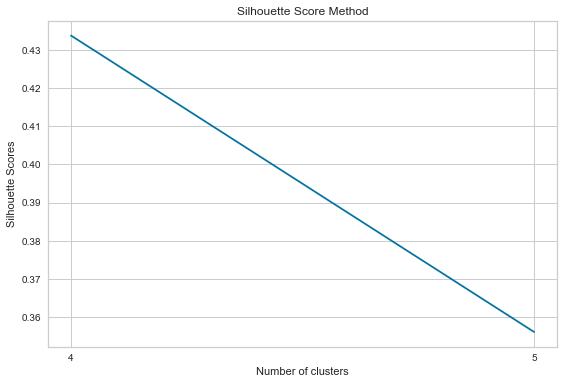

For n_clusters = 4, the average silhouette score is : 0.433688160868213
For n_clusters = 5, the average silhouette score is : 0.3561257743944612


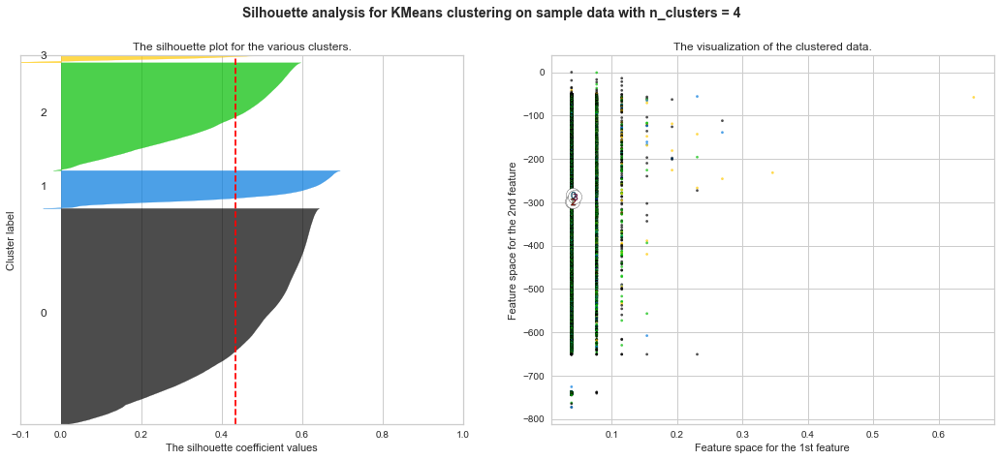

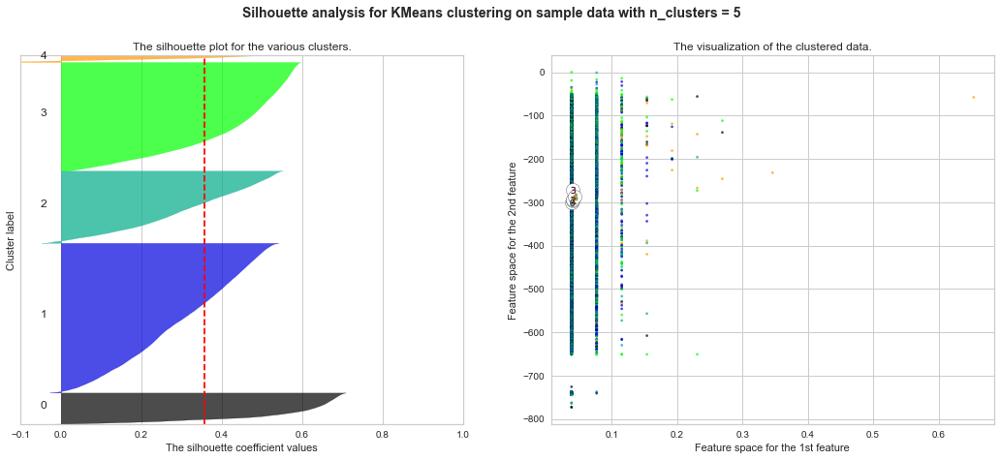

In [241]:
silhouette_visu(tog_scaled, 4, 5)

### All together : 3 clusters

In [317]:
km_tog = KMeans(n_clusters=3, max_iter=300, tol=1e-04, init='k-means++', n_init=10, random_state=0, algorithm='auto')
km_tog_fit = km_tog.fit(tog_scaled)

Cardinalité et Magnitude

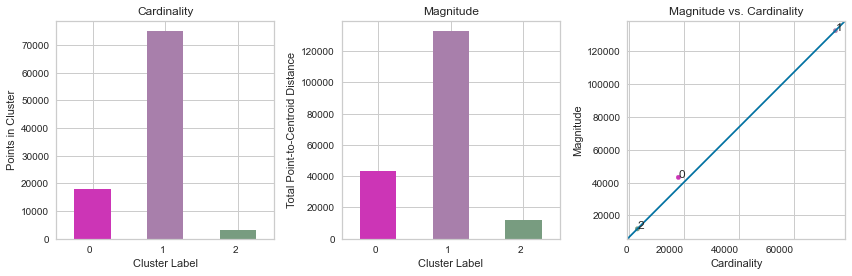

In [318]:
cardinality_magnitude(tog_scaled, km_tog_fit, 3)

Visualisation ACP

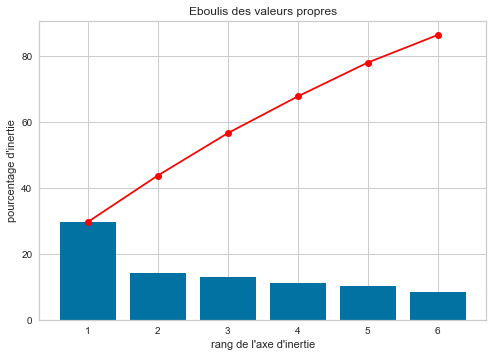

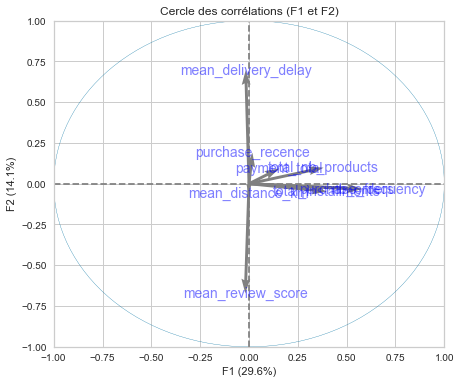

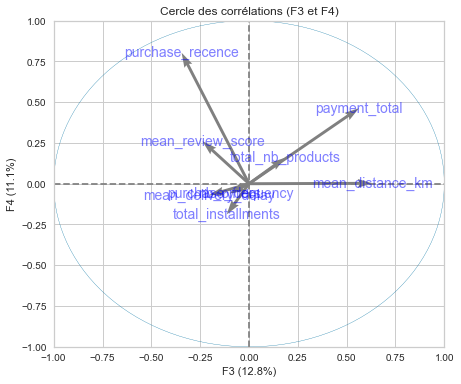

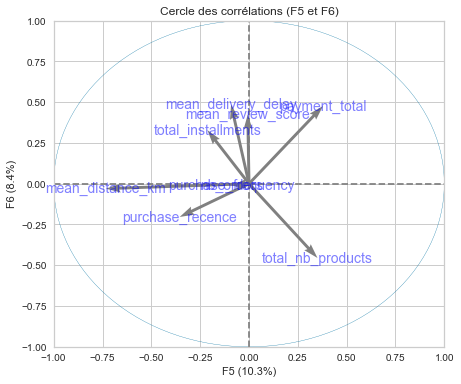

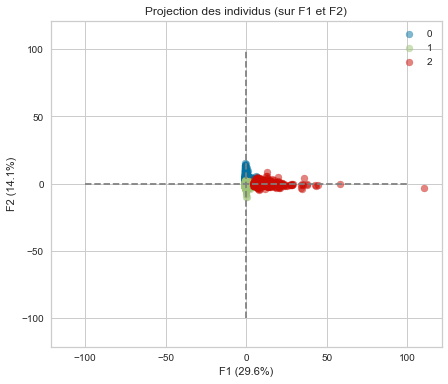

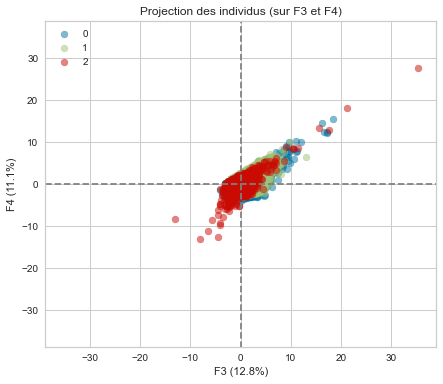

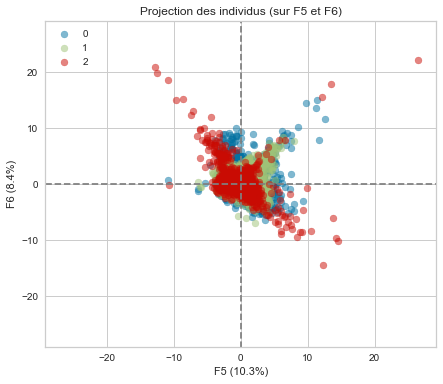

In [319]:
display_pca(tog_scaled, split=km_tog_fit.labels_, n_comp=6)

In [320]:
tog['cluster'] = km_tog.labels_
tog_scaled['cluster'] = km_tog.labels_

Détail par variable : Boxplot

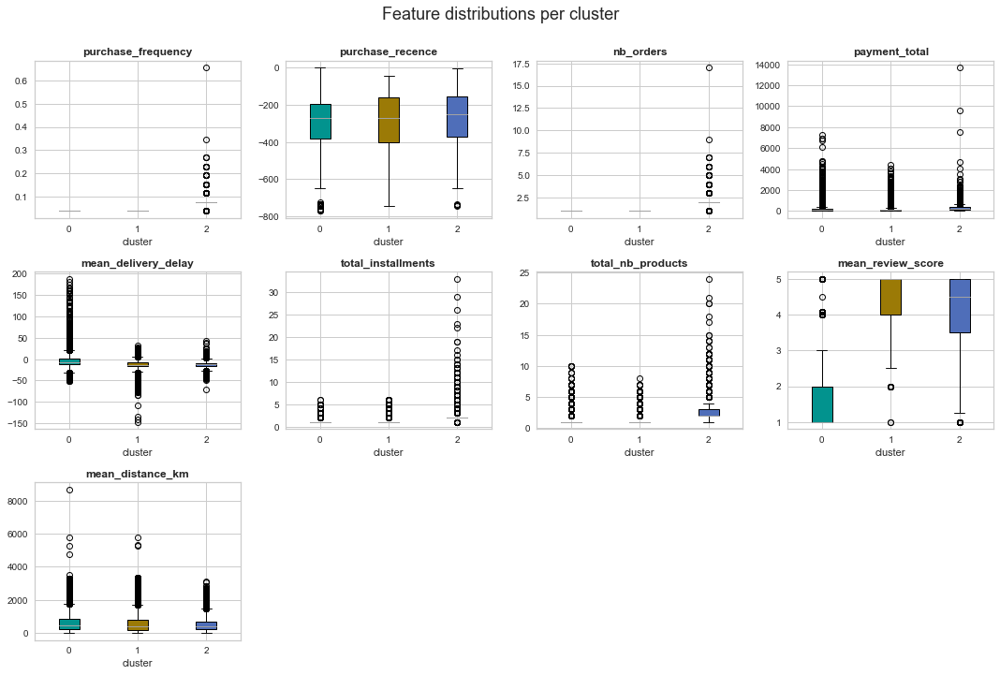

In [321]:
boxplot_visu(tog, km_tog)

Détail par variable : Barplot

In [322]:
X_dev_rel, X_std_mean = data_mean_std(tog, tog_scaled)

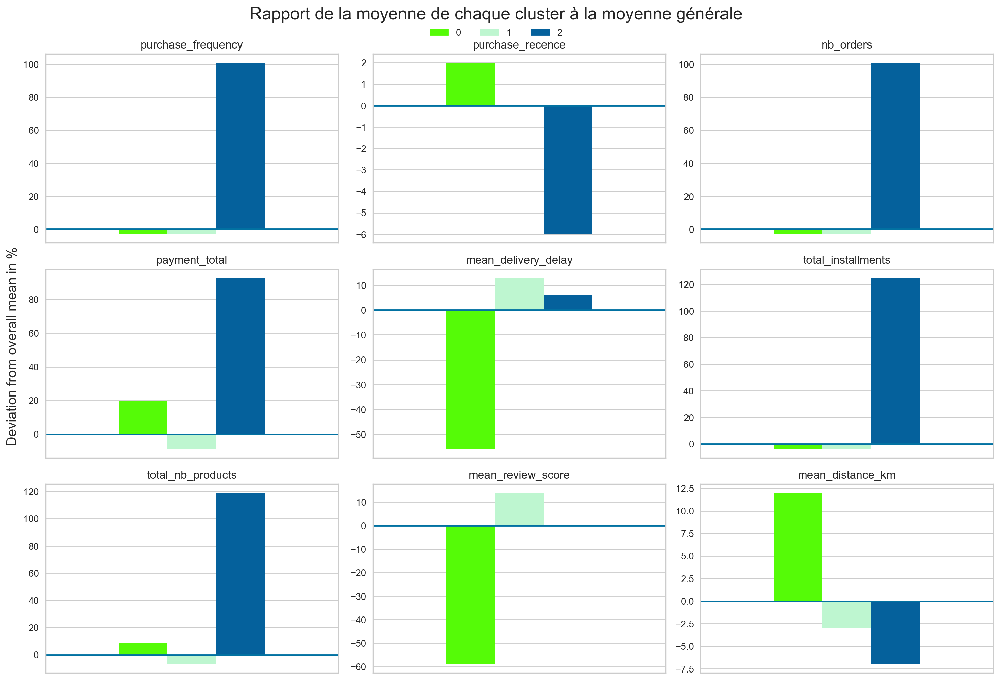

In [323]:
colors = cluster_colors(len(np.unique(km_tog.labels_)))
cluster_comparison_bar(tog, X_dev_rel, colors,
                       title="Rapport de la moyenne de chaque cluster à la moyenne générale")

Détail par cluster : Barplot

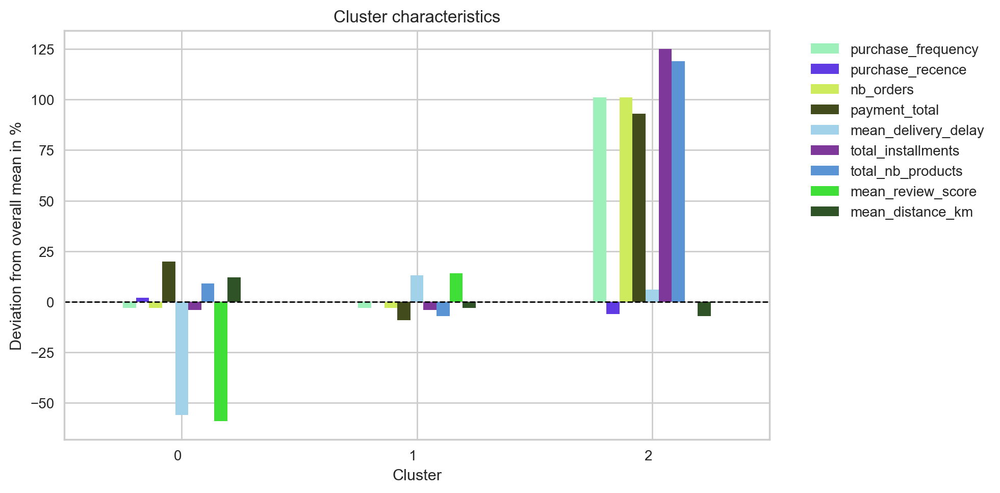

In [324]:
barplot_visu(X_dev_rel, tog.shape[1])

Détail par cluster : Radarplot

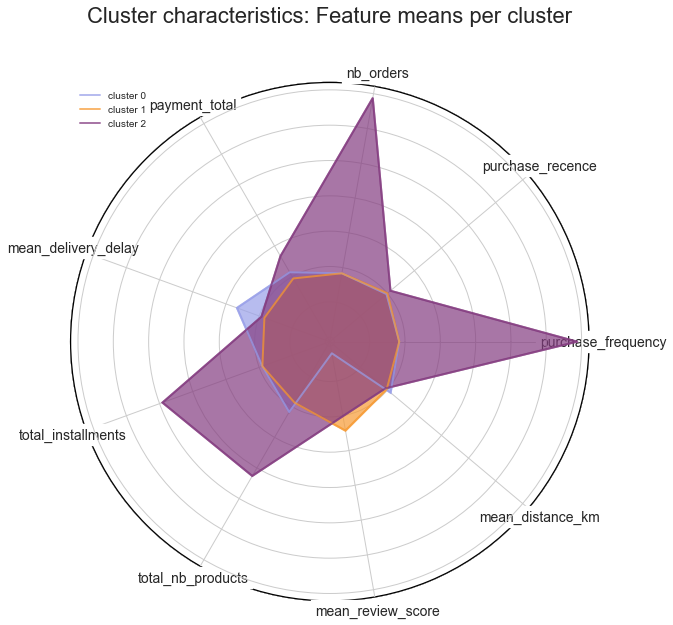

In [325]:
radarplot_visu(X_std_mean, km_tog)

### All together : 4 clusters

In [326]:
km_tog4 = KMeans(n_clusters=4, max_iter=300, tol=1e-04, init='k-means++', n_init=10, random_state=0, algorithm='auto')
km_tog4_fit = km_tog4.fit(tog_scaled)

Cardinalité et Magnitude

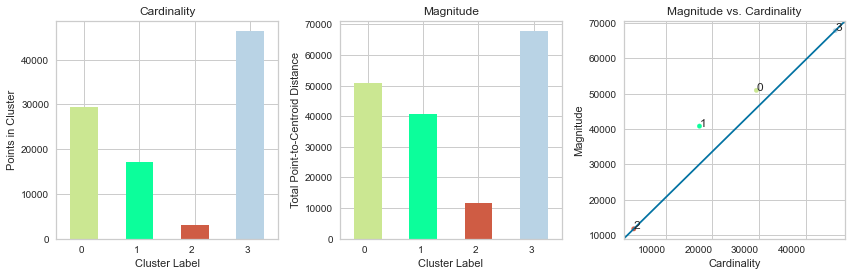

In [327]:
cardinality_magnitude(tog_scaled, km_tog4_fit, 4)

Visualisation ACP

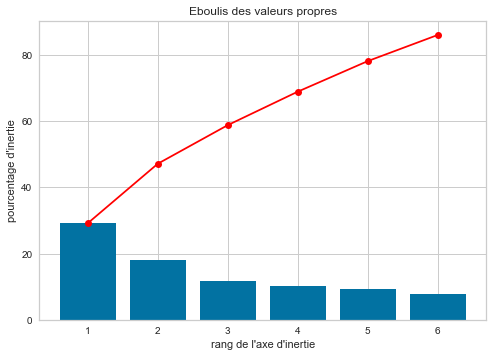

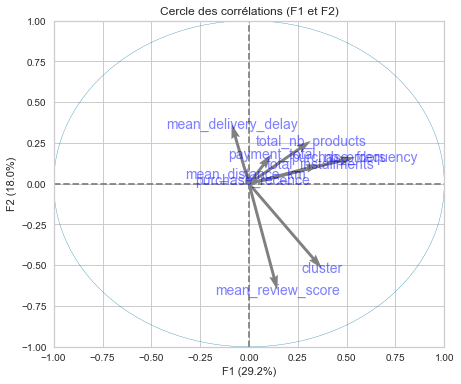

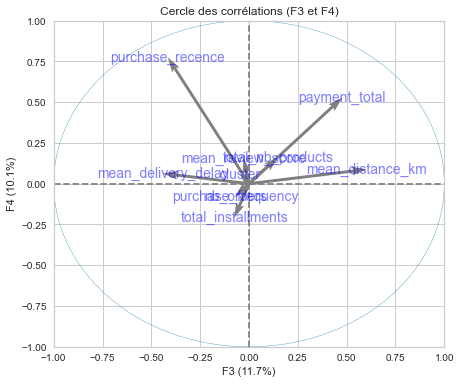

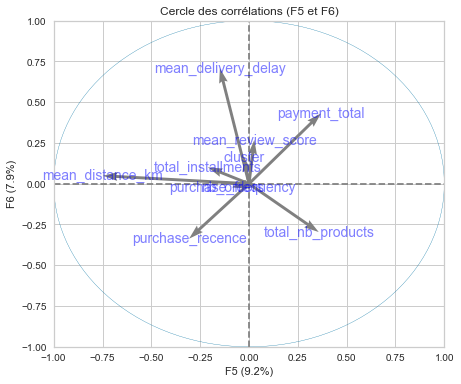

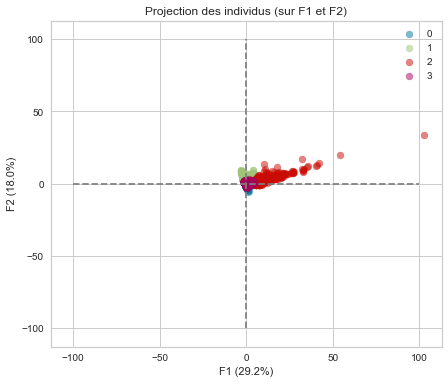

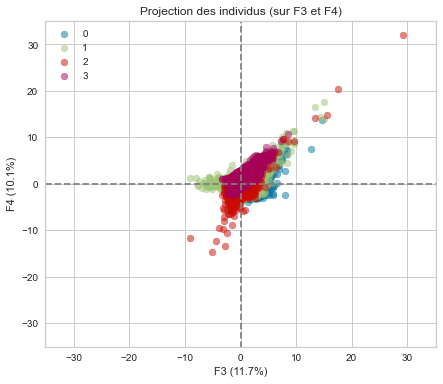

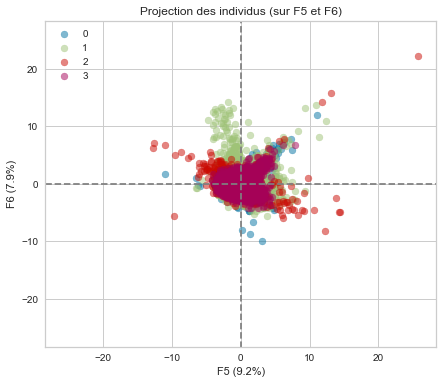

In [329]:
display_pca(tog_scaled, split=km_tog4_fit.labels_, n_comp=6)

In [330]:
tog['cluster'] = km_tog4.labels_
tog_scaled['cluster'] = km_tog4.labels_

Détail par variable : Boxplot

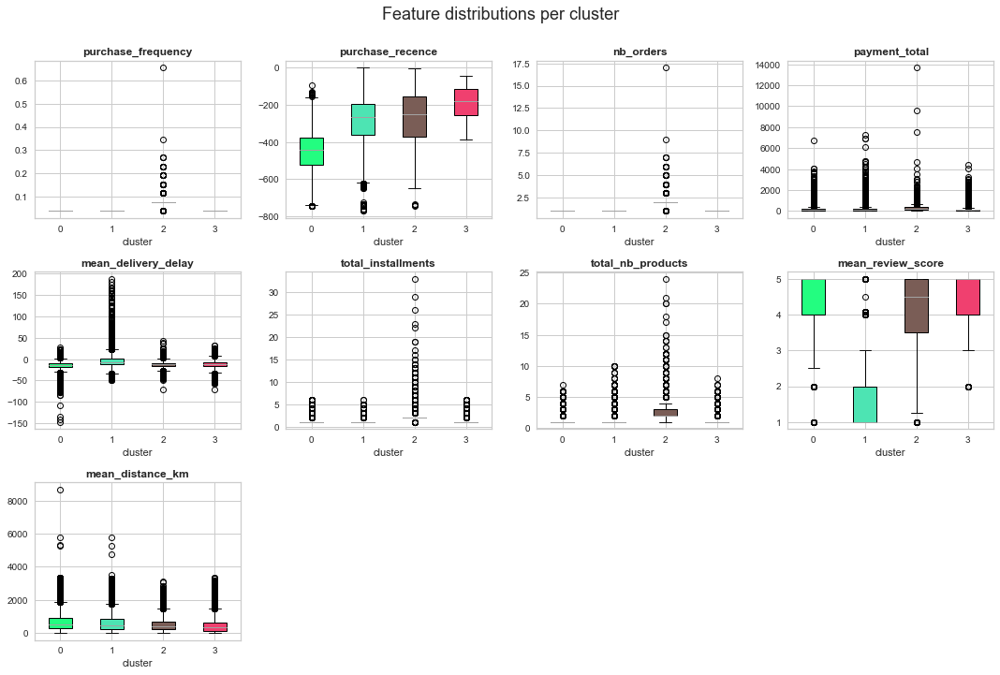

In [333]:
boxplot_visu(tog, km_tog4)

Détail par variable : Barplot

In [334]:
X_dev_rel, X_std_mean = data_mean_std(tog, tog_scaled)

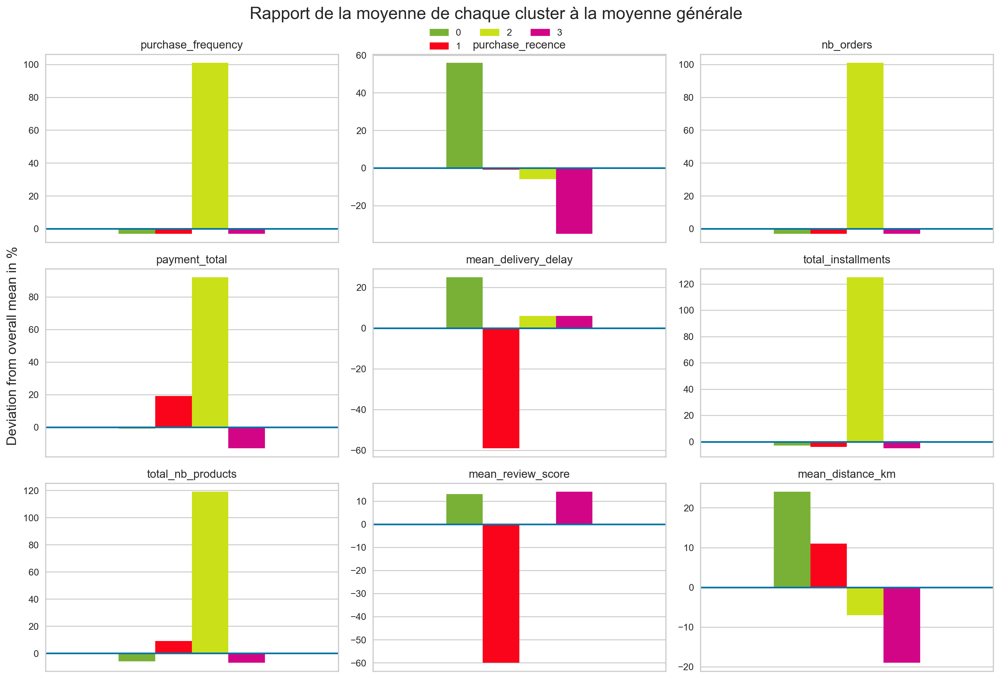

In [335]:
colors = cluster_colors(len(np.unique(km_tog4.labels_)))
cluster_comparison_bar(tog, X_dev_rel, colors,
                       title="Rapport de la moyenne de chaque cluster à la moyenne générale")

Détail par cluster : Barplot

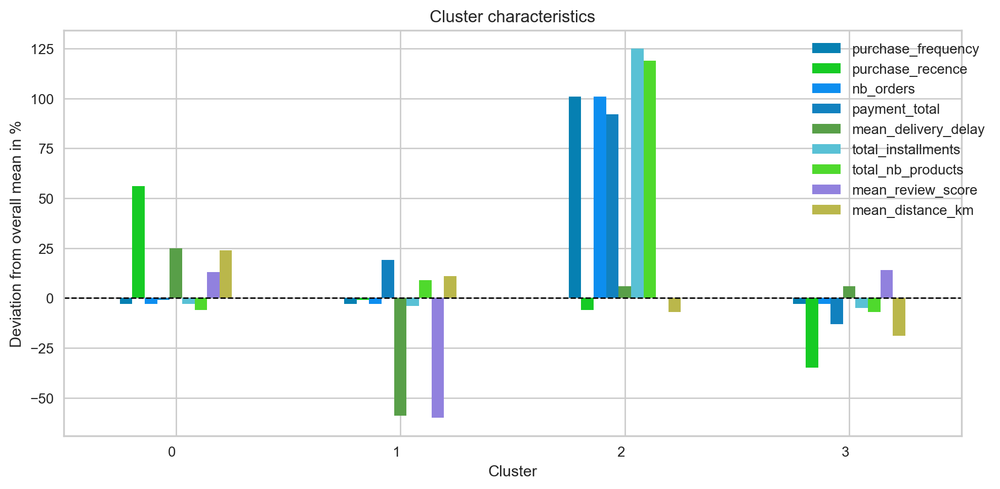

In [336]:
barplot_visu(X_dev_rel, tog.shape[1])

Détail par cluster : Radarplot

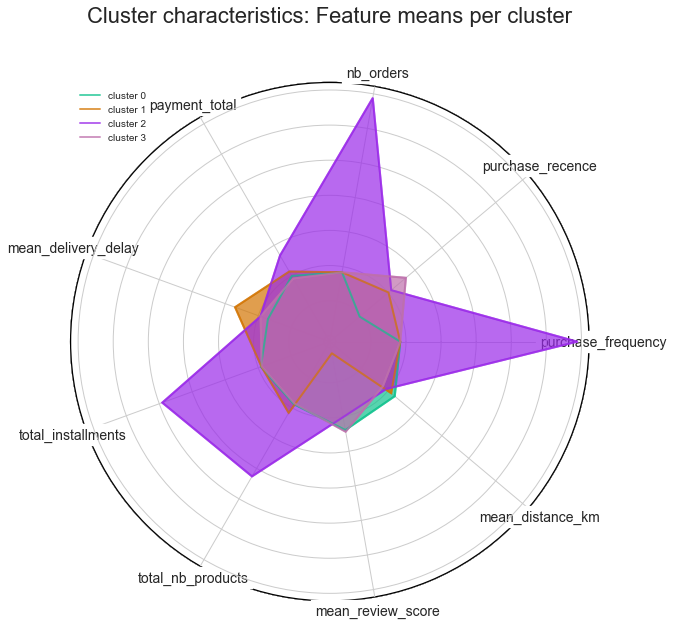

In [351]:
radarplot_visu(X_std_mean, km_tog4)

### All together : 5 clusters

In [352]:
km_tog5 = KMeans(n_clusters=5, max_iter=300, tol=1e-04, init='k-means++', n_init=10, random_state=0, algorithm='auto')
km_tog5_fit = km_tog5.fit(tog_scaled)

Cardinalité et Magnitude

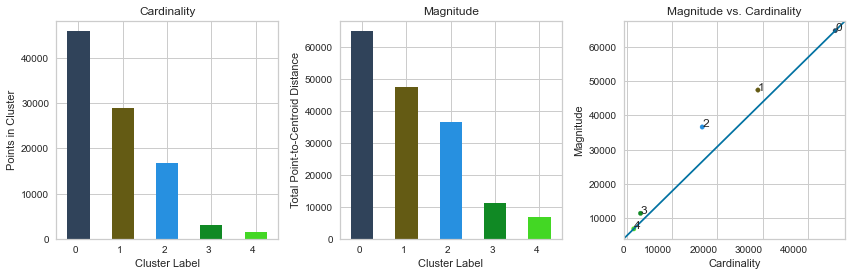

In [353]:
cardinality_magnitude(tog_scaled, km_tog5_fit, 5)

Visualisation ACP

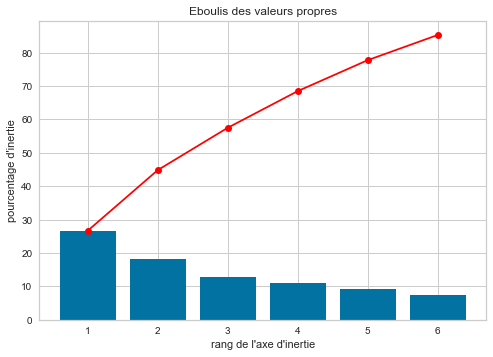

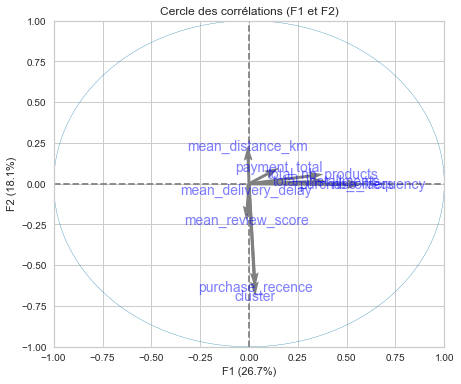

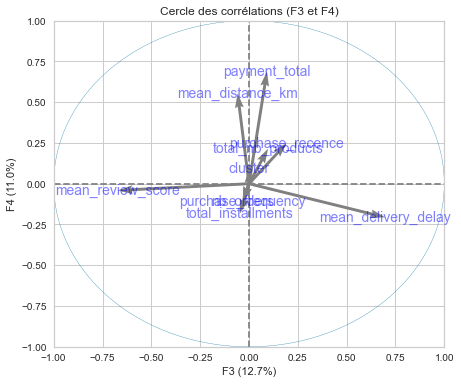

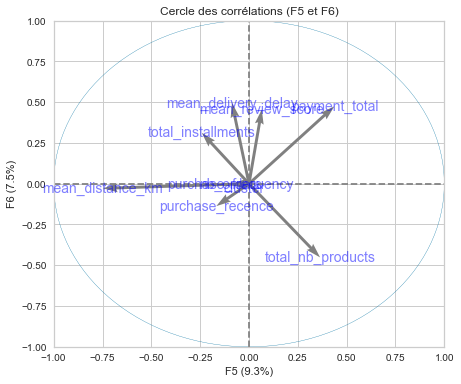

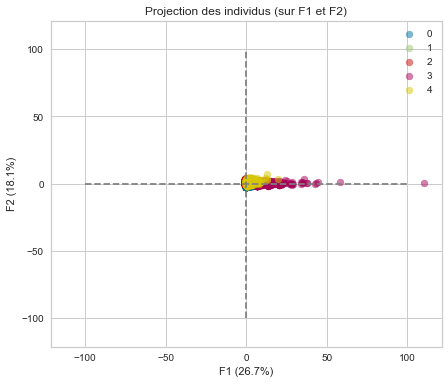

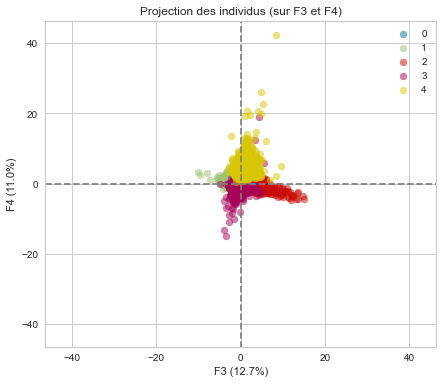

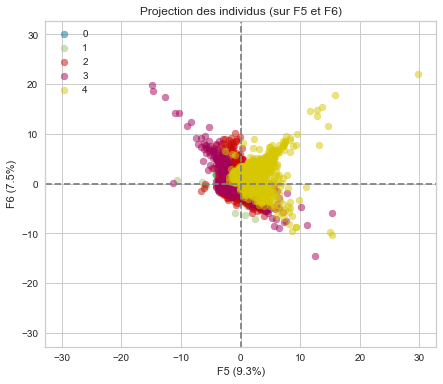

In [354]:
display_pca(tog_scaled, split=km_tog5_fit.labels_, n_comp=6)

In [355]:
tog['cluster'] = km_tog5.labels_
tog_scaled['cluster'] = km_tog5.labels_

Détail par variable : Boxplot

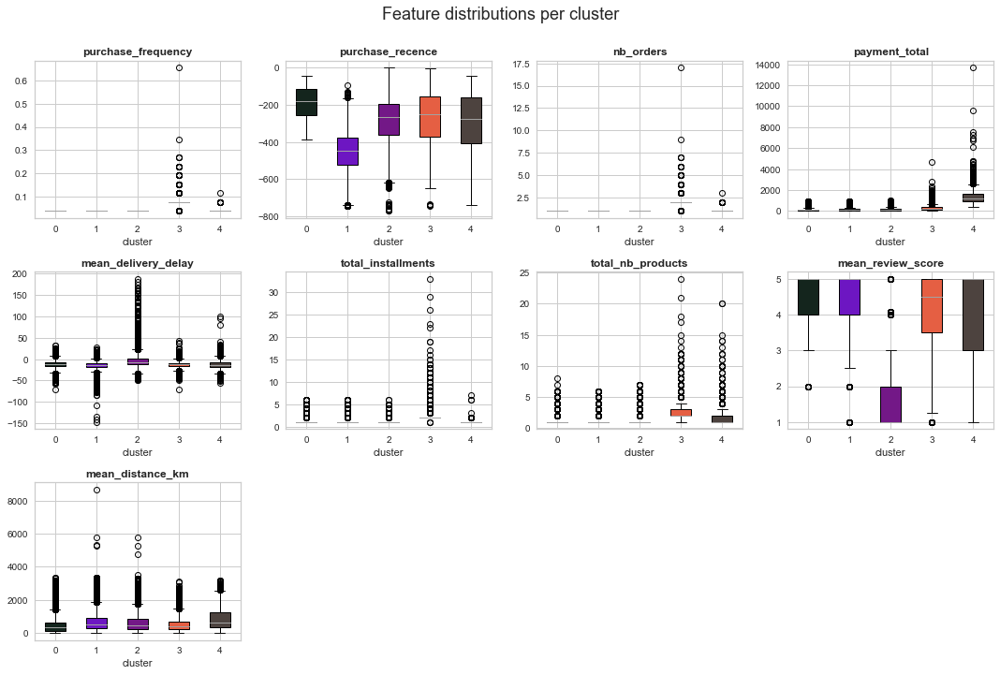

In [356]:
boxplot_visu(tog, km_tog5)

Détail par variable : Barplot

In [357]:
X_dev_rel, X_std_mean = data_mean_std(tog, tog_scaled)

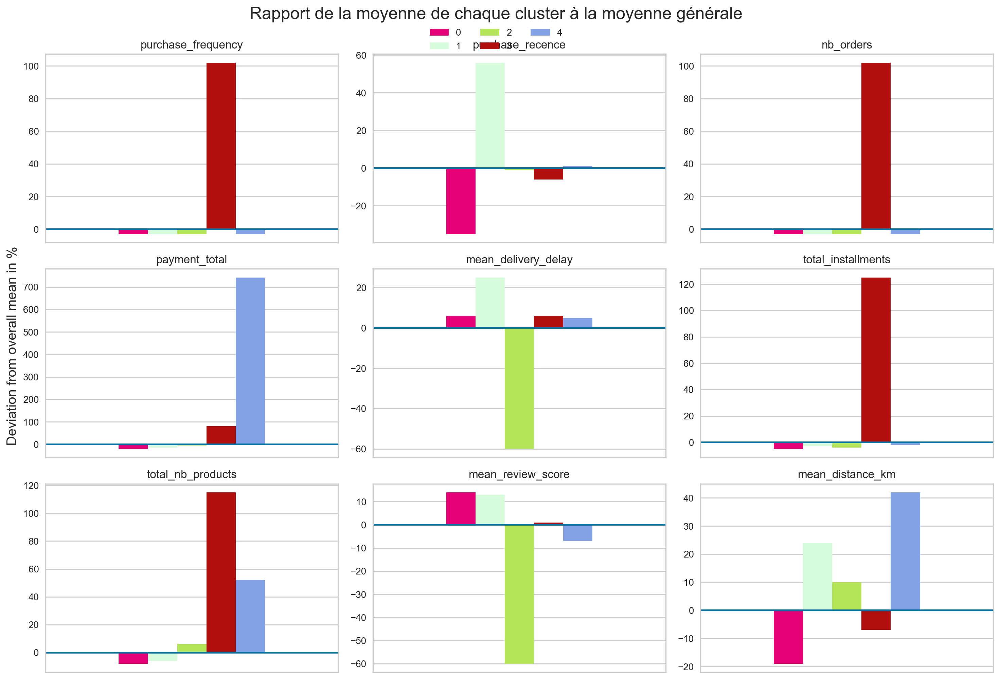

In [358]:
colors = cluster_colors(len(np.unique(km_tog5.labels_)))
cluster_comparison_bar(tog, X_dev_rel, colors,
                       title="Rapport de la moyenne de chaque cluster à la moyenne générale")

Détail par cluster : Barplot

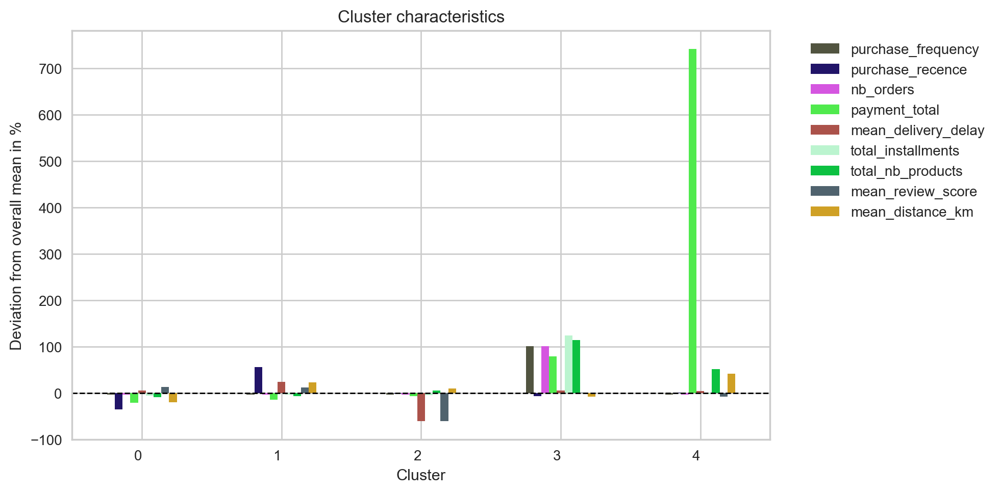

In [359]:
barplot_visu(X_dev_rel, tog.shape[1])

Détail par cluster : Radarplot

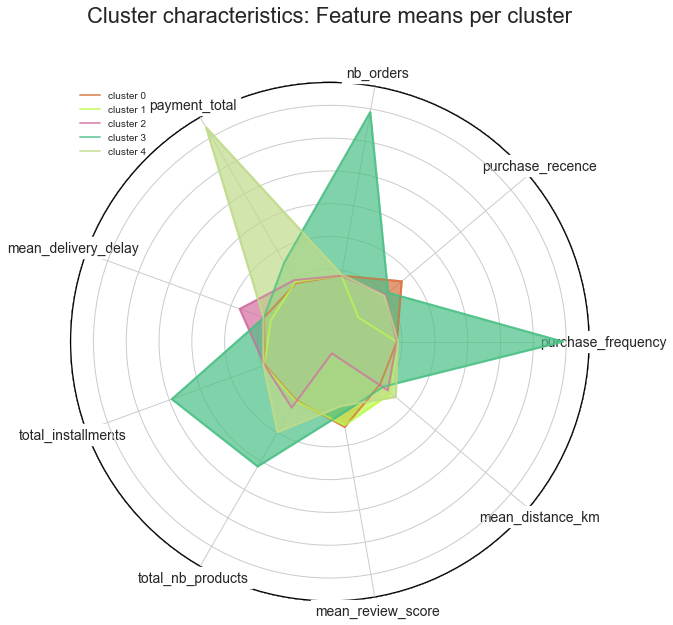

In [360]:
radarplot_visu(X_std_mean, km_tog5)

### All together without distance_km

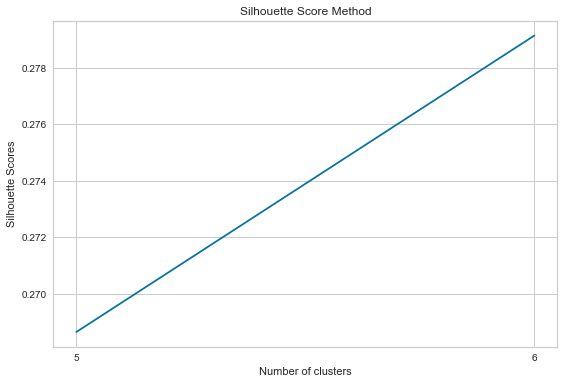

For n_clusters = 5, the average silhouette score is : 0.26864976043791894
For n_clusters = 6, the average silhouette score is : 0.2791497285752753


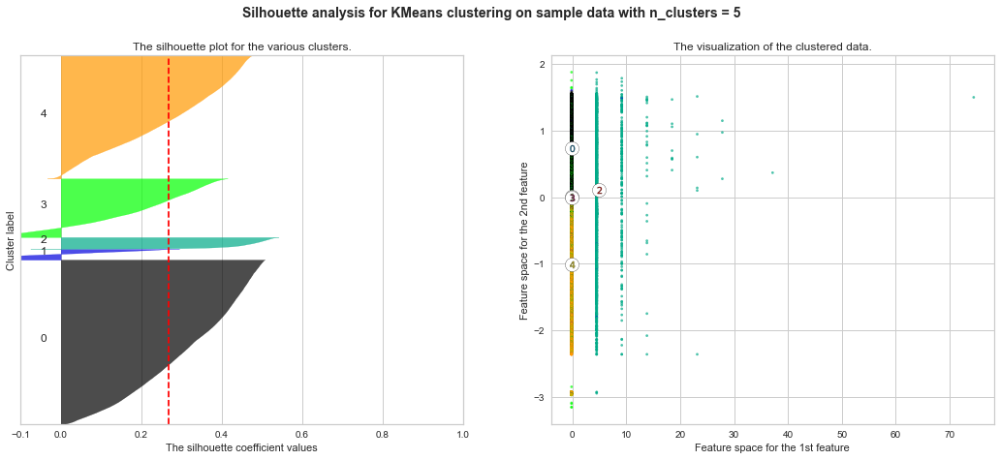

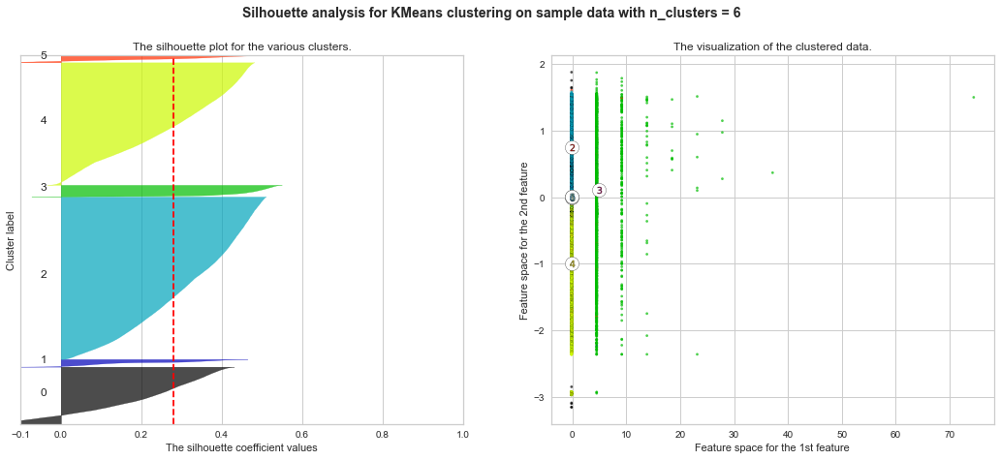

In [25]:
silhouette_visu(yrpi_scaled, 5, 6)

### All together without distance_km : 3 clusters

In [364]:
km_yrpi = KMeans(n_clusters=3, max_iter=300, tol=1e-04, init='k-means++', n_init=10, random_state=0, algorithm='auto')
km_yrpi_fit = km_yrpi.fit(yrpi_scaled)

Cardinalité et Magnitude

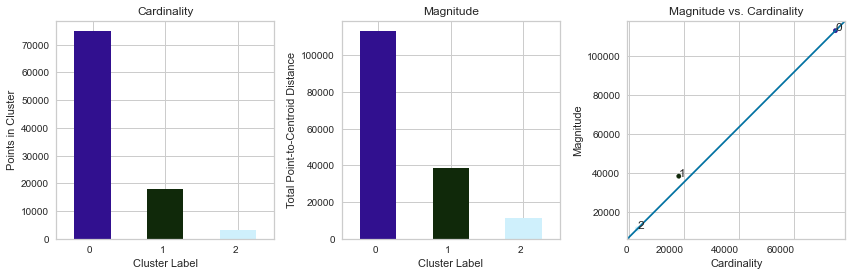

In [365]:
cardinality_magnitude(yrpi_scaled, km_yrpi_fit, 3)

Visualisation ACP

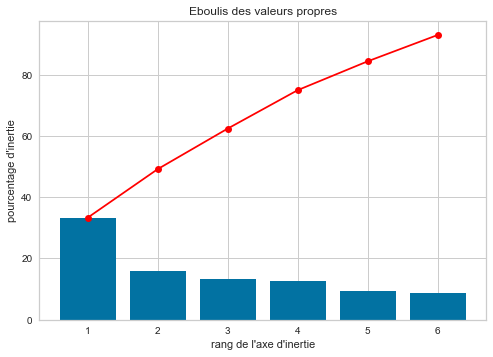

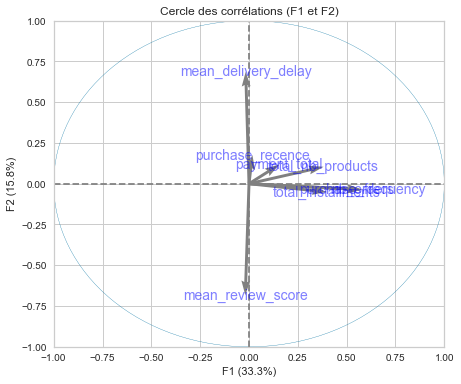

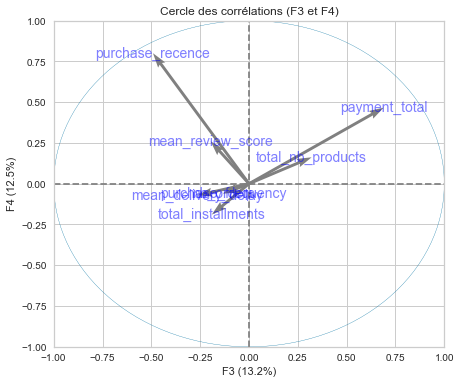

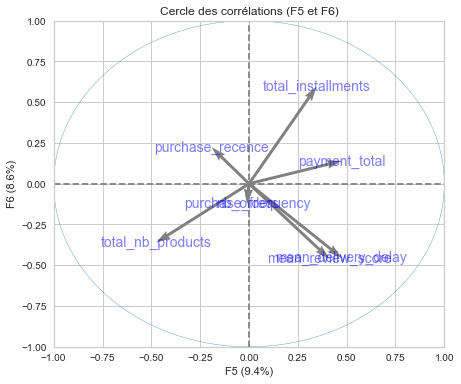

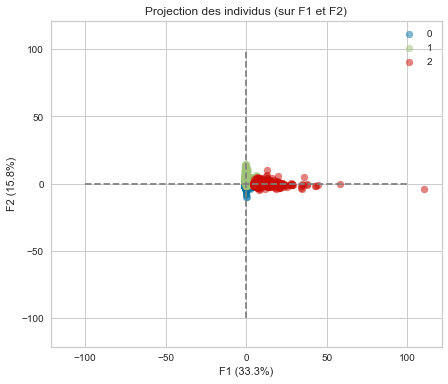

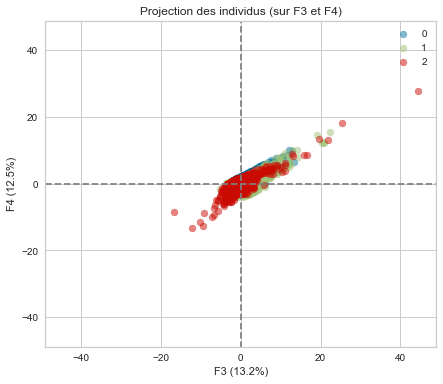

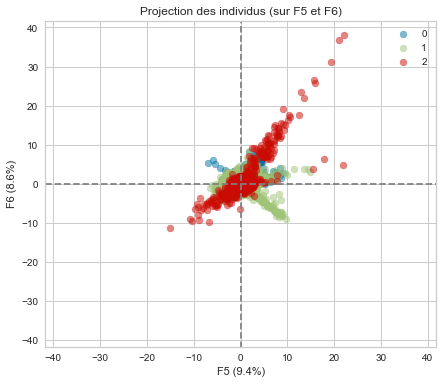

In [366]:
display_pca(yrpi_scaled, split=km_yrpi_fit.labels_, n_comp=6)

In [367]:
yrpi['cluster'] = km_yrpi.labels_
yrpi_scaled['cluster'] = km_yrpi.labels_

Détail par variable : Boxplot

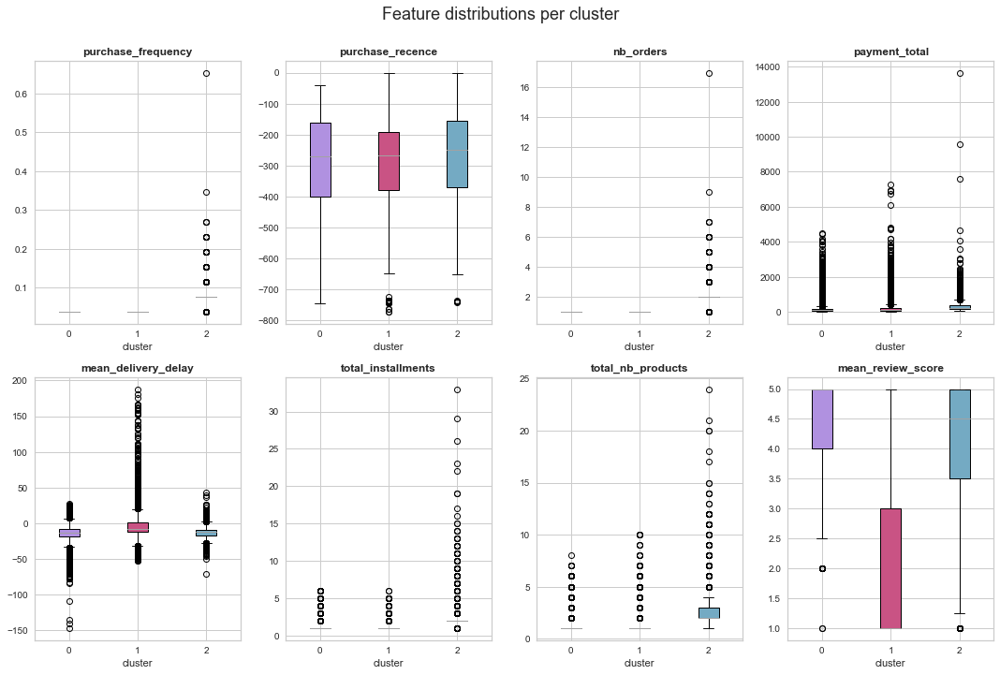

In [368]:
boxplot_visu(yrpi, km_yrpi)

Détail par variable : Barplot

In [369]:
X_dev_rel, X_std_mean = data_mean_std(yrpi, yrpi_scaled)

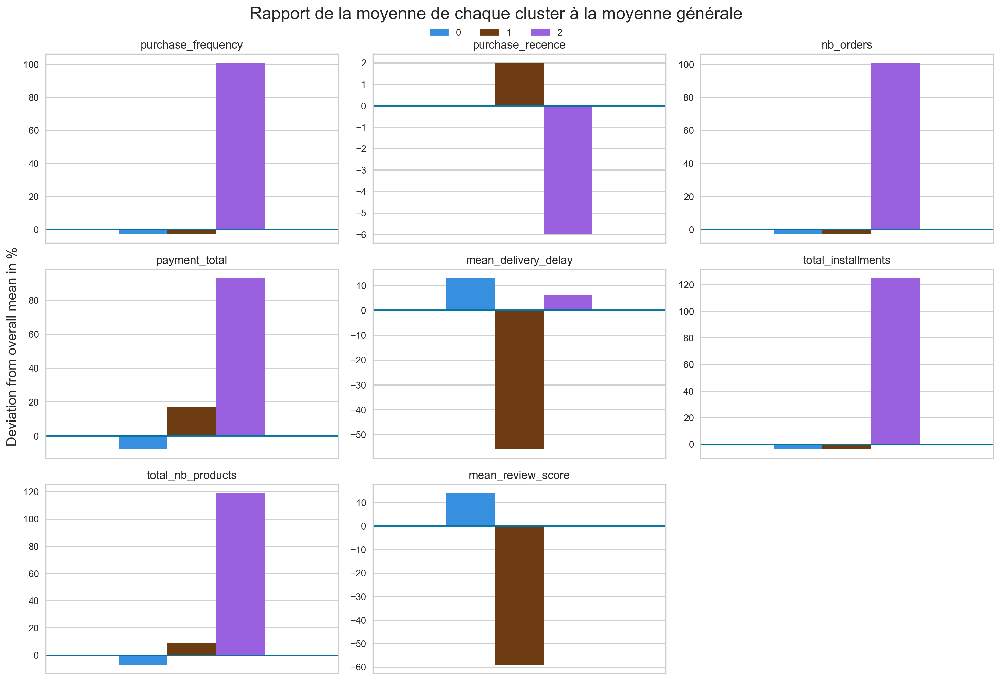

In [370]:
colors = cluster_colors(len(np.unique(km_yrpi.labels_)))
cluster_comparison_bar(yrpi, X_dev_rel, colors,
                       title="Rapport de la moyenne de chaque cluster à la moyenne générale")

Détail par cluster : Barplot

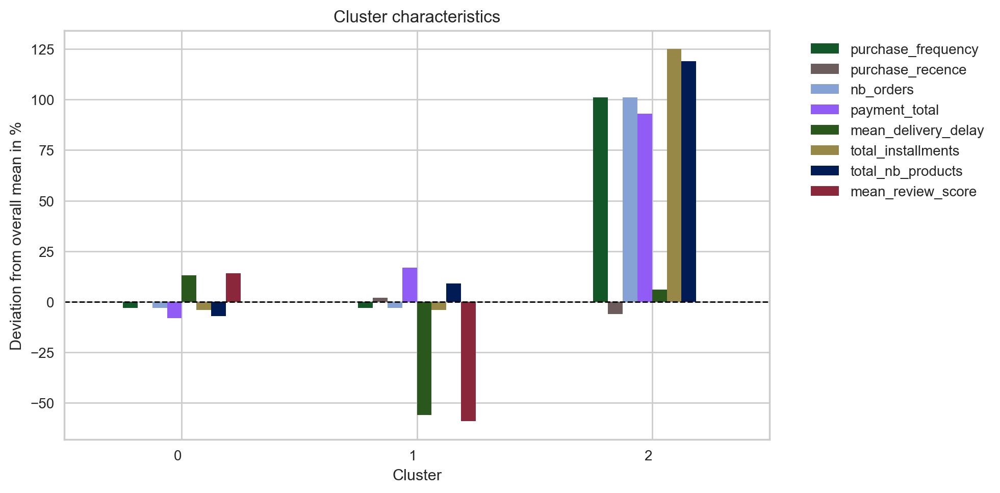

In [371]:
barplot_visu(X_dev_rel, yrpi.shape[1])

Détail par cluster : Radarplot

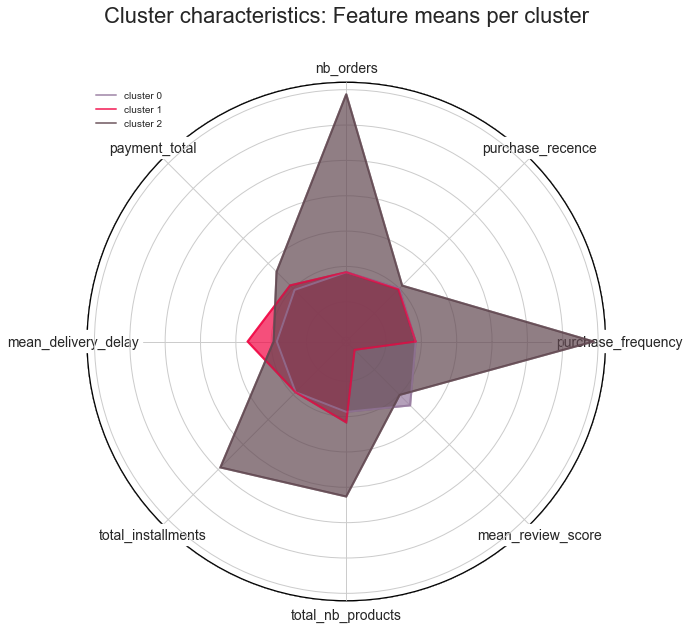

In [372]:
radarplot_visu(X_std_mean, km_yrpi)

### All together without distance_km : 5 clusters

In [22]:
km_yrpi5 = KMeans(n_clusters=5, max_iter=300, tol=1e-04, init='k-means++', n_init=10, random_state=0, algorithm='auto')
km_yrpi5_fit = km_yrpi5.fit(yrpi_scaled)

Cardinalité et Magnitude

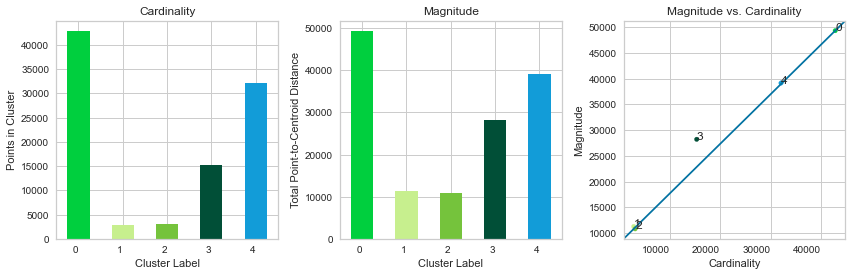

In [23]:
cardinality_magnitude(yrpi_scaled, km_yrpi5_fit, 5)

Visualisation ACP

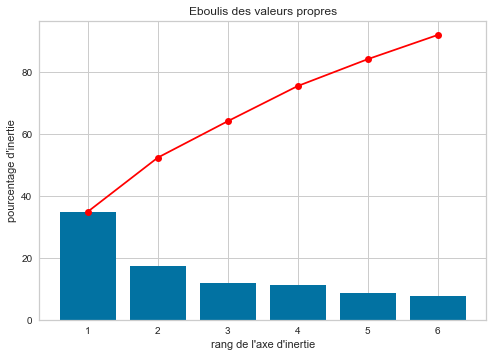

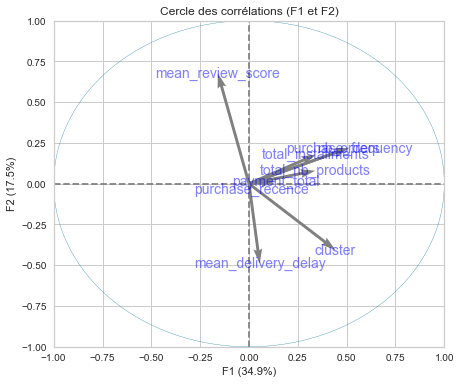

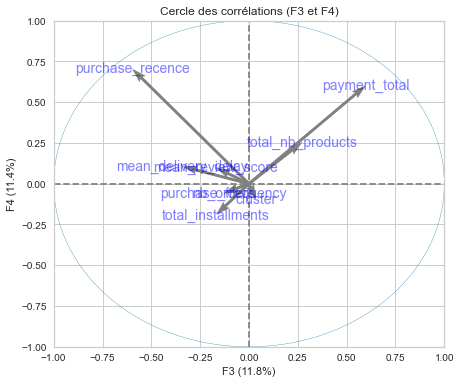

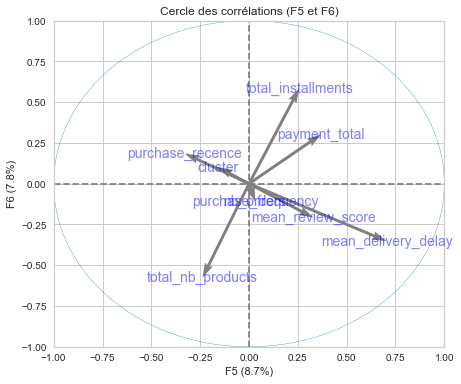

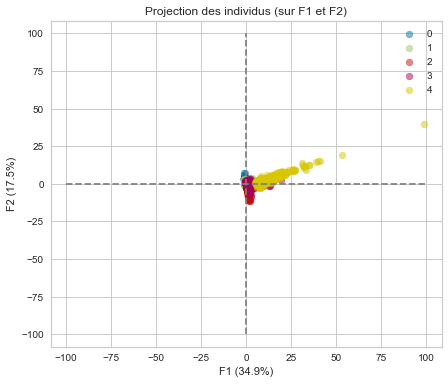

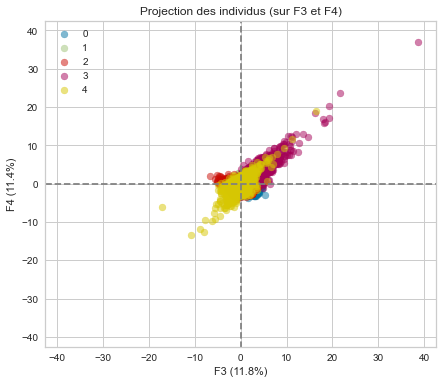

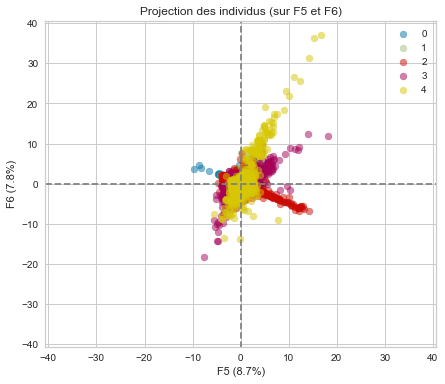

In [375]:
display_pca(yrpi_scaled, split=km_yrpi5_fit.labels_, n_comp=6)

In [24]:
yrpi['cluster'] = km_yrpi5.labels_
yrpi_scaled['cluster'] = km_yrpi5.labels_

Détail par variable : Boxplot

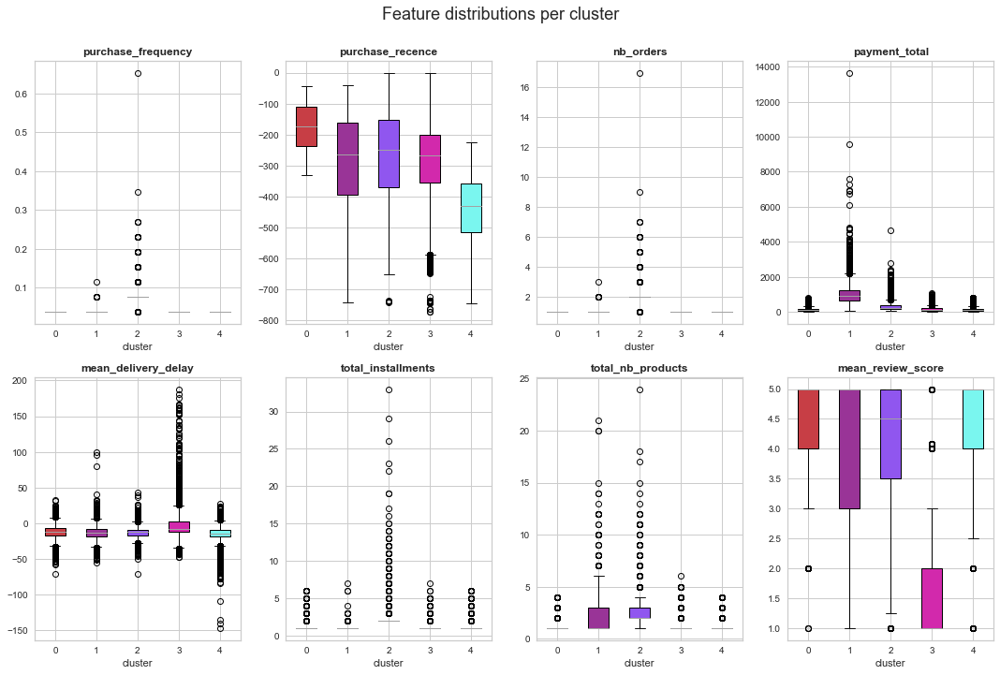

In [25]:
boxplot_visu(yrpi, km_yrpi5)

Détail par variable : Barplot

In [26]:
X_dev_rel, X_std_mean = data_mean_std(yrpi, yrpi_scaled)

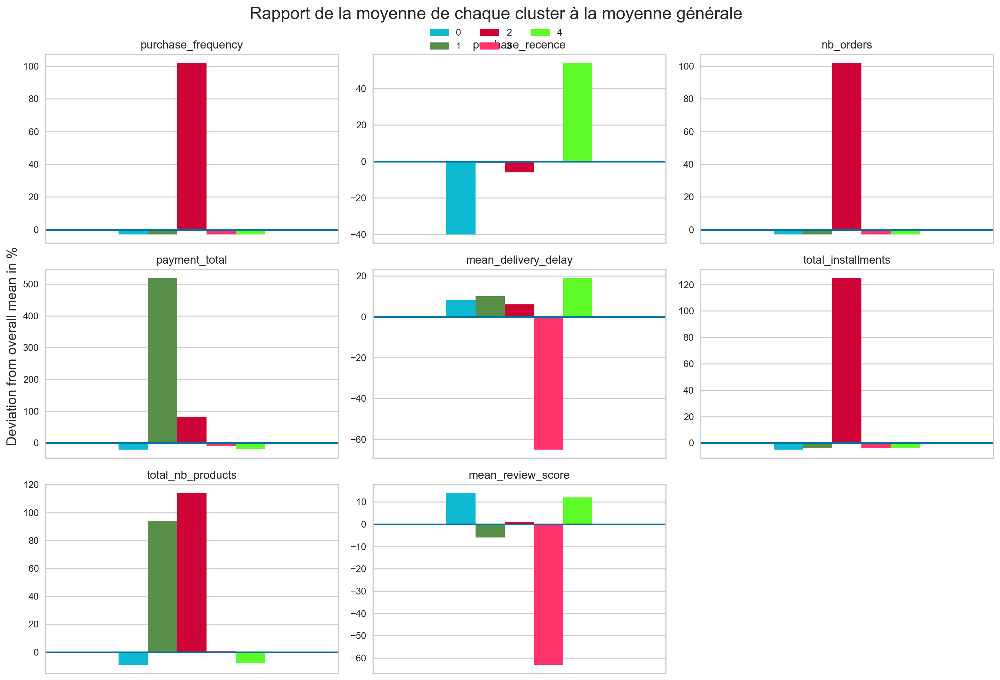

In [27]:
colors = cluster_colors(len(np.unique(km_yrpi5.labels_)))
cluster_comparison_bar(yrpi, X_dev_rel, colors,
                       title="Rapport de la moyenne de chaque cluster à la moyenne générale")

Détail par cluster : Barplot

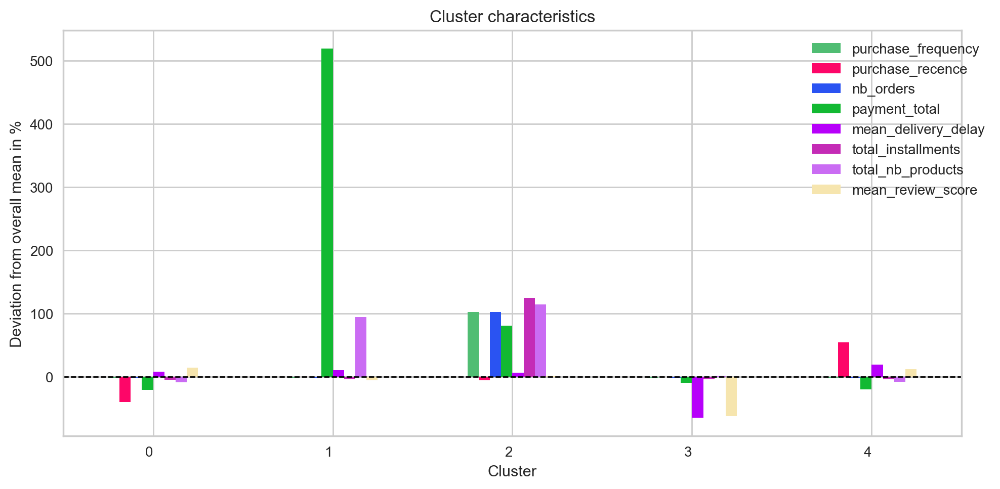

In [28]:
barplot_visu(X_dev_rel, yrpi.shape[1])

Détail par cluster : Radarplot

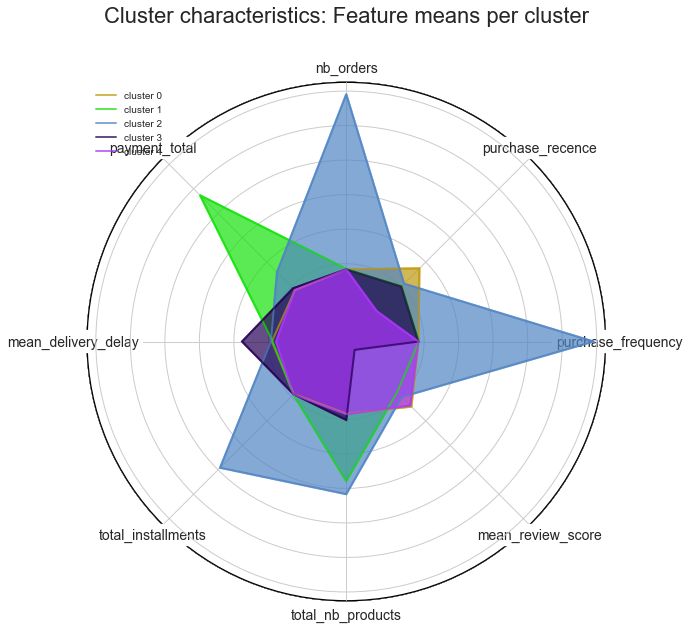

In [31]:
radarplot_visu(X_std_mean, km_yrpi5)

### All together without distance_km : 6 clusters

In [382]:
km_yrpi6 = KMeans(n_clusters=6, max_iter=300, tol=1e-04, init='k-means++', n_init=10, random_state=0, algorithm='auto')
km_yrpi6_fit = km_yrpi6.fit(yrpi_scaled)

Cardinalité et Magnitude

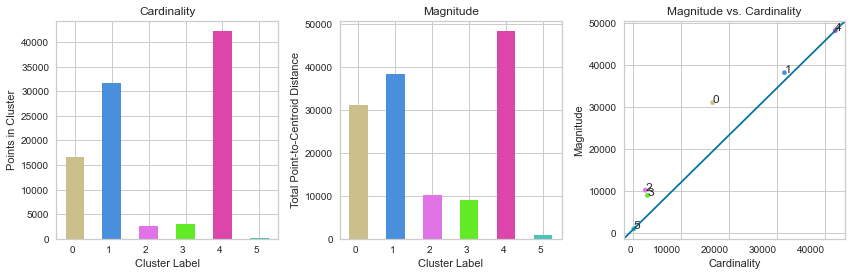

In [383]:
cardinality_magnitude(yrpi_scaled, km_yrpi6_fit, 6)

Visualisation ACP

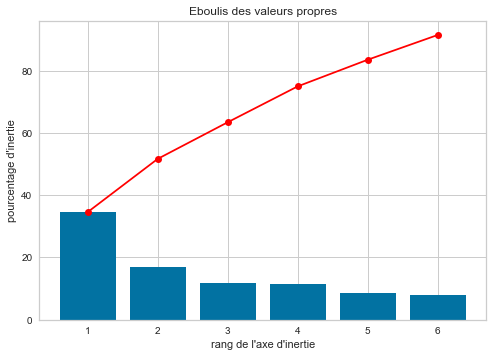

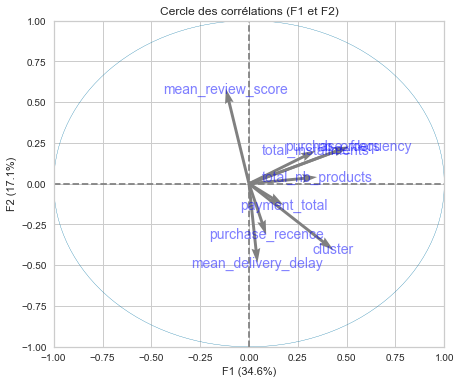

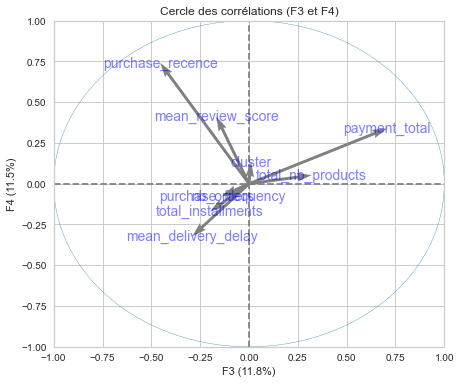

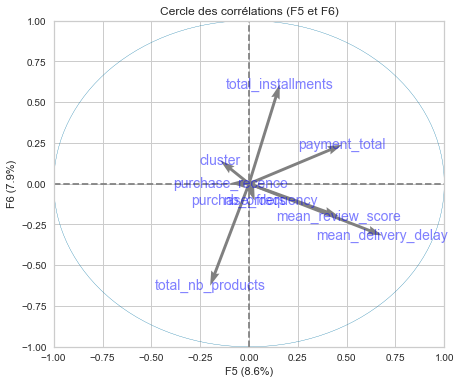

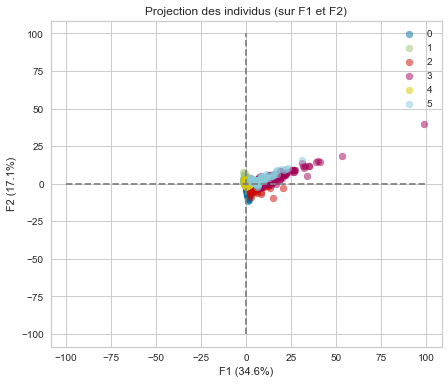

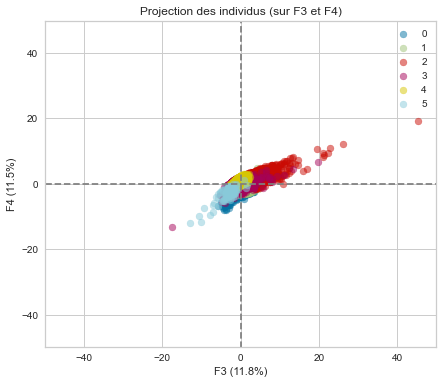

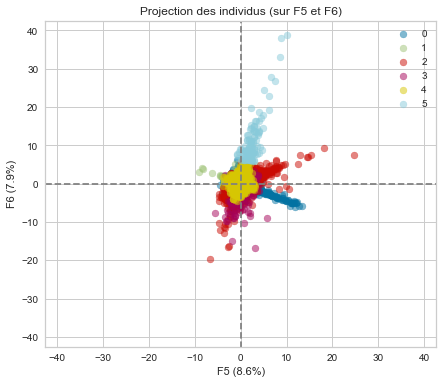

In [384]:
display_pca(yrpi_scaled, split=km_yrpi6_fit.labels_, n_comp=6)

In [385]:
yrpi['cluster'] = km_yrpi6.labels_
yrpi_scaled['cluster'] = km_yrpi6.labels_

Détail par variable : Boxplot

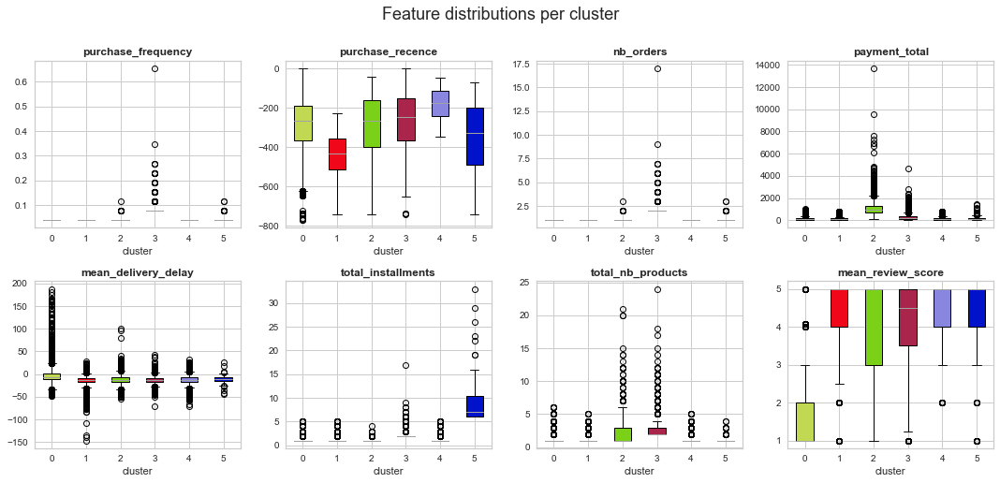

In [386]:
boxplot_visu(yrpi, km_yrpi6)

Détail par variable : Barplot

In [387]:
X_dev_rel, X_std_mean = data_mean_std(yrpi, yrpi_scaled)

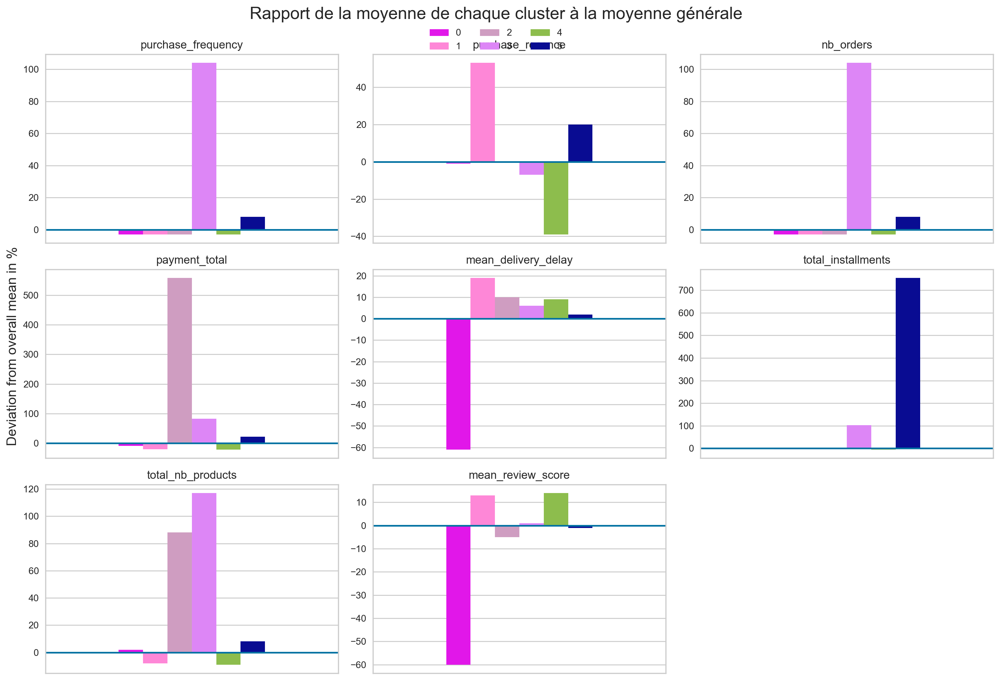

In [388]:
colors = cluster_colors(len(np.unique(km_yrpi6.labels_)))
cluster_comparison_bar(yrpi, X_dev_rel, colors,
                       title="Rapport de la moyenne de chaque cluster à la moyenne générale")

Détail par cluster : Barplot

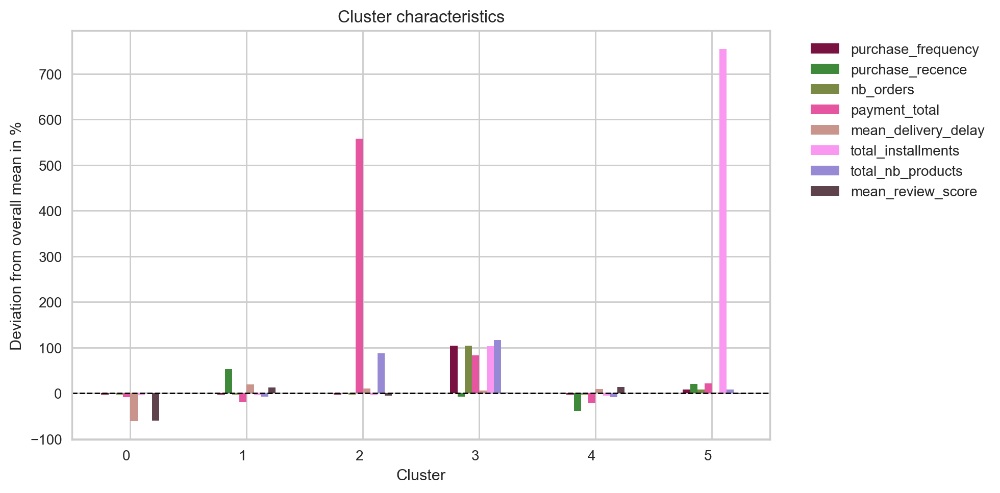

In [389]:
barplot_visu(X_dev_rel, yrpi.shape[1])

Détail par cluster : Radarplot

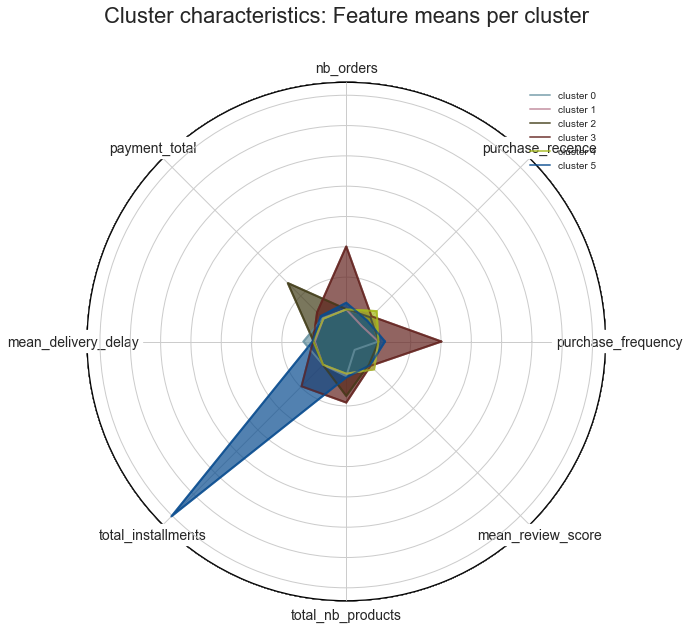

In [390]:
radarplot_visu(X_std_mean, km_yrpi6)

### All together without distance_km : 7 clusters

In [391]:
km_yrpi7 = KMeans(n_clusters=7, max_iter=300, tol=1e-04, init='k-means++', n_init=10, random_state=0, algorithm='auto')
km_yrpi7_fit = km_yrpi7.fit(yrpi_scaled)

Cardinalité et Magnitude

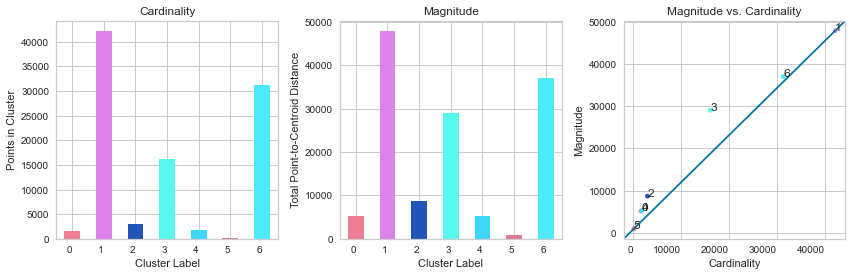

In [392]:
cardinality_magnitude(yrpi_scaled, km_yrpi7_fit, 7)

Visualisation ACP

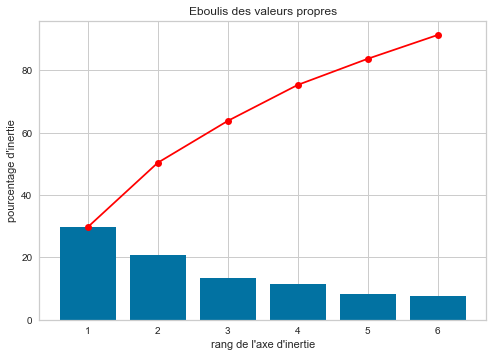

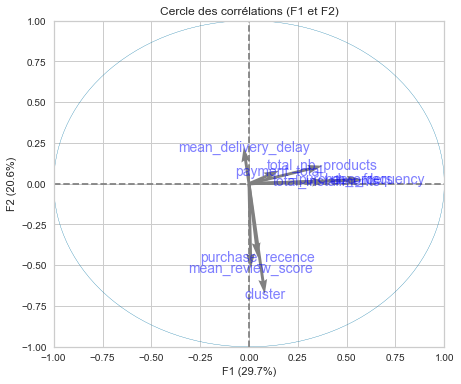

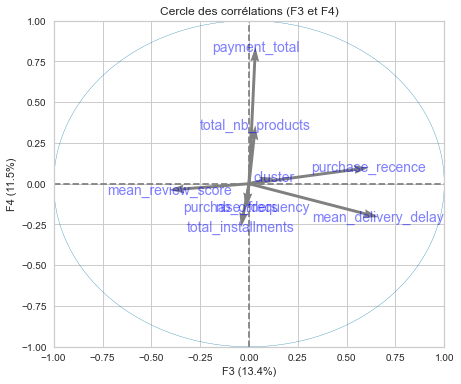

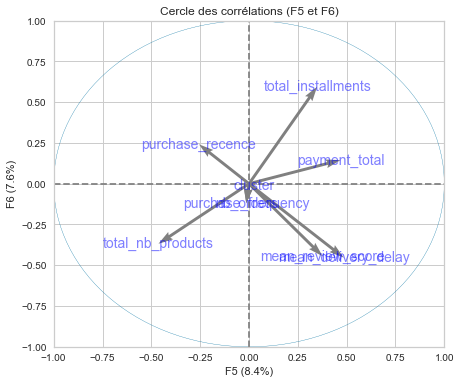

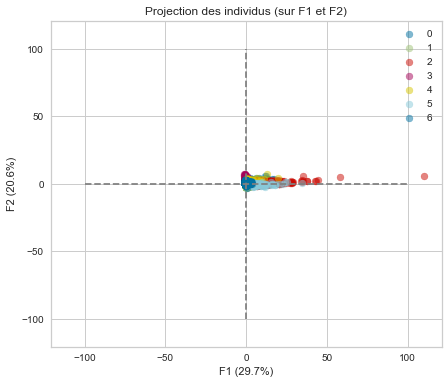

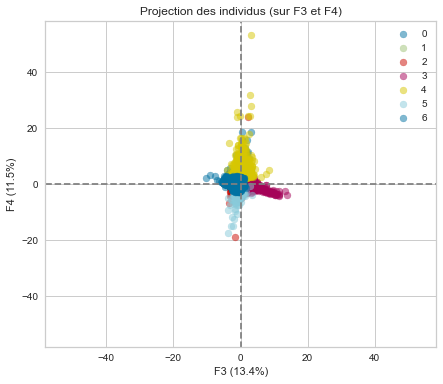

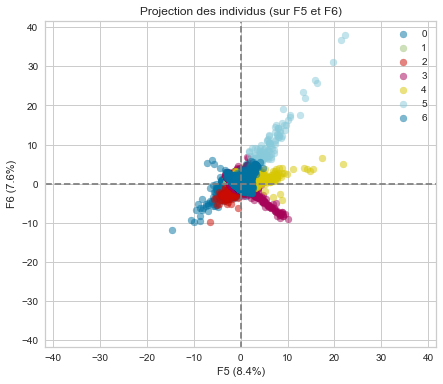

In [393]:
display_pca(yrpi_scaled, split=km_yrpi7_fit.labels_, n_comp=6)

In [394]:
yrpi['cluster'] = km_yrpi7.labels_
yrpi_scaled['cluster'] = km_yrpi7.labels_

Détail par variable : Boxplot

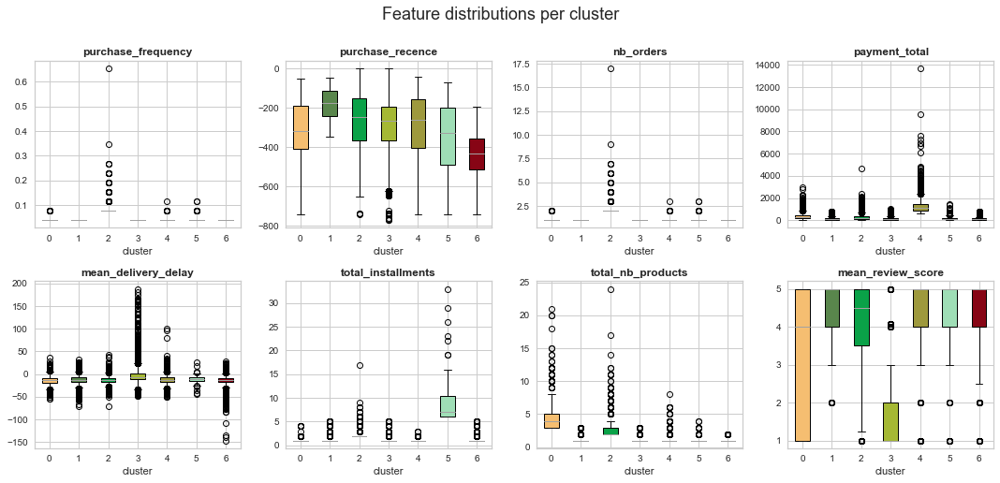

In [395]:
boxplot_visu(yrpi, km_yrpi7)

Détail par variable : Barplot

In [396]:
X_dev_rel, X_std_mean = data_mean_std(yrpi, yrpi_scaled)

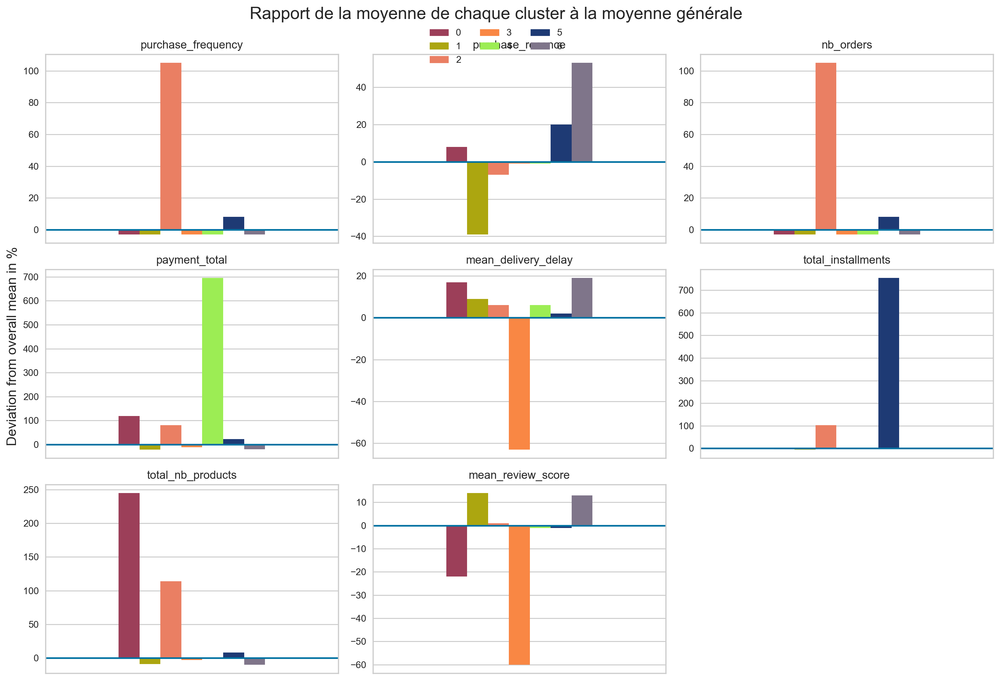

In [397]:
colors = cluster_colors(len(np.unique(km_yrpi7.labels_)))
cluster_comparison_bar(yrpi, X_dev_rel, colors,
                       title="Rapport de la moyenne de chaque cluster à la moyenne générale")

Détail par cluster : Barplot

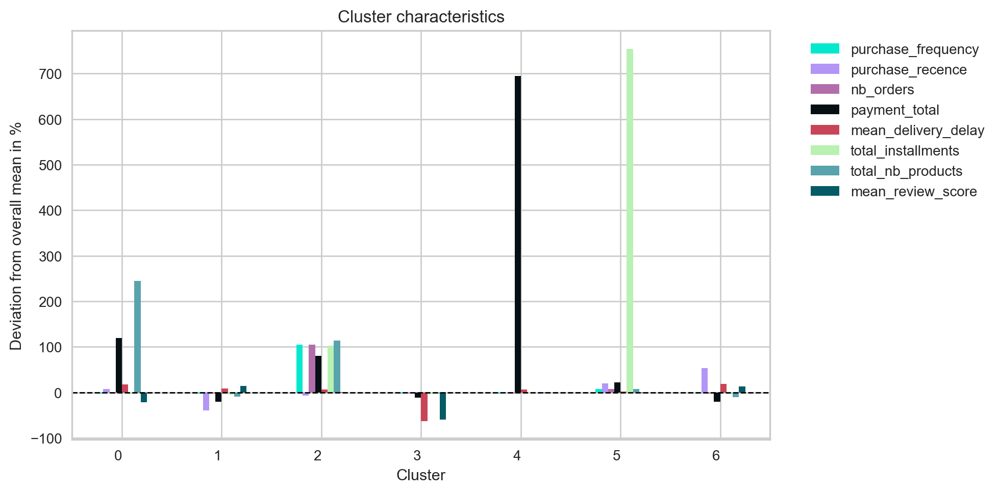

In [398]:
barplot_visu(X_dev_rel, yrpi.shape[1])

Détail par cluster : Radarplot

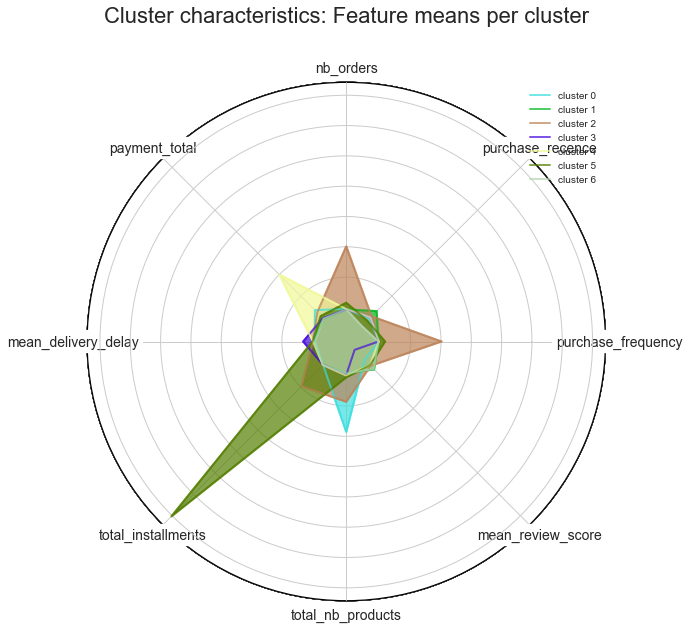

In [399]:
radarplot_visu(X_std_mean, km_yrpi7)

### Distance_km & Review_score & Nb_products & Installments

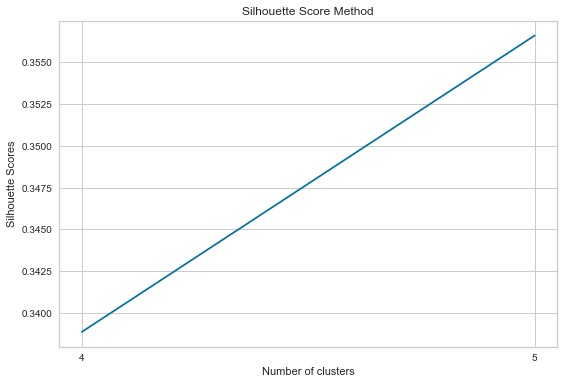

For n_clusters = 4, the average silhouette score is : 0.33884649756078433
For n_clusters = 5, the average silhouette score is : 0.3566073475167351


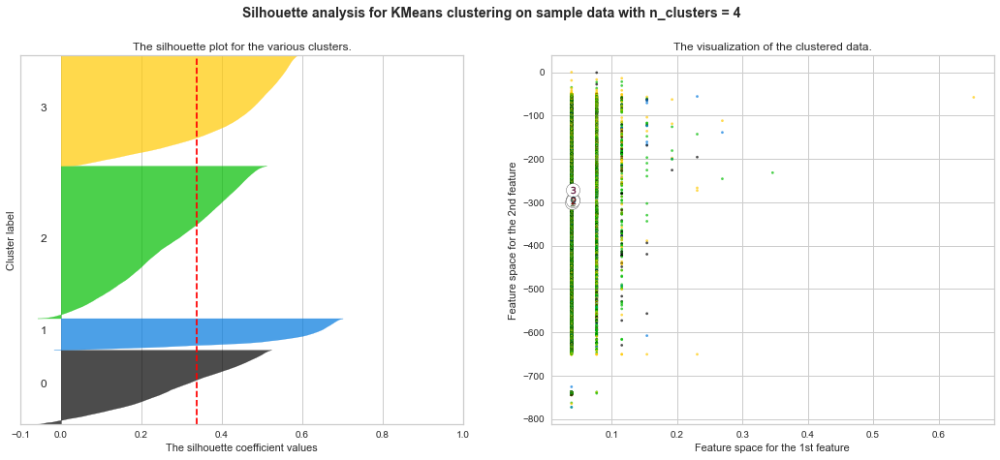

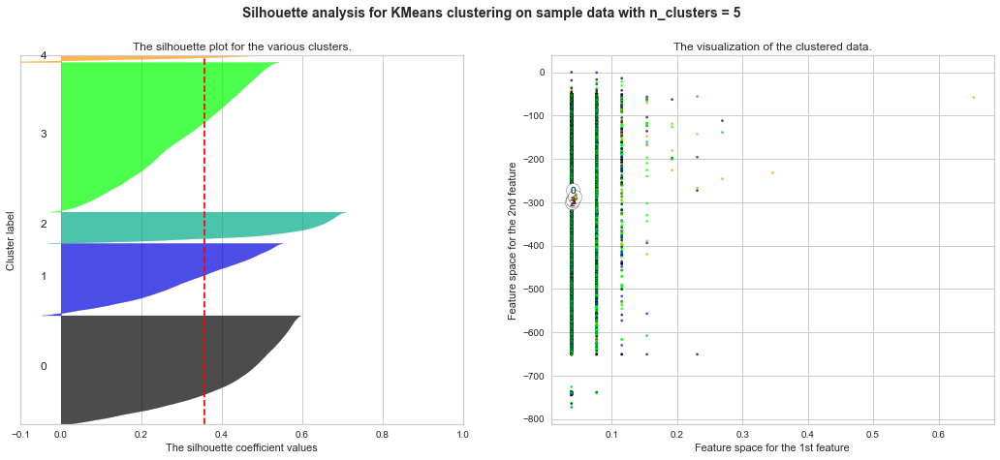

In [240]:
silhouette_visu(drpi_scaled, 4, 5)

### Distance_km & Review_score & Nb_products & Installments : 4 clusters

In [277]:
km_drpi = KMeans(n_clusters=4, max_iter=300, tol=1e-04, init='k-means++', n_init=10, random_state=0, algorithm='auto')
km_drpi_fit = km_drpi.fit(drpi_scaled)

Cardinalité et Magnitude

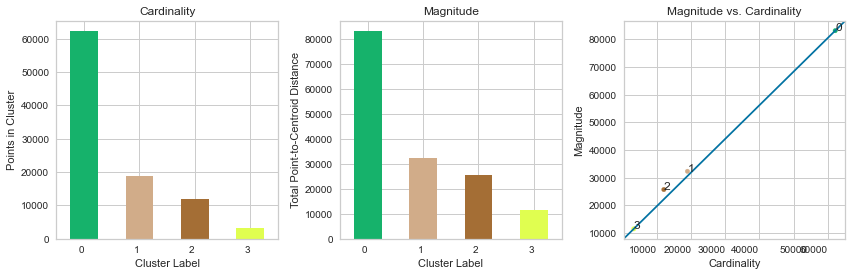

In [278]:
cardinality_magnitude(drpi_scaled, km_drpi_fit, 4)

Visualisation ACP

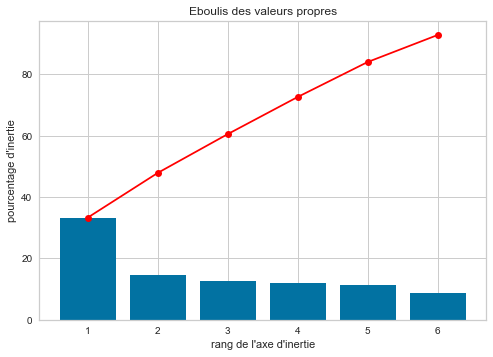

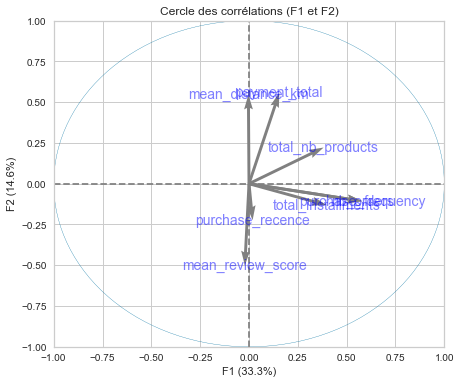

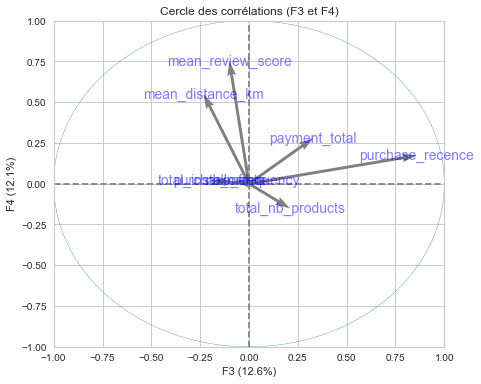

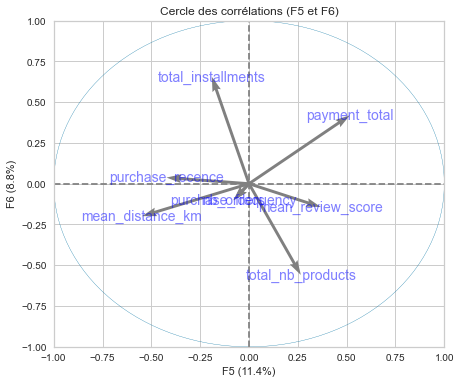

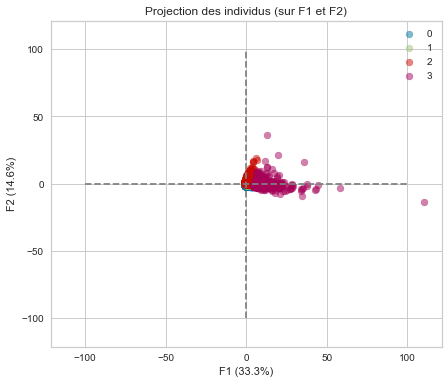

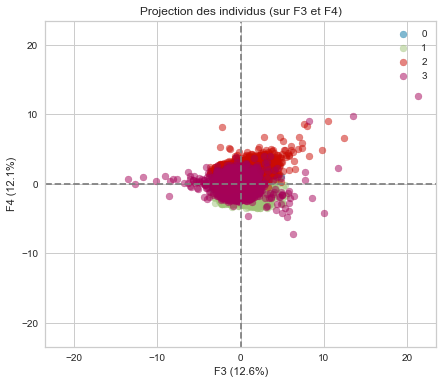

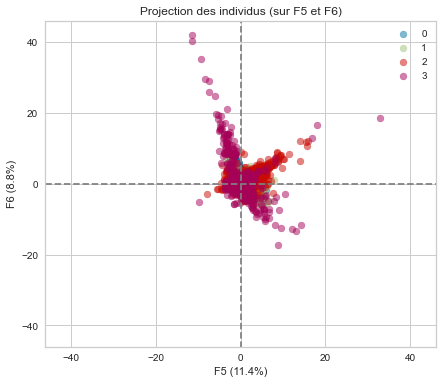

In [279]:
display_pca(drpi_scaled, split=km_drpi_fit.labels_, n_comp=6)

In [280]:
drpi['cluster'] = km_drpi.labels_
drpi_scaled['cluster'] = km_drpi.labels_

Détail par variable : Boxplot

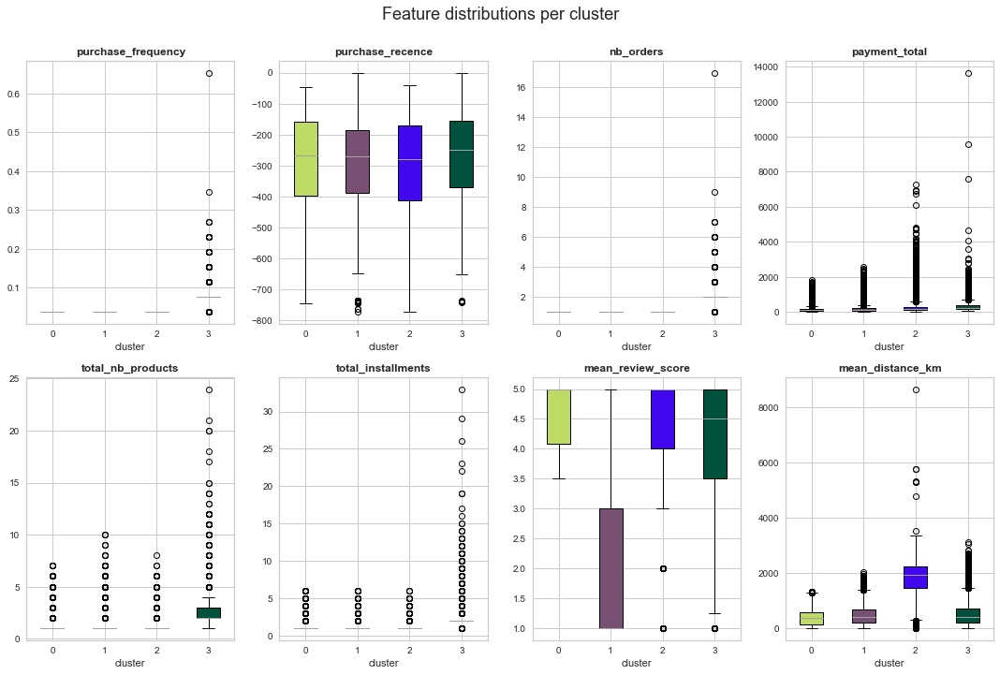

In [281]:
boxplot_visu(drpi, km_drpi)

Détail par variable : Barplot

In [282]:
X_dev_rel, X_std_mean = data_mean_std(drpi, drpi_scaled)

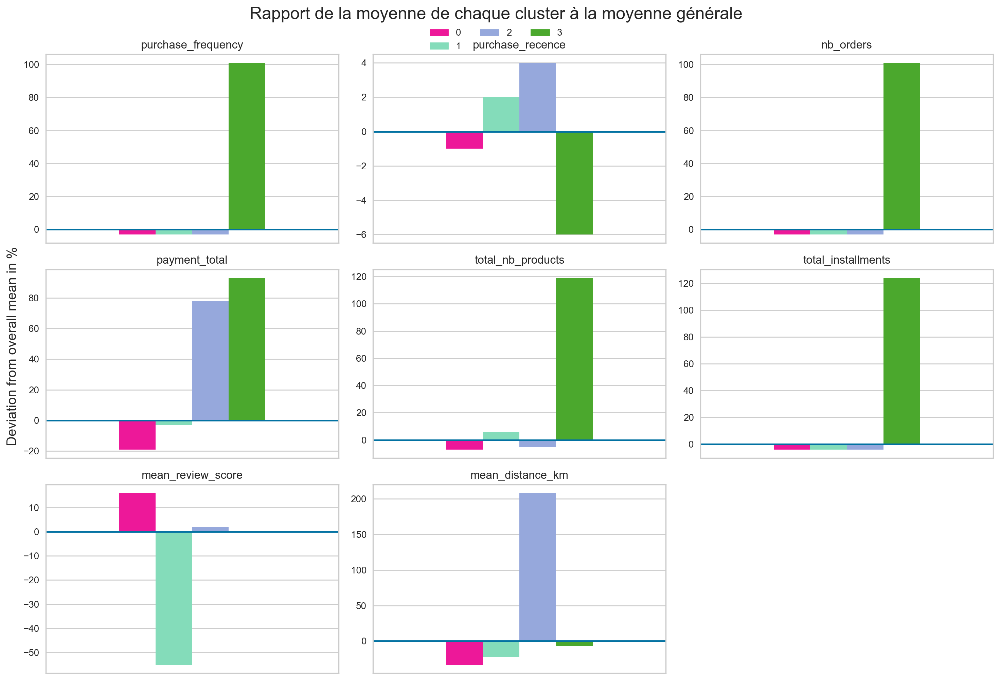

In [283]:
colors = cluster_colors(len(np.unique(km_drpi.labels_)))
cluster_comparison_bar(drpi, X_dev_rel, colors,
                       title="Rapport de la moyenne de chaque cluster à la moyenne générale")

Détail par cluster : Barplot

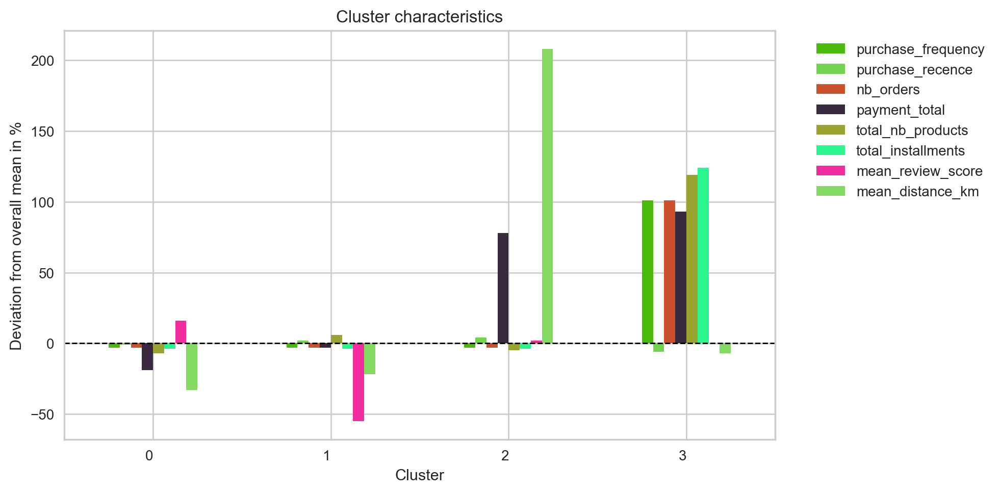

In [284]:
barplot_visu(X_dev_rel, drpi.shape[1])

Détail par cluster : Radarplot

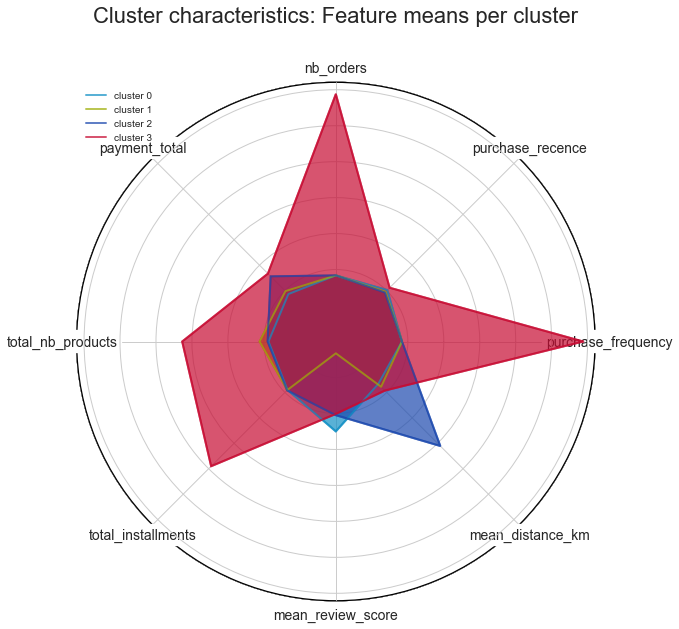

In [285]:
radarplot_visu(X_std_mean, km_drpi)

### Review_score & Nb_products & Installments

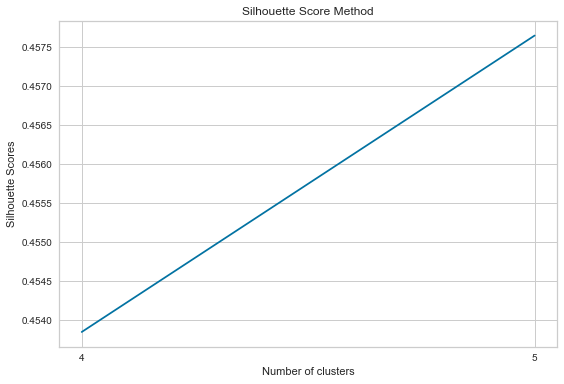

For n_clusters = 4, the average silhouette score is : 0.45384810942535775
For n_clusters = 5, the average silhouette score is : 0.457647065679753


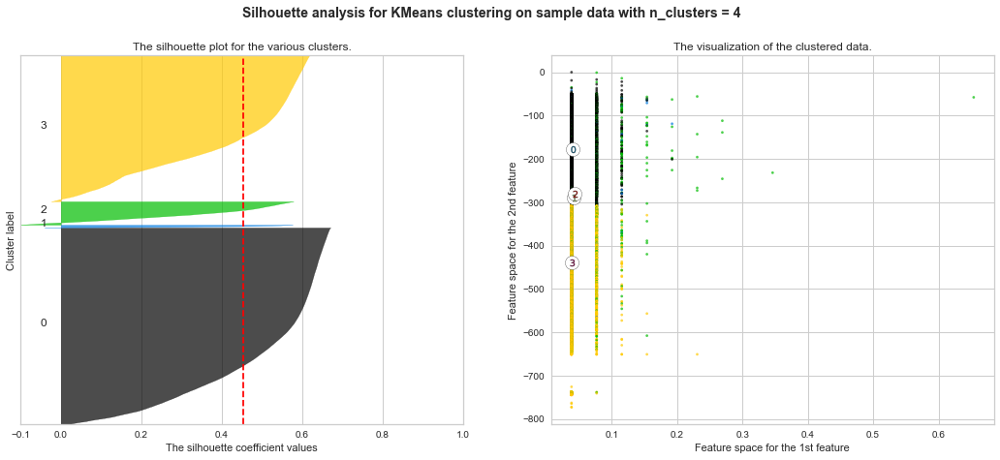

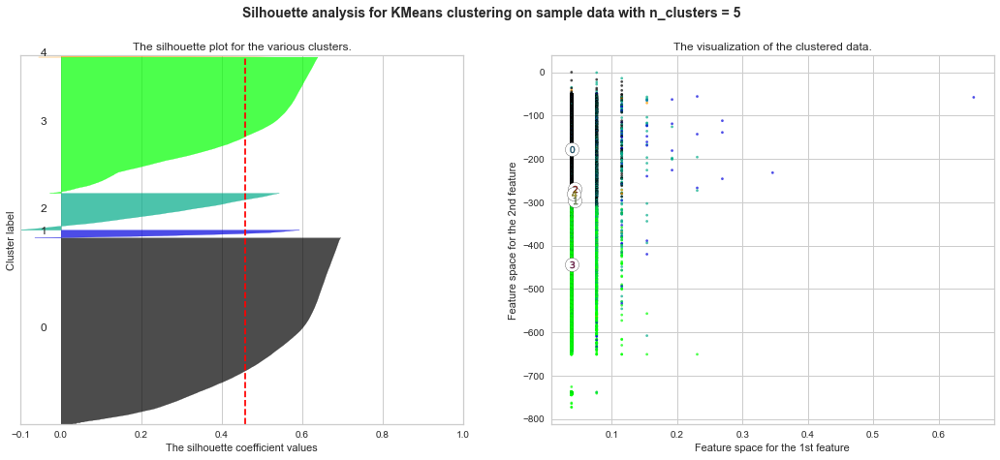

In [239]:
silhouette_visu(rpi_scaled, 4, 5)

### Review_score & Nb_products & Installments : 5 clusters

In [286]:
km_rpi5 = KMeans(n_clusters=5, max_iter=300, tol=1e-04, init='k-means++', n_init=10, random_state=0, algorithm='auto')
km_rpi5_fit = km_rpi5.fit(rpi_scaled)

Cardinalité et Magnitude

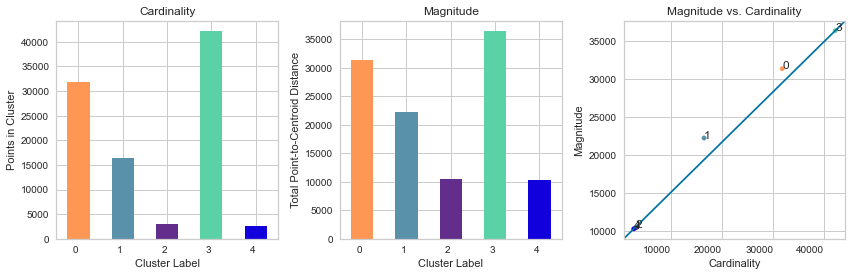

In [287]:
cardinality_magnitude(rpi_scaled, km_rpi5_fit, 5)

Visualisation ACP

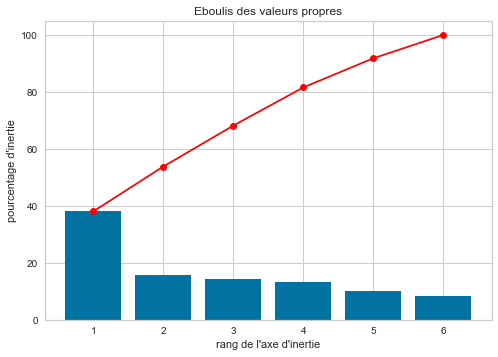

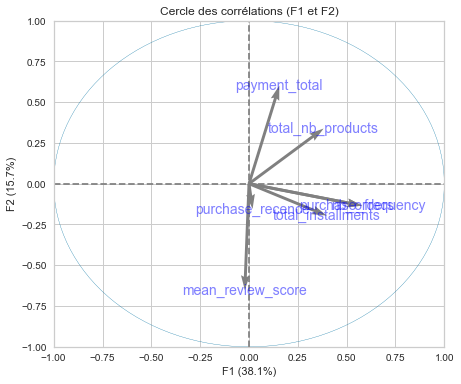

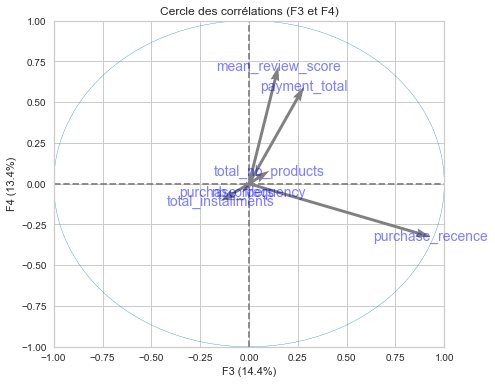

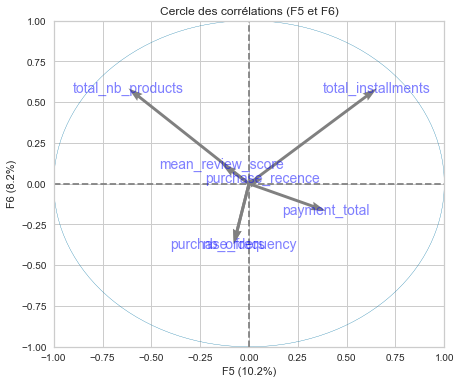

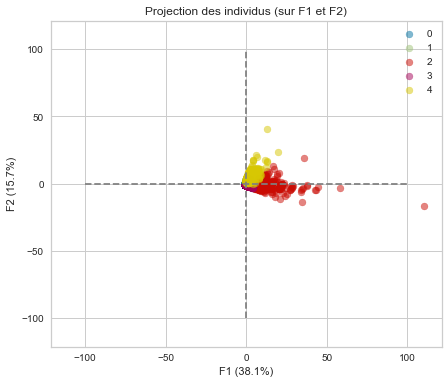

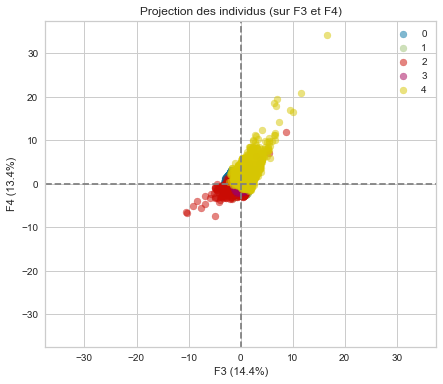

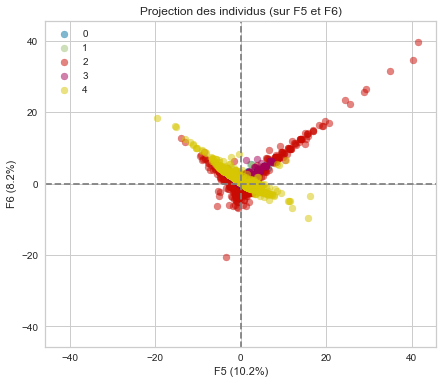

In [289]:
display_pca(rpi_scaled, split=km_rpi5_fit.labels_, n_comp=6)

In [290]:
rpi['cluster'] = km_rpi5.labels_
rpi_scaled['cluster'] = km_rpi5.labels_

Détail par variable : Boxplot

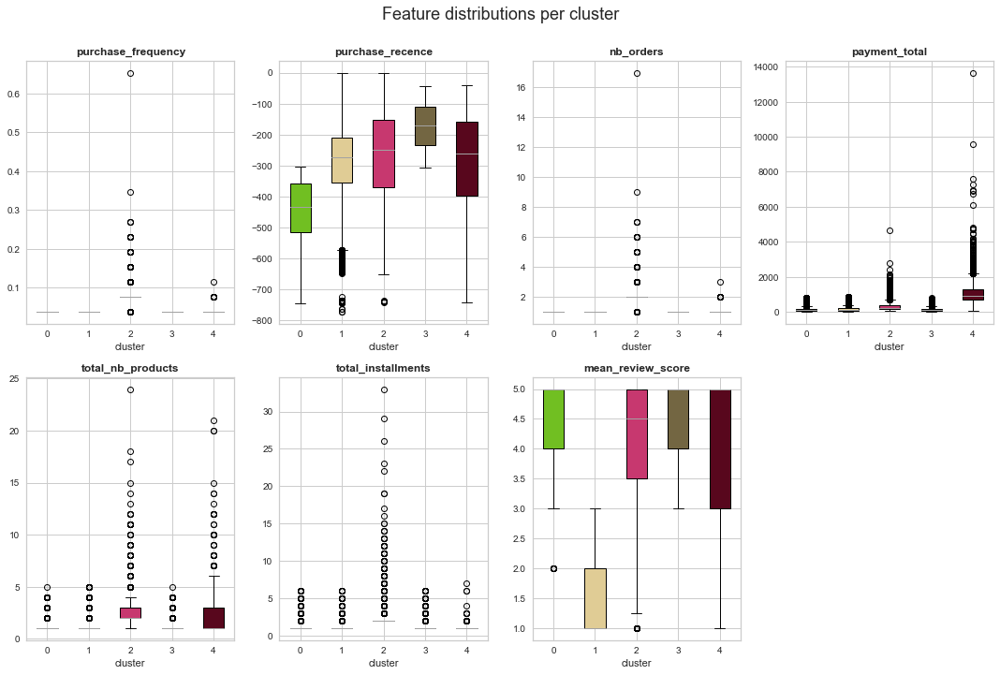

In [291]:
boxplot_visu(rpi, km_rpi5)

Détail par variable : Barplot

In [292]:
X_dev_rel, X_std_mean = data_mean_std(rpi, rpi_scaled)

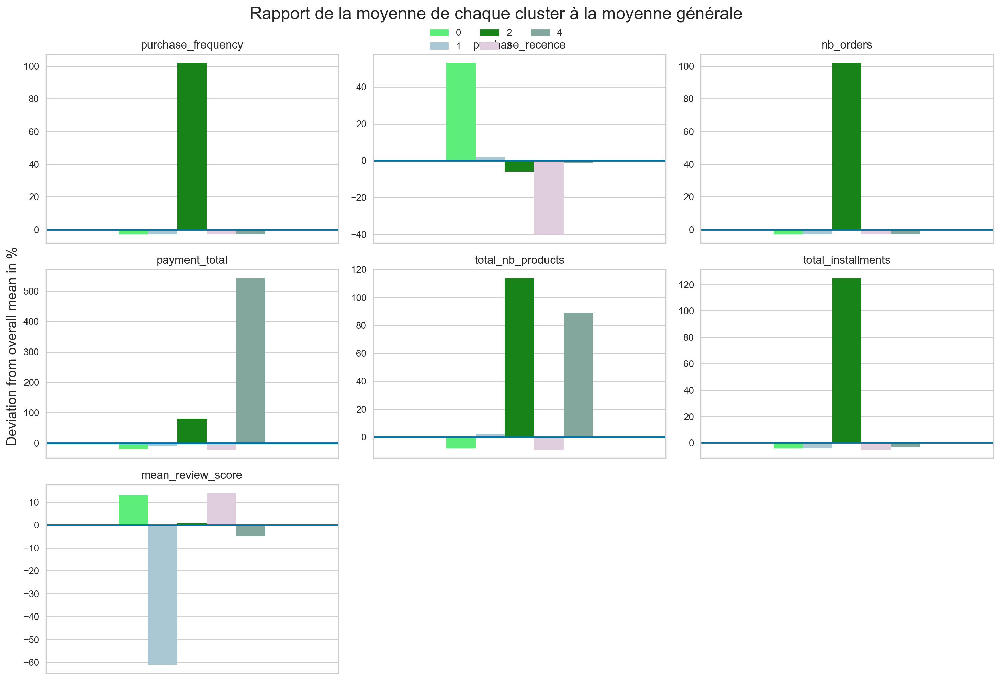

In [293]:
colors = cluster_colors(len(np.unique(km_rpi5.labels_)))
cluster_comparison_bar(rpi, X_dev_rel, colors,
                       title="Rapport de la moyenne de chaque cluster à la moyenne générale")

Détail par cluster : Barplot

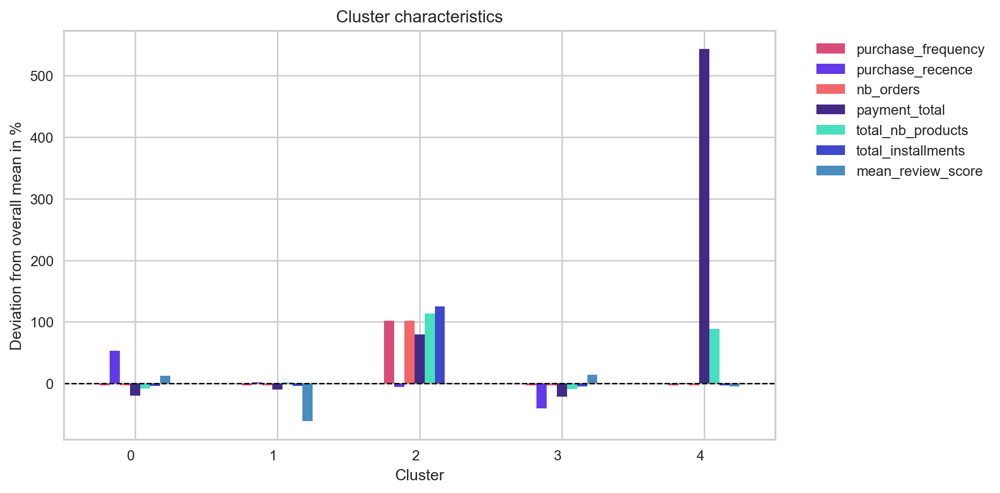

In [294]:
barplot_visu(X_dev_rel, rpi.shape[1])

Détail par cluster : Radarplot

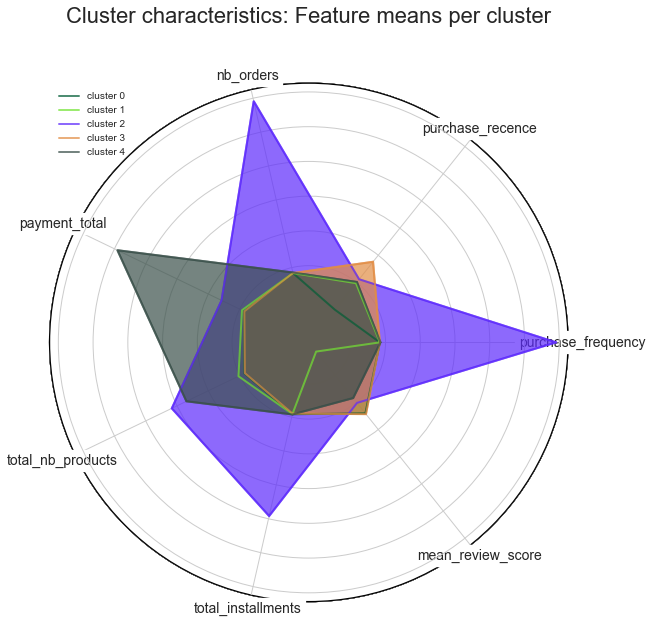

In [295]:
radarplot_visu(X_std_mean, km_rpi5)

### Nb_products & Installments

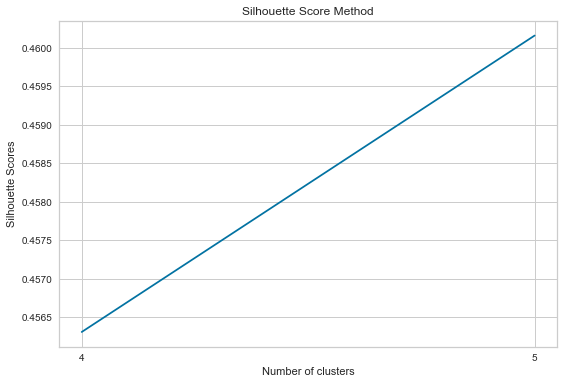

For n_clusters = 4, the average silhouette score is : 0.45631135214029894
For n_clusters = 5, the average silhouette score is : 0.4601579598833433


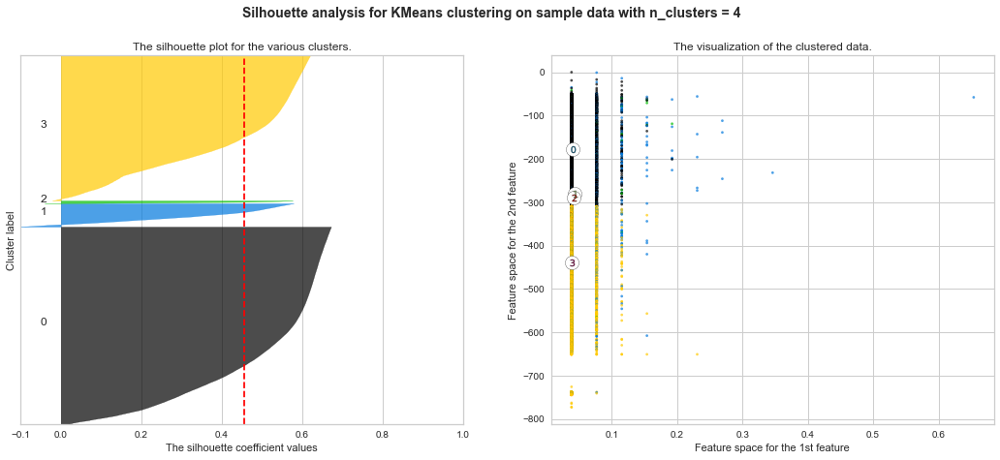

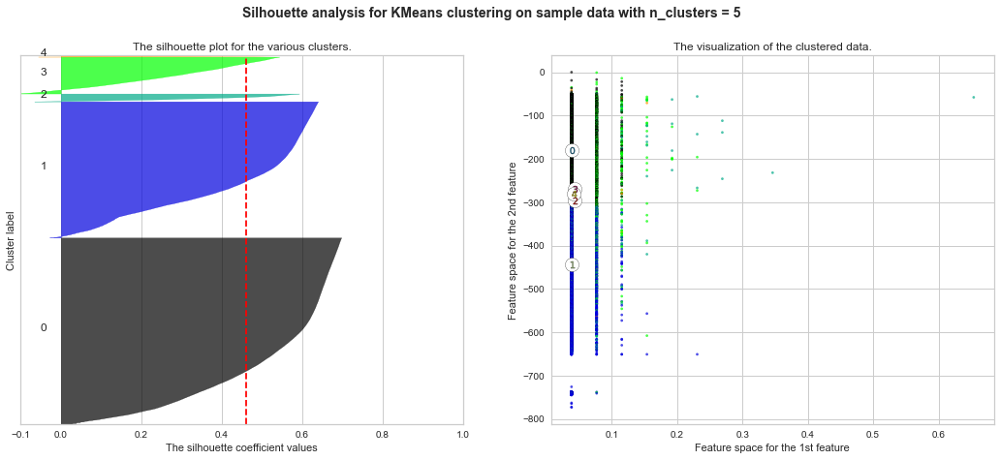

In [238]:
silhouette_visu(nb_ins_scaled, 4, 5)

### Nb_products & Installments : 4 clusters

In [296]:
km_nb_ins = KMeans(n_clusters=4, max_iter=300, tol=1e-04, init='k-means++', n_init=10, random_state=0,
                    algorithm='auto')
km_nb_ins_fit = km_nb_ins.fit(nb_ins_scaled)

Cardinalité et Magnitude

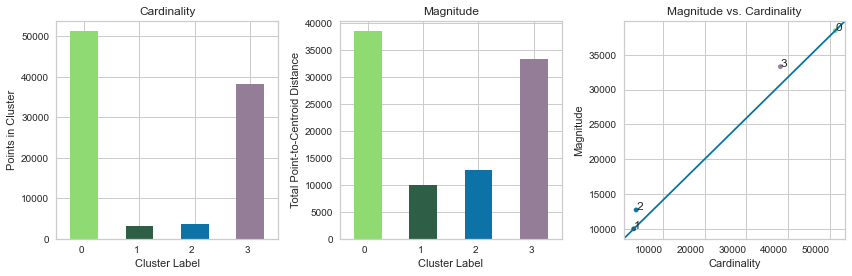

In [297]:
cardinality_magnitude(nb_ins_scaled, km_nb_ins_fit, 4)

Visualisation ACP

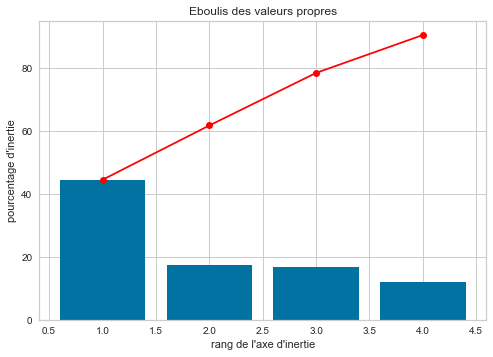

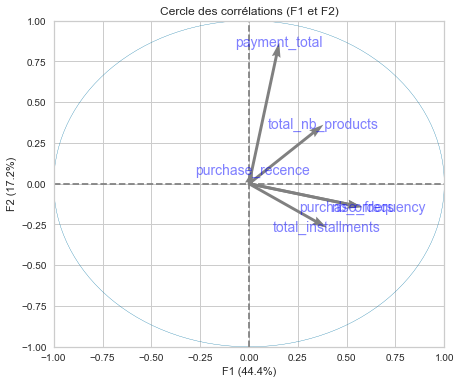

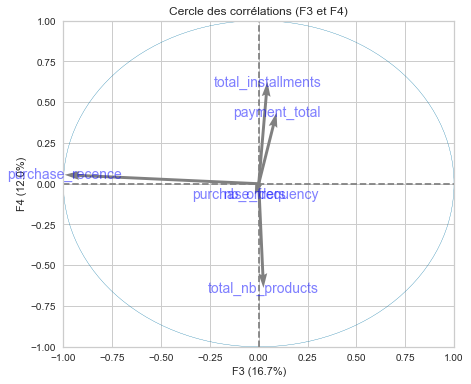

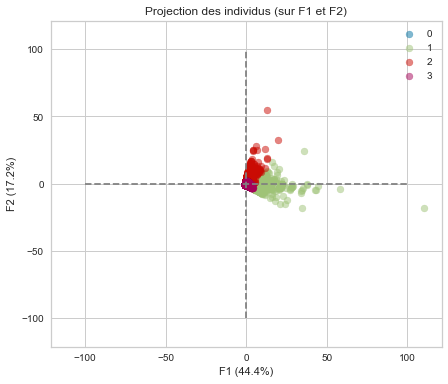

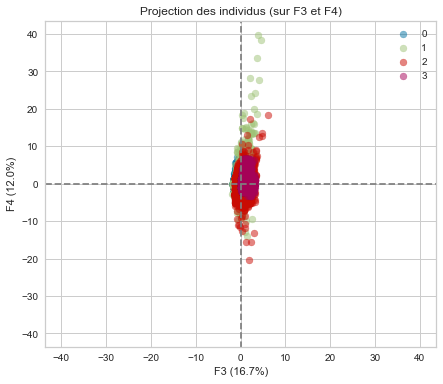

In [299]:
display_pca(nb_ins_scaled, split=km_nb_ins_fit.labels_, n_comp=4)

In [300]:
nb_ins['cluster'] = km_nb_ins.labels_
nb_ins_scaled['cluster'] = km_nb_ins.labels_

Détail par variable : Boxplot

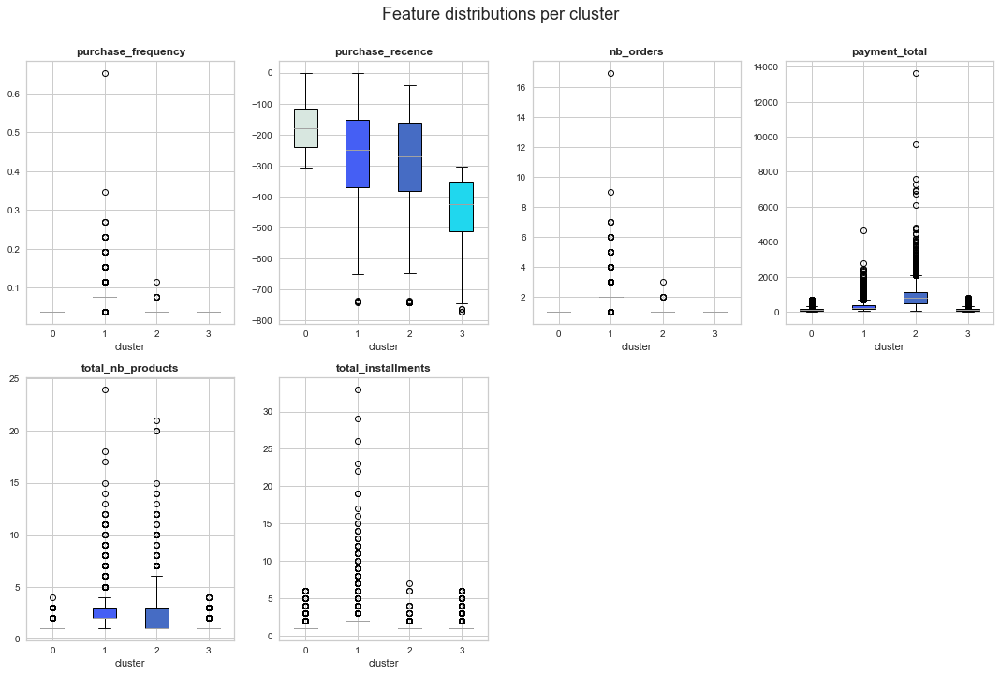

In [301]:
boxplot_visu(nb_ins, km_nb_ins)

Détail par variable : Barplot

In [302]:
X_dev_rel, X_std_mean = data_mean_std(nb_ins, nb_ins_scaled)

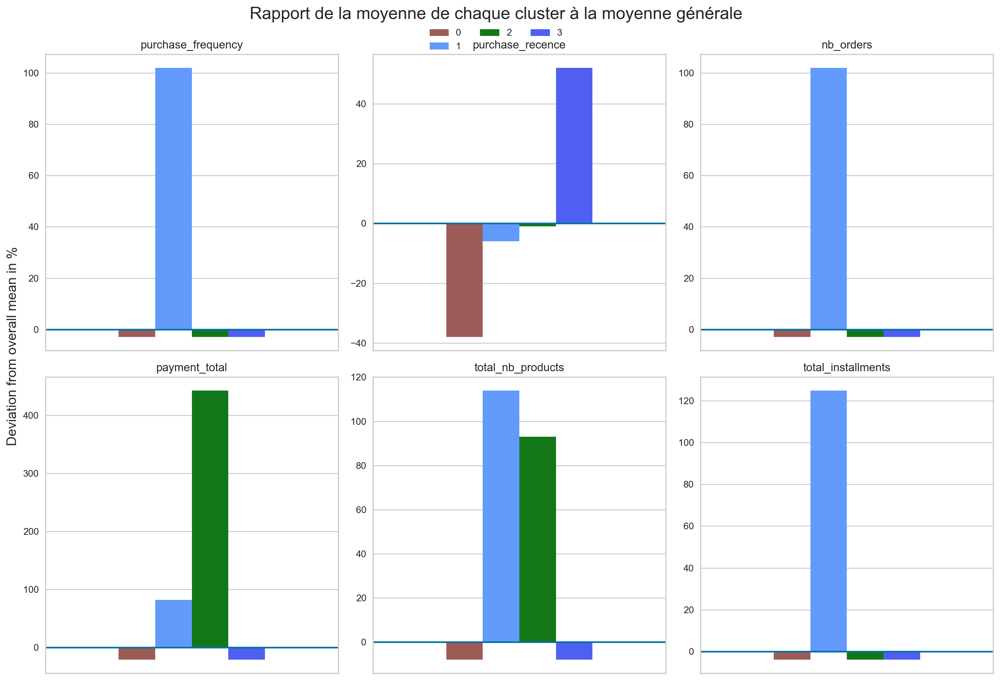

In [303]:
colors = cluster_colors(len(np.unique(km_nb_ins.labels_)))
cluster_comparison_bar(nb_ins, X_dev_rel, colors,
                       title="Rapport de la moyenne de chaque cluster à la moyenne générale")

Détail par cluster : Barplot

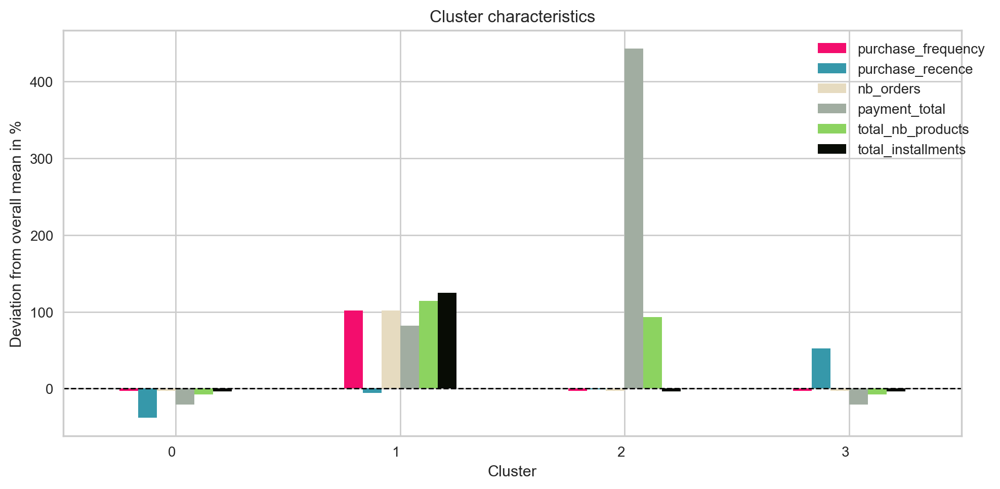

In [304]:
barplot_visu(X_dev_rel, nb_ins.shape[1])

Détail par cluster : Radarplot

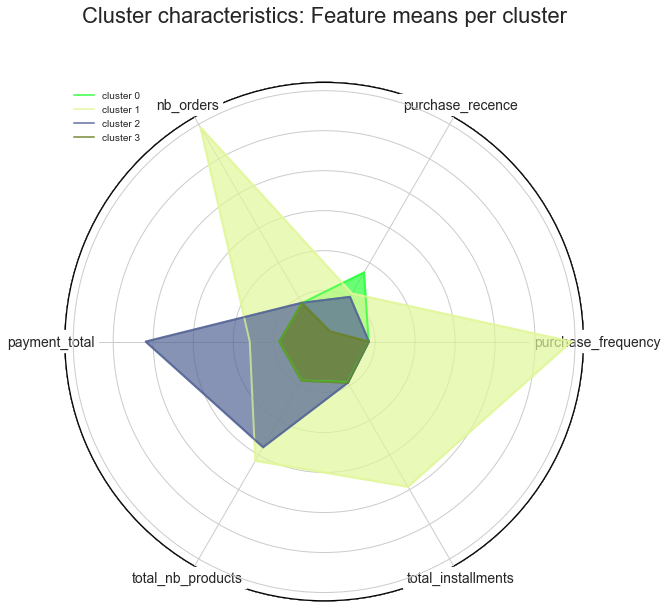

In [305]:
radarplot_visu(X_std_mean, km_nb_ins)

[*(Retour sommaire)*](#ch0)

## <div id="ch3_4" style="color: orange;">3.4 Conclusion sur K-Means</div>

### Variables

- La variable `distance_km` que nous avons identifiée n'influe finalement sur aucun cluster de manière significative
- Toutes les autres variables participent à l'augmentation de la richesse et à l'interprétabilité des profils trouvés

Cette dernière remarque est aisément visible sur un diagramme radar, entre RFM et notre jeu de données complètement unifié pour un même nombre de clusters (3) :

<img src="img/evolution.png">

### Nombre de clusters

Nos différents essais nous ont permis de dégager plusieurs conclusions :
- Plusieurs clusters trouvés dans les division de 3 à 6 clusters sont identifiables malgré l'absence de certaines variables
- La large différence entre les scores silhouettes obtenus pour différentes divisions de clusters (3 clusters : autour de 0.70 / au-delà de 4 clusters : autour de 0.30 ~ 0.40) ne semble pas jouer sur les formes des clusters trouvés pour un même jeu de données, de 3 à 6 clusters
- Au-delà de 6 clusters, la forme des clusters identifiés s'altère et perd de sa pertinence pour une interprétation métier

Cette dernière remarque est visible à travers les diagrammes à barres, comme ici entre les divisions à 5, 6 et 7 clusters du jeu de données complet sans la distance : on voit ci-dessous que les 5 clusters survivent pratiquement sans altération lors de la division à 6 clusters, mais lors de la division à 7 clusters, certains clusters existants sont appauvris.

5 clusters :

<img src="img/barres_c5.png" style="height:300px">

6 clusters :

<img src="img/barres_c6.png" style="height:300px">

7 clusters :

<img src="img/barres_c7.png" style="height:300px">

Cependant, pour notre jeu de données à 8 variables, il est essentiel de considérer la cardialité des clusters.<br>
Ici, on voit que la cardianlité du dernier cluster dans une segmentation à 6 cluster est très faible : moins de 1000 personnes.<br>
On préférera donc la semgentation en 5 clusters.

5 clusters :

<img src="img/model_card.png" style="width: 70%">

6 clusters :

<img src="img/yrpi6_card.png" style="width: 70%">

### Profils

Nous allons donc utiliser un partitionnement à 5 clusters avec un jeu de données constitué de 8 variables :
- `nb_orders` : le nombre de commandes total passées par le client
- `purchase_recence` : le nombre de jours écoulés depuis la dernière commande (exprimé en nombre de jours en date du denrier mois de données disponible)
- `purchase_frequency` : la fréquence d'achat du client (exprimé en nombre d'achat par nombre de mois d'étude)
- `mean_review_score` : le score moyen attribué par le client lors de ses commandes
- `total_nb_products` : le nombre total de produits commandés par le client, toutes commandes confondues
- `total_installments` : le nombre de fractionnements total des paiements du client pour ses achats
- `mean_delivery_delay` : le nombre moyen de jours de décalage entre la date prévue et la date effective de livraison pour l'ensemble des commandes du client
- `payment_total` : le montant total déboursé par le client chez Olist

Voici les profils obtenus grâce à ce partitionnement :
- **Cluster 0 : les ambassadeurs** ==> Clients moyens sur l'ensemble des valeurs, ce sont aussi ceux qui ont le mieux noté leur expérience d'achat chez Olist. Il faut en faire des promoteurs, voire des ambassadeurs d'Olist. On pourrait par exemple imaginer rendre leurs avis publics sur la platforme avec leur consentement, ce qui permettrait de les valoriser et de renforcer leur sentiment d'appartenance à la communauté Olist.
- **Cluster 1 : les impulsifs fortunés** ==> Ils achètent plus de produits et pour plus cher, mais peu souvent. Ce sont les clients avec le plus fort potentiel, car ils achètent rarement en plusieurs fois et ont donc un gros pouvoir d'achat. Une cartographie précise des attentes et des besoins de ces clients (notamment par une étude des achats déjà réalisés) permettra d'envoyer de la publicité ciblée conduisant à un nouvel achat chez Olist.
- **Cluster 2 : les fidèles** ==> Ils achètent plus souvent que les autres, et rapportent plus d'argent. Toutes leurs caractéristiques globalement loin au-dessus de la moyene. Il faut prendre grand soin de ces clients, notamment via des avantages spécifiquement designés pour les clients fidèles.
- **Cluster 3 : les mécontents** ==> Ils ont attribué une note largement inférieure à la moyenne pour leur expérience d'achat chez Olist, et on s'aperçoit que ce sont également les clients qui ont été confrontés aux délais de livraison les plus importants. Ces clients doivent recevoir une attention individualisée immédiate.
- **Cluster 4 : les anciens satisfaits** ==> Clients moyens sur l'ensemble des valeurs et très satisfaits de leur expérience d'achat. Leur dernier achat sur la plateforme étant relativement ancien, ils ont certainement recours à des alternatives entre-temps et Olist ne doit pas être leur plateforme réflexe d'achat. Ils doivent faire l'objet de publicités plus fréquentes afin qu'Olist devienne un choix évident pour eux, et il faut dans la mesure du possible recueillir le feedback afin de comprendre ce qu'ils trouvent à la concurrence et pas chez Olist.

<img src="img/model_radar.png" style="height: 400px">

<img src="img/model_bars.png" style="height: 400px">

[*(Retour sommaire)*](#ch0)

# <div id="ch4" style="color: blue">4. Clustering alternatif</div>

Nous allons à présent tester deux autre algorithmes sur la configuration retenue, afin de comparer les résultats

## <div id="ch4_1" style="color: orange;">4.1 DBSCAN</div>

In [32]:
yrpi_db = yrpi.drop('cluster', axis=1)
yrpi_db_scaled = yrpi_scaled.drop('cluster', axis=1)

DBSCAN seul avec paramètres par défaut :

In [418]:
db = DBSCAN()
db_fit = db.fit(yrpi_db_scaled)

In [419]:
print(f"Nombre de clusters trouvés : {len(np.unique(db.labels_))}")

Nombre de clusters trouvés : 100


Avec modification des hyperparamètres :

In [415]:
db = DBSCAN(eps=5, min_samples=20) # fixer min_sample entre 10 et 100
db_fit = db.fit(yrpi_db_scaled)

MemoryError: 

Avec un K-Means préparatoire :

In [33]:
km_prep = KMeans(n_clusters=50, max_iter=300, tol=1e-04, init='k-means++', n_init=10, random_state=0, algorithm='auto')
km_prep_fit = km_prep.fit(yrpi_db_scaled)

In [34]:
yrpi_db['cluster'] = km_prep_fit.labels_
yrpi_db_scaled['cluster'] = km_prep_fit.labels_

In [35]:
db = DBSCAN(eps=5, min_samples=20)
db_fit = db.fit(yrpi_db_scaled)

In [36]:
print(f"Nombre de clusters trouvés : {len(np.unique(db.labels_))}")

Nombre de clusters trouvés : 12


Visualisation ACP

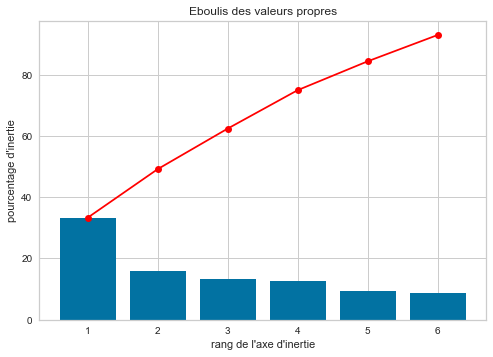

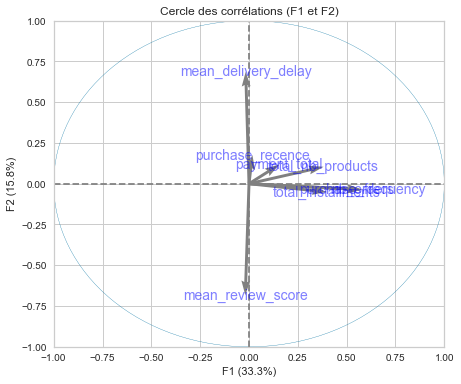

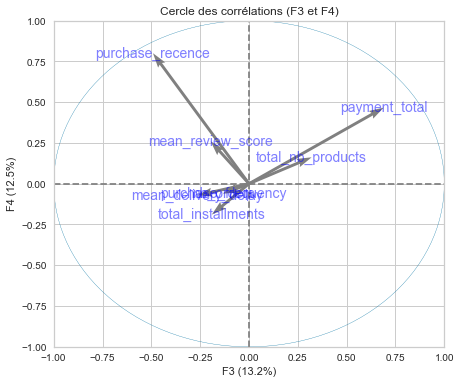

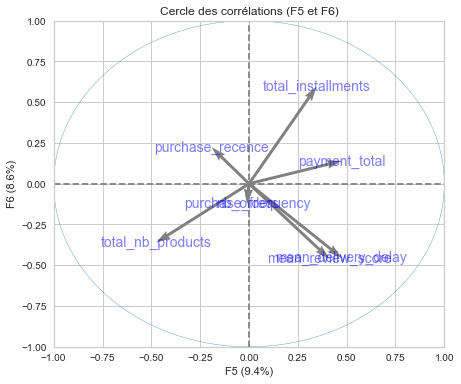

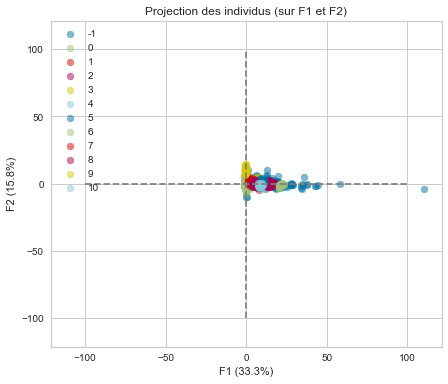

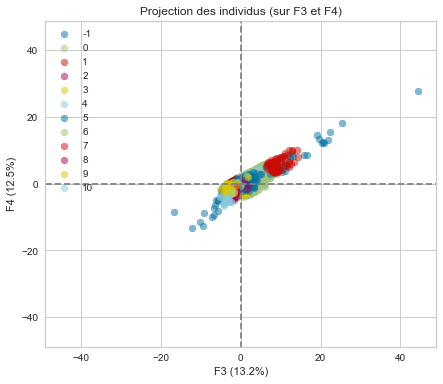

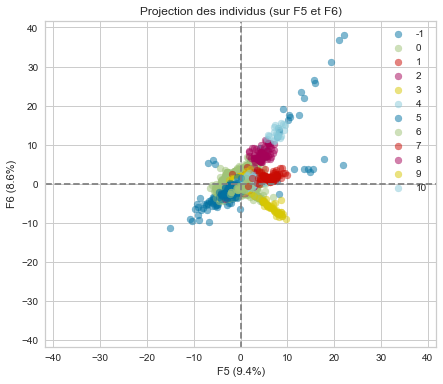

In [431]:
display_pca(yrpi_db_scaled, split=db_fit.labels_, n_comp=6)

In [39]:
yrpi_db['cluster'] = db_fit.labels_
yrpi_db_scaled['cluster'] = db_fit.labels_

Détail par variable : Barplot

In [40]:
X_dev_rel, X_std_mean = data_mean_std(yrpi_db, yrpi_db_scaled)

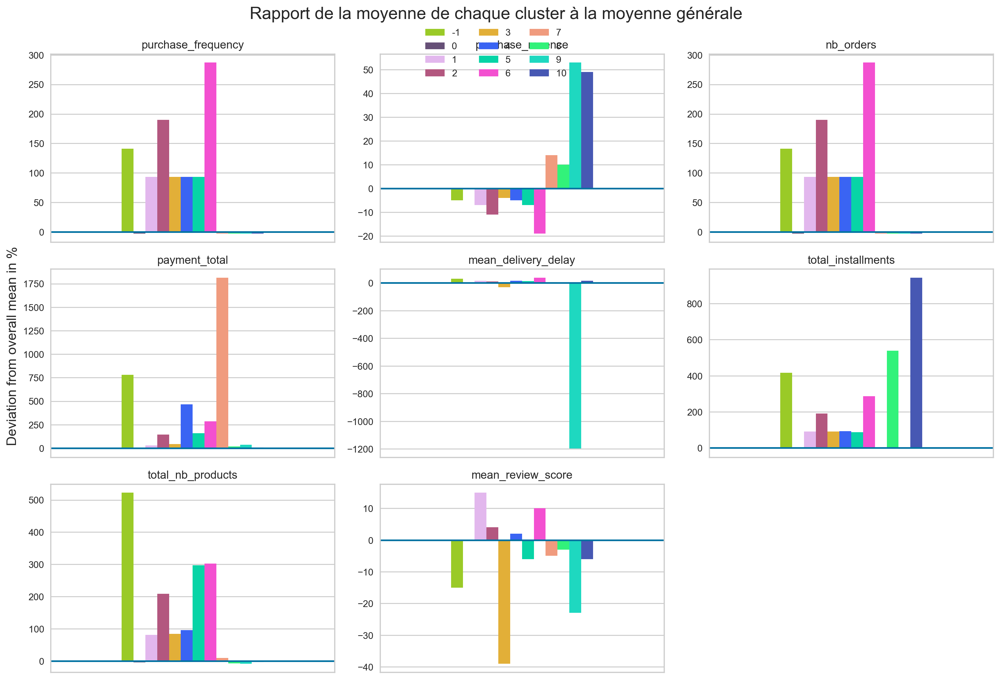

In [41]:
colors = cluster_colors(len(np.unique(db.labels_)))
cluster_comparison_bar(yrpi_db, X_dev_rel, colors,
                       title="Rapport de la moyenne de chaque cluster à la moyenne générale")

Détail par cluster : Barplot

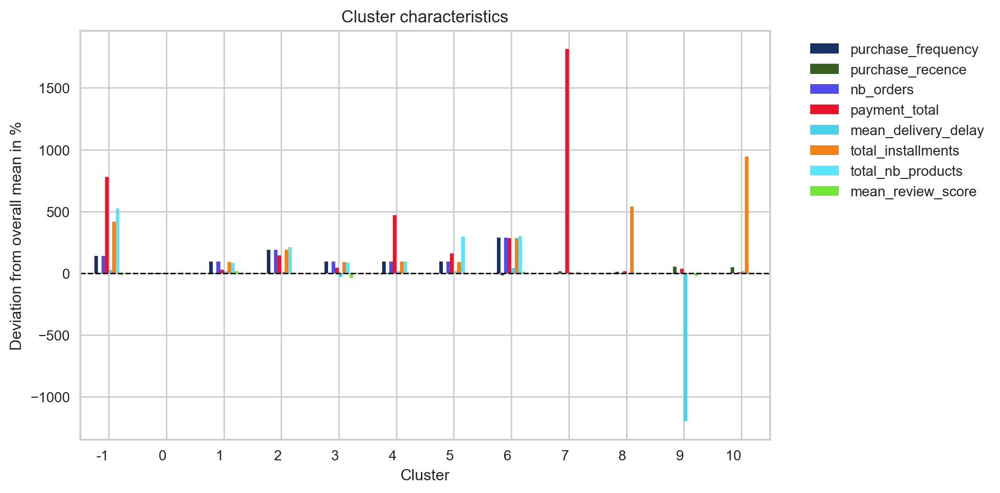

In [42]:
barplot_visu(X_dev_rel, yrpi_db.shape[1])

On constate ici que DBSCAN est plus dificile à apprivoiser que K-Means, et sans doute moins adapté au problème auquel nous sommes confrontés ici.
    
**Utilisation de l'algorithme**
- Une modification des hyperparamètres en faveur de notre clustering conduit à une erreur mémoire
- Un clustering sans modification des hyperparamètres aboutit à une segmentation en 100 clusters, ce qui est ingérable d'un point de vue métier
- Le seul résultat satisfaisant est une utilisation avec modification des hyperparamètres après utilisation préalable d'un K-Means très large (50 cluster), conduisant cette fois-ci à la segmentation en 12 clusters

**Contenu des clusters**
Le barplot par cluster est assez révélateur de l'impossibilité métier d'exploiter les clusters trouvés :
- La moitié des clusters sont similaires (0, 1, 2 et 6 ; 8 et 10), car les valeurs de leurs variables sont proportionnelles d'un cluster à l'autre, révélateur d'une segmentation en différents niveaux d'intensité de ce qui relève en fait du même phénomène.
- D'autres clusters ne se démarquent de la moyenne ou d'autres clusters que par une seule variable (4, 7 et 9), conduisant à des profils clients très pauvres en leviers d'action marketing et donc difficilement exploitables
- Le seul cluster intéressant est le cluster `-1`, qui correspond à notre cluster n°2 (clients "fidèles") trouvé grâce à K-Means.

[*(Retour sommaire)*](#ch0)

## <div id="ch4_2" style="color: orange;">4.2 Clustering hiérarchique</div>

In [43]:
yrpi_agg = yrpi.drop('cluster', axis=1)
yrpi_agg_scaled = yrpi_scaled.drop('cluster', axis=1)

In [24]:
agg = AgglomerativeClustering(n_clusters=6)
agg_fit = agg.fit(yrpi_agg_scaled)

MemoryError: unable to allocate array data.

In [44]:
scaler = StandardScaler()
yrpi_sampled = yrpi_agg.sample(frac=0.5)
yrpi_sampled_scaled = pd.DataFrame(scaler.fit_transform(yrpi_sampled), columns=yrpi_sampled.columns)

In [46]:
agg = AgglomerativeClustering(n_clusters=5)
agg_fit = agg.fit(yrpi_sampled_scaled)

Visualisation ACP

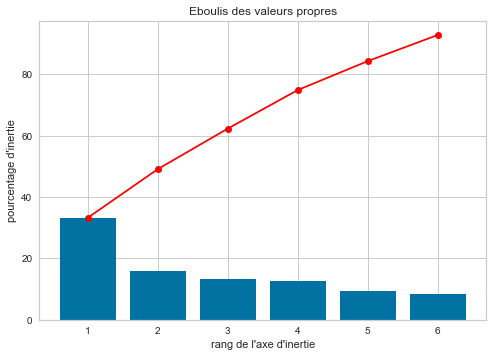

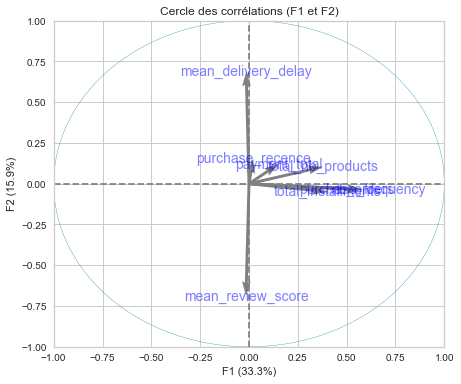

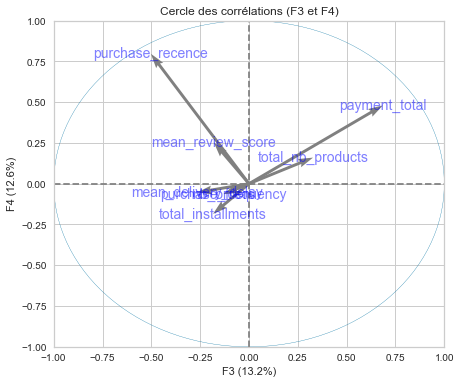

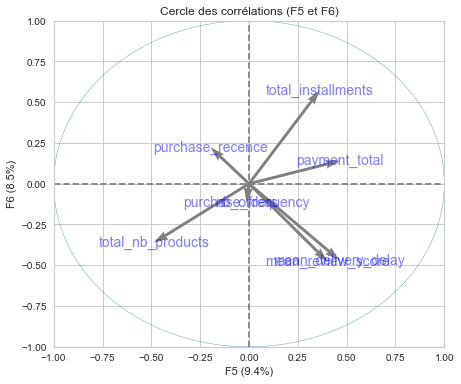

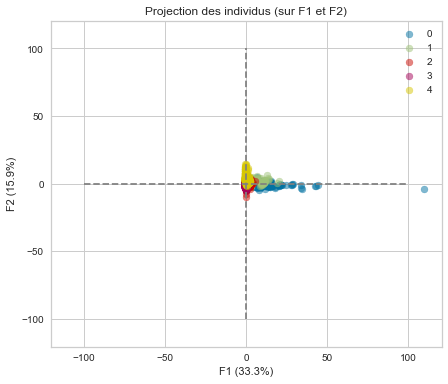

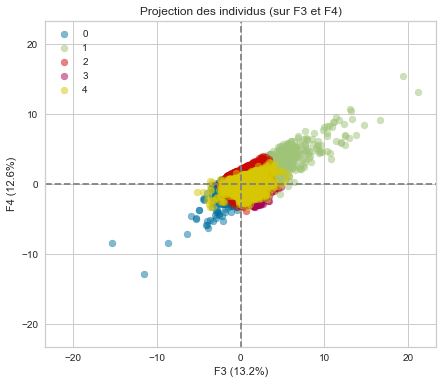

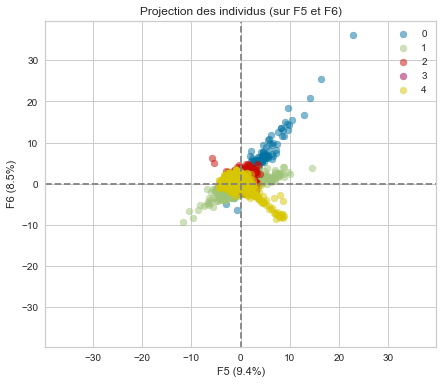

In [47]:
display_pca(yrpi_sampled_scaled, split=agg_fit.labels_, n_comp=6)

In [48]:
yrpi_sampled['cluster'] = agg.labels_
yrpi_sampled_scaled['cluster'] = agg.labels_

Détail par variable : Barplot

In [49]:
X_dev_rel, X_std_mean = data_mean_std(yrpi_sampled, yrpi_sampled_scaled)

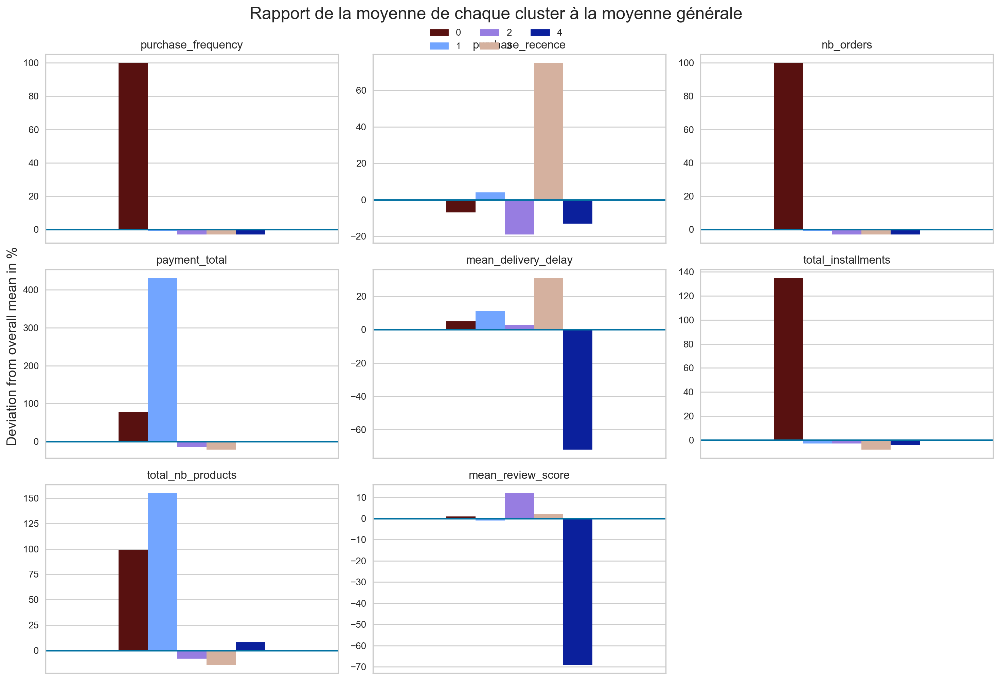

In [50]:
colors = cluster_colors(len(np.unique(agg.labels_)))
cluster_comparison_bar(yrpi_sampled, X_dev_rel, colors,
                       title="Rapport de la moyenne de chaque cluster à la moyenne générale")

Détail par cluster : Barplot

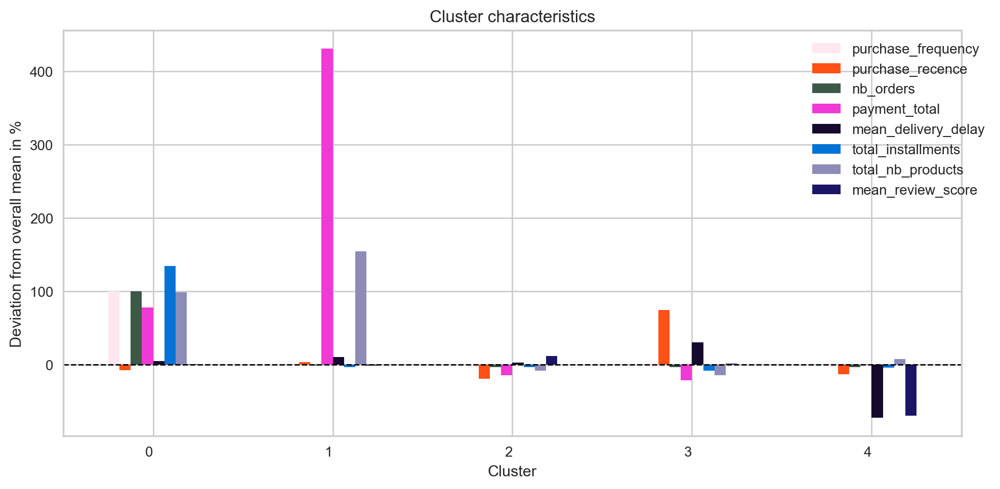

In [51]:
barplot_visu(X_dev_rel, yrpi_sampled.shape[1])

[*(Retour sommaire)*](#ch0)

# <div id="ch5" style="color: blue">5. Conclusion</div>

Les différents essais que nous avons réalisés nous amènent aux conclusions suivantes :

**Clusters**

- Le clusters ne sont jamais de cardinalités comparables, quelque soit le nombre choisi
- Les clusters sont relativement stables et interprétables jusqu'à une segmentation à 6 clusters : à partir de 7, les clusters se délitent et perdent de leur pertinence métier
- Le 6ème cluster ayant une cardinalité très faible, la segmentation en 5 cluster est préféreable

**Variables**

- Seules 8 variables crées au cours du précédent notebook ont été retenues : les variables catégorielles encodées en one-hot n'amennent que du bruit parasite, et la variable `distance_km` quant à elle n'est jamais déterminante pour identifier les clusters
- Chaque ajout de l'une des 5 variables calculées au jeu de données RFM fait baisser le score de silhouette, mais apporte un éclairage bien plus pertinent sur les profils clients :
>-L'ajout de la variable `review_score` fait comparativement beaucoup baisser le score de silhouette, mais permet d'identifier les clients mécontents que nous n'aurions autrement pas pu remarquer
>- Le `total_nb_products` permet de caractériser les clients plus sujets à des ventes additionnelles et donc une augmentation du panier moyen
>- La variable `total_installements` est cruciale d'un point de vue marketing car elle sert à cibler efficacement les campagnes de financement et les contrats avec les organismes de crédit à la consommation
>- `mean_delivery_delay` quant à elle indique clairement le plus gros levier d'amélioration d'Olist et permet d'identfier sans équivoque la cause principale de mécontentement des clients insatisfaits, conformément à ce que nous avions vu dans la partie analyse
>- `nb_orders` enfin est un axe d'analyse précieux car peuvent s'y mesurer les clients sur lesquels la rentabilité de l'entreprise peut se baser pour progresser

**Algorithmes**

- Nous avons comparé le K-Means au DBSCAN et au clustering hiérachique : le K-Means apparaît ici clairement comme la méthode la plus appropriée pour notre problème :
>- **DBSCAN** est soit incapable de trouver un nombre raisonnable de clusters soit difficle à faire converger sans épuisement de la mémoire lorsqu'on touche aux hyperparamètres : seul un pré-entraînement au K-Means nous a permi d'obtenir un résultat entendable, mais là encore la pertinence des clusters trouvés est décevante et le biai introduit par le K-Means diminue l'intérêt de DBSCAN
>- **AgglomerativeClustering** nous confronte également à des problèmes de mémoire, et nous n'avons dû réaliser un sampling des données déjà pauvres à notre disposition afin de la faire converger : non seulement la représentativité des clusters est douteuse, bien que nous ayons trouvé des clusters sensiblement proche de ce que le K-Mean nous a donné

Ayant étudié la segmentation de nos clusters sur l'ensemble de notre jeu de données, nous nous intéresserons dans le prochain notebook à vérifier la stabilité local des clusters trouvés en étudiant leur évolution dans le temps.

[*(Retour sommaire)*](#ch0)